# Import Libraries

In [311]:
import pandas as pd
import random
import numpy as np
import copy
from matplotlib import pyplot as plt

# Functions

In [312]:
# Calculate Distance between two points
def dist(x1,y1,x2,y2):
    return 100 * np.sqrt((y2 - y1) ** 2 + (x2 - x1) ** 2)

In [313]:
# Routes,Demand and Vehicle Type

# V = Max Number of Vehicles
# L = Hard Limit of Vehicles
# C = Customer List
# D = Demand List

def gen_route(V,L,C,D):
    valid = False

    while not valid:
        cust_remain = C.copy()
        cust_remain.remove("Depot")

        solution = []
        g_demand = []
        d = []

        for i in range(0,V):
            solution.append(["Depot"])

        
        while len(cust_remain) > 0:
            loc = random.choice(cust_remain)
            solution[random.randint(0,V-1)].append(loc)
            cust_remain.remove(loc)
        
        solution = [s for s in solution if len(s) > 1]

        for route in solution:
            for r in route:
                d.append(D[C.index(r)])
            g_demand.append(sum(d))
            d = []

        if all(d <= L for d in g_demand):
            valid = True
            
    return solution

In [314]:
# Distance and Cost
def calc_dist(solution, vehicles, dist_matrix,D,C):
    Dist =[]
    g_dist = []
    g_cost = []
    g_demand = []
    g_vehicle = []
    d = []

    for route in solution:
        for r in route:
            d.append(D[C.index(r)])
        g_demand.append(sum(d))
        d = []
    
    for d in g_demand:
        if d <= 25:
            g_vehicle.append('Type A')
        else:
            g_vehicle.append('Type B')

    for s in solution:
        d = []
        p_loc = ""
        for loc in s:
            if s.index(loc) == 0:
                d.append(dist_matrix["Depot"][loc])
                p_loc = loc
            else:
                d.append(dist_matrix[p_loc][loc])
                p_loc = loc
        Dist.append(d)

    for d in Dist:
        g_dist.append(sum(d))
    
    for d in g_dist:
        g_cost.append(d * vehicles['Cost'][g_vehicle[g_dist.index(d)]])



    return Dist, g_dist, g_cost, g_demand, g_vehicle

In [315]:
# Print Report
def report(solution,g_dist,g_cost,g_vehicle,g_demand,Dist):
    print(f"Total Distance = {round(sum(g_dist),4)} km")
    print(f"Total Cost = RM {round(sum(g_cost),2)}\n")

    for i in range(0,len(solution)):
        print(f"Vehicle {i+1} ({g_vehicle[i]}):")
        print(f"Round Trip Distance:{round(g_dist[i],3)} km, Cost: RM {round(g_cost[i],2)}, Demand:{g_demand[i]}")
        route = ""
        for loc in solution[i]:
            idx = solution[i].index(loc)
            if  idx == 0:
                route += loc
            else:
                route += " -> " + f"{loc} ({round(Dist[i][idx],3)} km)"
        print (f"{route}\n")

In [316]:
# Generate neighbours
def gen_neighbour(solution,D,L,C):
    neighbours = []
    r = []
    d=[]
    n_demand = []
    num = len(solution)

    # Swap among routes itself
    for i in range(num):
        r = solution[i]
        if len(solution[i]) != 2:
            for j in range(1,len(r)):
                for k in range(j+1,len(r)):
                    new_r = [r[:] for r in solution]
                    new_r[i][j], new_r[i][k] = new_r[i][k], new_r[i][j]

                    for route in new_r:
                        for r in route:
                            d.append(D[C.index(r)])
                            n_demand.append(sum(d))
                            d = []

                    if all(d <= L for d in n_demand):
                        neighbours.append(new_r)
                        n_demand = []

    # Swap with other routes
    for i in range(num):
        r = solution[i]
        for j in range(1,len(r)):
            for k in range(num):
                if i != k:
                    for l in range(j,len(solution[k])):
                        new_r = [r[:] for r in solution]
                        new_r[i][j], new_r[k][l] = new_r[k][l], new_r[i][j]

                        for route in new_r:
                            for r in route:
                                d.append(D[C.index(r)])
                                n_demand.append(sum(d))
                                d = []

                        if all(d <= L for d in n_demand):
                            neighbours.append(new_r)
                            n_demand = []
    return neighbours

In [317]:
# Tabu Search Algo
def tabu(solution,max_list,num_of_iter,vehicles,dist_matrix,D,L,C):
    cur_sol = copy.deepcopy(solution)
    best_sol = cur_sol
    best_cost = sum(calc_dist(solution,vehicles,dist_matrix,D,C)[2])
    tabu_list = []

    for iter in range(num_of_iter):
        neighbours = gen_neighbour(cur_sol,D,L,C)
        best_n = None
        best_n_cost = 0

        for s in neighbours:
            c = calc_dist(s,vehicles,dist_matrix,D,C)[2]
            if s not in tabu_list:
                n_cost = sum(c)
                if n_cost < best_cost:
                    best_n = s
                    best_n_cost = n_cost
        
        if best_n is not None:
            cur_sol = best_n
            if best_n_cost < best_cost:
                best_sol = best_n
                best_cost = best_n_cost
                
        tabu_list.append(cur_sol)

        if len(tabu_list) > max_list:
            tabu_list.pop(0)

        print(f"Iteration {iter + 1}: Best Cost = {best_cost}")
    
    return best_sol

In [318]:
# Visualise Routes
def plot(solution,x,y,data,name):
    plt.scatter(x, y)
    for i, label in enumerate(n):
        plt.annotate(label, (x[i], y[i]), textcoords="offset points", xytext=(0,10), ha='center')

    for s in solution:
        s_coor = []
        for loc in s:
            if s.index(loc) == len(s)-1:
                s_coor.append([data[data[:,2] == loc,0].astype(float)[0],data[data[:,2] == loc,1].astype(float)[0]])
                s_coor.append([data[data[:,2] == "Depot",0].astype(float)[0],data[data[:,2] == "Depot",1].astype(float)[0]])
            else:
                s_coor.append([data[data[:,2] == loc,0].astype(float)[0],data[data[:,2] == loc,1].astype(float)[0]])
        s_coor = np.array(s_coor)
        plt.plot(s_coor[:, 0], s_coor[:, 1], marker='o')

    plt.xlabel('Longitude')
    plt.ylabel('Latitude')
    plt.title('Customer Locations')
    plt.savefig(f'fig\\{name}.png')
    plt.show()

# Import Data

In [319]:
customers = pd.read_csv("customers.csv")
customers

,Customer,Latitude,Longitude,Demand
0,1,4.3555,113.9777,5
1,2,4.3976,114.0049,8
2,3,4.3163,114.0764,3
3,4,4.3184,113.9932,6
4,5,4.4024,113.9896,5
5,6,4.4142,114.0127,8
6,7,4.4804,114.0734,3
7,8,4.3818,114.2034,6
8,9,4.4935,114.1828,5
9,10,4.4932,114.1322,8


In [320]:
depot = pd.read_csv("depot.csv")
depot

,Customer,Latitude,Longitude,Demand
0,Depot,4.4184,114.0932,0


In [321]:
vehicles = pd.read_csv("vehicles.csv", index_col='Vehicle')
vehicles

,Capacity,Cost
Vehicle,,
Type A,25,1.2
Type B,30,1.5


# Data Preparation

In [322]:
cust = customers
cust['Customer'] = customers['Customer'].apply(lambda x: f'C{x}')
cust

,Customer,Latitude,Longitude,Demand
0,C1,4.3555,113.9777,5
1,C2,4.3976,114.0049,8
2,C3,4.3163,114.0764,3
3,C4,4.3184,113.9932,6
4,C5,4.4024,113.9896,5
5,C6,4.4142,114.0127,8
6,C7,4.4804,114.0734,3
7,C8,4.3818,114.2034,6
8,C9,4.4935,114.1828,5
9,C10,4.4932,114.1322,8


In [323]:
locations = pd.concat([depot,cust]).reset_index(drop=True)
locations

,Customer,Latitude,Longitude,Demand
0,Depot,4.4184,114.0932,0
1,C1,4.3555,113.9777,5
2,C2,4.3976,114.0049,8
3,C3,4.3163,114.0764,3
4,C4,4.3184,113.9932,6
5,C5,4.4024,113.9896,5
6,C6,4.4142,114.0127,8
7,C7,4.4804,114.0734,3
8,C8,4.3818,114.2034,6
9,C9,4.4935,114.1828,5


In [324]:
# Calculate the distance matrix
dist_matrix = pd.DataFrame(index=locations["Customer"], columns=locations["Customer"])

for i in locations["Customer"]:
    for j in locations["Customer"]:
        row_i = locations[locations["Customer"] == i][["Latitude", "Longitude"]]
        row_j = locations[locations["Customer"] == j][["Latitude", "Longitude"]]
        dist_value = dist(row_i["Latitude"].values[0], row_i["Longitude"].values[0], row_j["Latitude"].values[0], row_j["Longitude"].values[0])
        dist_matrix.at[i, j] = dist_value

dist_matrix

Customer,Depot,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10
Customer,,,,,,,,,,,
Depot,0.0,13.151677,9.071676,10.347294,14.142136,10.482824,8.060949,6.508487,11.61189,11.691095,8.435662
C1,13.151677,0.0,5.012235,10.619948,4.020771,4.838616,6.834245,15.734834,22.722716,24.720439,20.695782
C2,9.071676,5.012235,0.0,10.826791,8.005954,1.603527,1.834121,10.746204,19.912782,20.2102,15.920003
C3,10.347294,10.619948,10.826791,0.0,8.32265,12.225976,11.67994,16.412742,14.289594,20.669011,18.549191
C4,14.142136,4.020771,8.005954,8.32265,0.0,8.407711,9.776446,18.076515,21.955318,25.808559,22.332944
C5,10.482824,4.838616,1.603527,12.225976,8.407711,0.0,2.593935,11.448336,21.479013,21.360115,16.905443
C6,8.060949,6.834245,1.834121,11.67994,9.776446,2.593935,0.0,8.981609,19.34328,18.767658,14.32524
C7,6.508487,15.734834,10.746204,16.412742,18.076515,11.448336,8.981609,0.0,16.316237,11.018153,6.017707
C8,11.61189,22.722716,19.912782,14.289594,21.955318,21.479013,19.34328,16.316237,0.0,11.358367,13.220968


In [325]:
# Customers
C = []
for i,rows in locations.iterrows():
    C.append(rows["Customer"])

# Demand
D = []
for i,rows in locations.iterrows():
    D.append(rows["Demand"])

# Size of Customers
N = len(C) - 1

# Hard limit of Vehicles
L = 30

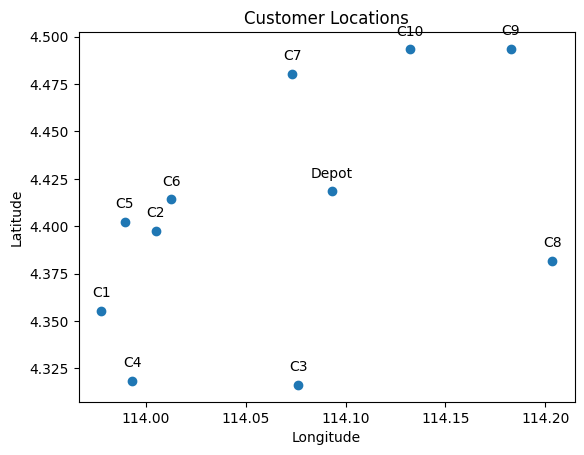

In [326]:
# Visualise Locations
data = []
for i,row in locations.iterrows():
    data.append([row["Longitude"],row["Latitude"],row["Customer"]])

data=np.array(data)

x = data[:, 0].astype(float)
y = data[:, 1].astype(float)
n = data[:, 2]

plt.scatter(x, y)

for i, label in enumerate(n):
    plt.annotate(label, (x[i], y[i]), textcoords="offset points", xytext=(0,10), ha='center')

plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Customer Locations')
plt.show()

# Model

### Generate Solutions

Total Distance = 142.6619 km
Total Cost = RM 213.99

Vehicle 1 (Type B):
Round Trip Distance:60.541 km, Cost: RM 90.81, Demand:27
Depot -> C9 (11.691 km) -> C2 (20.21 km) -> C4 (8.006 km) -> C5 (8.408 km) -> C3 (12.226 km)

Vehicle 2 (Type B):
Round Trip Distance:82.121 km, Cost: RM 123.18, Demand:30
Depot -> C6 (8.061 km) -> C10 (14.325 km) -> C1 (20.696 km) -> C8 (22.723 km) -> C7 (16.316 km)



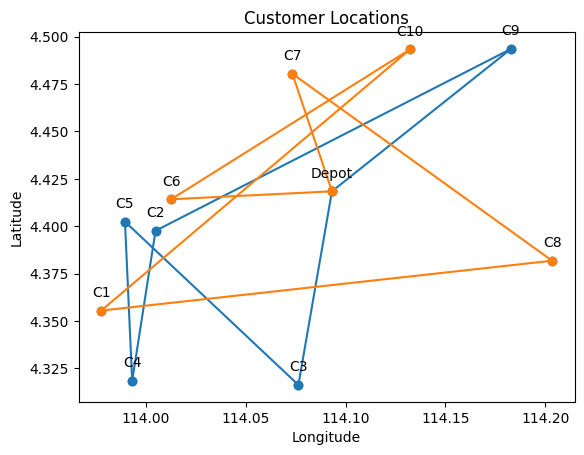

Iteration 1: Best Cost = 209.78636556247102
Iteration 2: Best Cost = 207.48805210548738
Iteration 3: Best Cost = 203.28162683251196
Iteration 4: Best Cost = 184.6237124723604
Iteration 5: Best Cost = 172.61419388421425
Iteration 6: Best Cost = 172.33918399821943
Iteration 7: Best Cost = 158.88081200064545
Iteration 8: Best Cost = 153.05369184706322
Iteration 9: Best Cost = 133.02036206439897
Iteration 10: Best Cost = 132.54411169339653
Iteration 11: Best Cost = 119.78103218110506
Iteration 12: Best Cost = 116.90852961741764
Iteration 13: Best Cost = 115.7777270629447
Iteration 14: Best Cost = 98.14802795984322
Iteration 15: Best Cost = 98.14802795984322
Iteration 16: Best Cost = 98.14802795984322
Iteration 17: Best Cost = 98.14802795984322
Iteration 18: Best Cost = 98.14802795984322
Iteration 19: Best Cost = 98.14802795984322
Iteration 20: Best Cost = 98.14802795984322
Iteration 21: Best Cost = 98.14802795984322
Iteration 22: Best Cost = 98.14802795984322
Iteration 23: Best Cost = 98.1

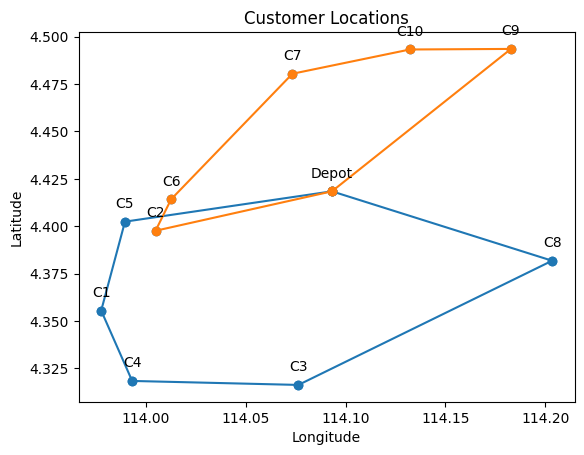

Total Distance = 117.2375 km
Total Cost = RM 175.86

Vehicle 1 (Type B):
Round Trip Distance:58.005 km, Cost: RM 87.01, Demand:27
Depot -> C9 (11.691 km) -> C6 (18.768 km) -> C10 (14.325 km) -> C8 (13.221 km)

Vehicle 2 (Type B):
Round Trip Distance:59.233 km, Cost: RM 88.85, Demand:30
Depot -> C5 (10.483 km) -> C2 (1.604 km) -> C1 (5.012 km) -> C7 (15.735 km) -> C4 (18.077 km) -> C3 (8.323 km)



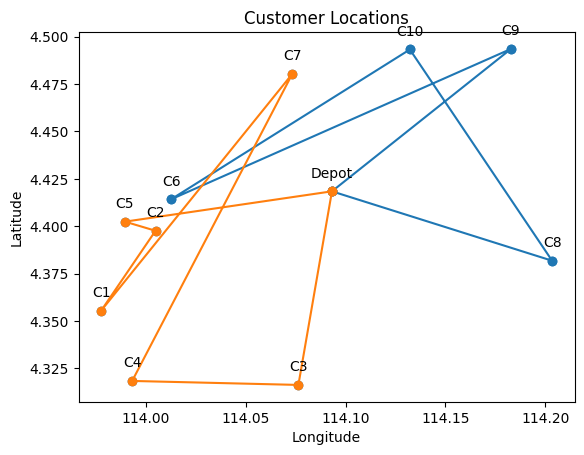

Iteration 1: Best Cost = 166.11094554502824
Iteration 2: Best Cost = 113.79365535828342
Iteration 3: Best Cost = 105.46018654076352
Iteration 4: Best Cost = 104.04135927394518
Iteration 5: Best Cost = 101.52153051444168
Iteration 6: Best Cost = 101.52153051444168
Iteration 7: Best Cost = 101.52153051444168
Iteration 8: Best Cost = 101.52153051444168
Iteration 9: Best Cost = 101.52153051444168
Iteration 10: Best Cost = 101.52153051444168
Iteration 11: Best Cost = 101.52153051444168
Iteration 12: Best Cost = 101.52153051444168
Iteration 13: Best Cost = 101.52153051444168
Iteration 14: Best Cost = 101.52153051444168
Iteration 15: Best Cost = 101.52153051444168
Iteration 16: Best Cost = 101.52153051444168
Iteration 17: Best Cost = 101.52153051444168
Iteration 18: Best Cost = 101.52153051444168
Iteration 19: Best Cost = 101.52153051444168
Iteration 20: Best Cost = 101.52153051444168
Iteration 21: Best Cost = 101.52153051444168
Iteration 22: Best Cost = 101.52153051444168
Iteration 23: Best 

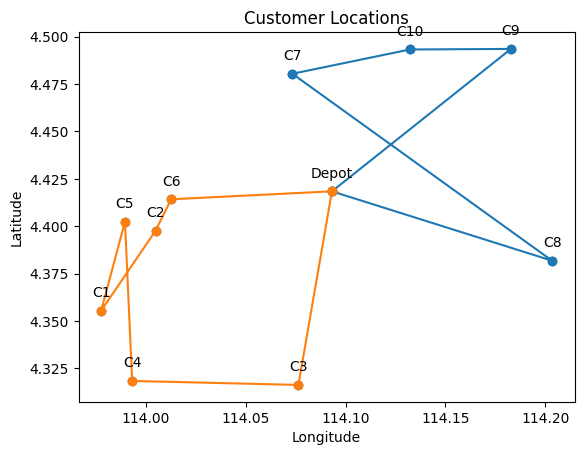

Total Distance = 160.0754 km
Total Cost = RM 240.11

Vehicle 1 (Type B):
Round Trip Distance:103.759 km, Cost: RM 155.64, Demand:30
Depot -> C8 (11.612 km) -> C6 (19.343 km) -> C3 (11.68 km) -> C9 (20.669 km) -> C1 (24.72 km) -> C7 (15.735 km)

Vehicle 2 (Type B):
Round Trip Distance:56.316 km, Cost: RM 84.47, Demand:27
Depot -> C2 (9.072 km) -> C4 (8.006 km) -> C10 (22.333 km) -> C5 (16.905 km)



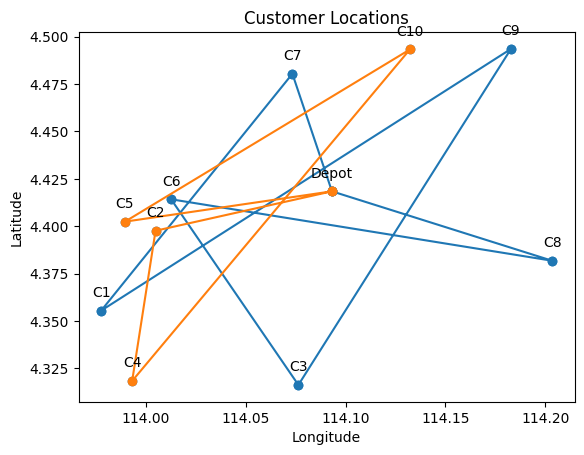

Iteration 1: Best Cost = 193.80870153035107
Iteration 2: Best Cost = 186.13794814194705
Iteration 3: Best Cost = 177.93911235356703
Iteration 4: Best Cost = 136.31289329686058
Iteration 5: Best Cost = 114.95513502830508
Iteration 6: Best Cost = 109.5984375360384
Iteration 7: Best Cost = 102.8439507073785
Iteration 8: Best Cost = 101.78042640046874
Iteration 9: Best Cost = 98.77872465557624
Iteration 10: Best Cost = 98.71144640801305
Iteration 11: Best Cost = 97.73444517422217
Iteration 12: Best Cost = 97.73444517422217
Iteration 13: Best Cost = 97.73444517422217
Iteration 14: Best Cost = 97.73444517422217
Iteration 15: Best Cost = 97.73444517422217
Iteration 16: Best Cost = 97.73444517422217
Iteration 17: Best Cost = 97.73444517422217
Iteration 18: Best Cost = 97.73444517422217
Iteration 19: Best Cost = 97.73444517422217
Iteration 20: Best Cost = 97.73444517422217
Iteration 21: Best Cost = 97.73444517422217
Iteration 22: Best Cost = 97.73444517422217
Iteration 23: Best Cost = 97.734445

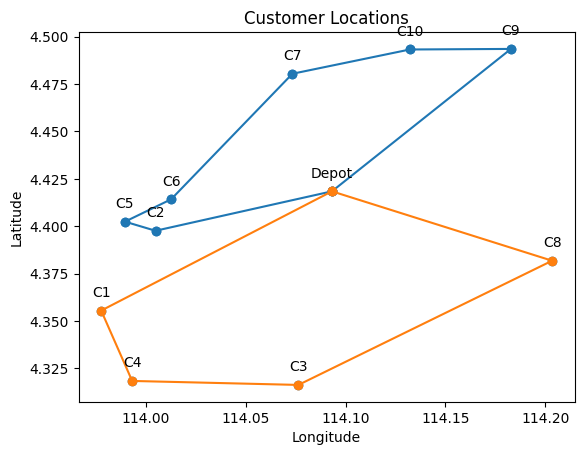

Total Distance = 103.2601 km
Total Cost = RM 154.89

Vehicle 1 (Type B):
Round Trip Distance:41.999 km, Cost: RM 63.0, Demand:30
Depot -> C6 (8.061 km) -> C4 (9.776 km) -> C3 (8.323 km) -> C2 (10.827 km) -> C1 (5.012 km)

Vehicle 2 (Type B):
Round Trip Distance:61.261 km, Cost: RM 91.89, Demand:27
Depot -> C5 (10.483 km) -> C8 (21.479 km) -> C10 (13.221 km) -> C9 (5.06 km) -> C7 (11.018 km)



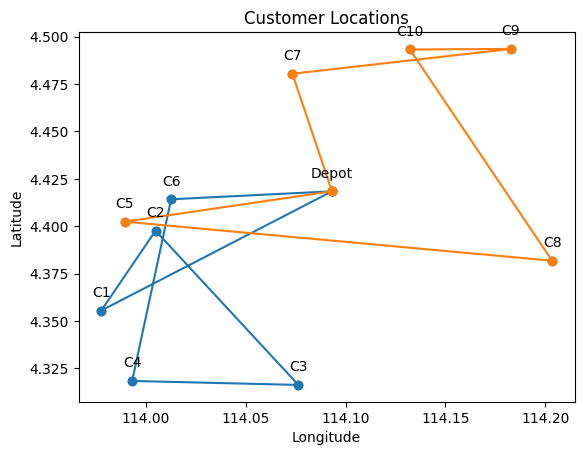

Iteration 1: Best Cost = 152.26245807394918
Iteration 2: Best Cost = 113.15155677438283
Iteration 3: Best Cost = 108.78711513317056
Iteration 4: Best Cost = 107.51974584789934
Iteration 5: Best Cost = 107.17378232836417
Iteration 6: Best Cost = 107.17378232836417
Iteration 7: Best Cost = 107.17378232836417
Iteration 8: Best Cost = 107.17378232836417
Iteration 9: Best Cost = 107.17378232836417
Iteration 10: Best Cost = 107.17378232836417
Iteration 11: Best Cost = 107.17378232836417
Iteration 12: Best Cost = 107.17378232836417
Iteration 13: Best Cost = 107.17378232836417
Iteration 14: Best Cost = 107.17378232836417
Iteration 15: Best Cost = 107.17378232836417
Iteration 16: Best Cost = 107.17378232836417
Iteration 17: Best Cost = 107.17378232836417
Iteration 18: Best Cost = 107.17378232836417
Iteration 19: Best Cost = 107.17378232836417
Iteration 20: Best Cost = 107.17378232836417
Iteration 21: Best Cost = 107.17378232836417
Iteration 22: Best Cost = 107.17378232836417
Iteration 23: Best 

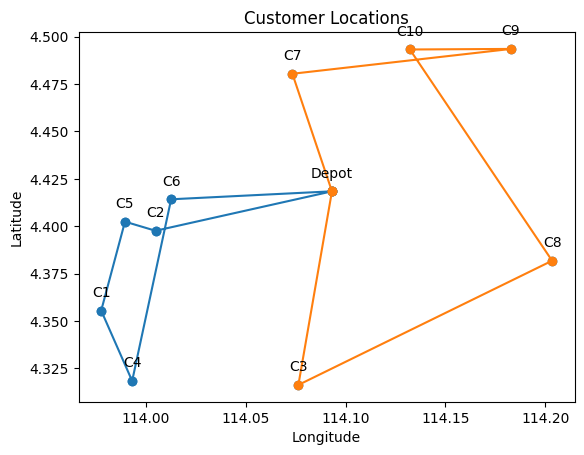

Total Distance = 134.3361 km
Total Cost = RM 201.5

Vehicle 1 (Type B):
Round Trip Distance:79.286 km, Cost: RM 118.93, Demand:27
Depot -> C9 (11.691 km) -> C3 (20.669 km) -> C5 (12.226 km) -> C8 (21.479 km) -> C10 (13.221 km)

Vehicle 2 (Type B):
Round Trip Distance:55.05 km, Cost: RM 82.57, Demand:30
Depot -> C1 (13.152 km) -> C6 (6.834 km) -> C7 (8.982 km) -> C4 (18.077 km) -> C2 (8.006 km)



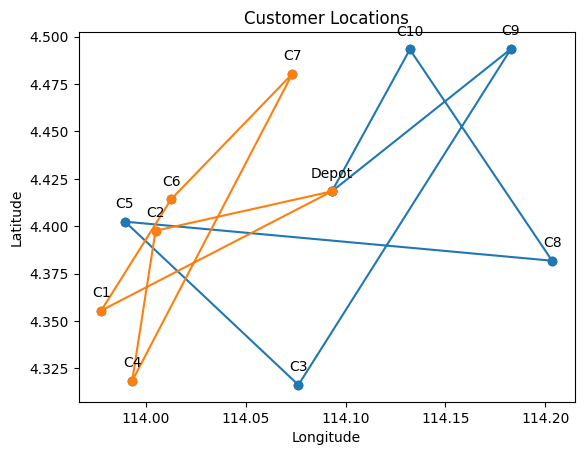

Iteration 1: Best Cost = 181.98235691772203
Iteration 2: Best Cost = 156.94629766362522
Iteration 3: Best Cost = 154.06594137820986
Iteration 4: Best Cost = 140.2754192021685
Iteration 5: Best Cost = 132.02108206439834
Iteration 6: Best Cost = 117.52965714358041
Iteration 7: Best Cost = 99.98625689123402
Iteration 8: Best Cost = 98.3529359129748
Iteration 9: Best Cost = 95.97578410309008
Iteration 10: Best Cost = 92.97408235819756
Iteration 11: Best Cost = 92.97408235819756
Iteration 12: Best Cost = 92.97408235819756
Iteration 13: Best Cost = 92.97408235819756
Iteration 14: Best Cost = 92.97408235819756
Iteration 15: Best Cost = 92.97408235819756
Iteration 16: Best Cost = 92.97408235819756
Iteration 17: Best Cost = 92.97408235819756
Iteration 18: Best Cost = 92.97408235819756
Iteration 19: Best Cost = 92.97408235819756
Iteration 20: Best Cost = 92.97408235819756
Iteration 21: Best Cost = 92.97408235819756
Iteration 22: Best Cost = 92.97408235819756
Iteration 23: Best Cost = 92.97408235

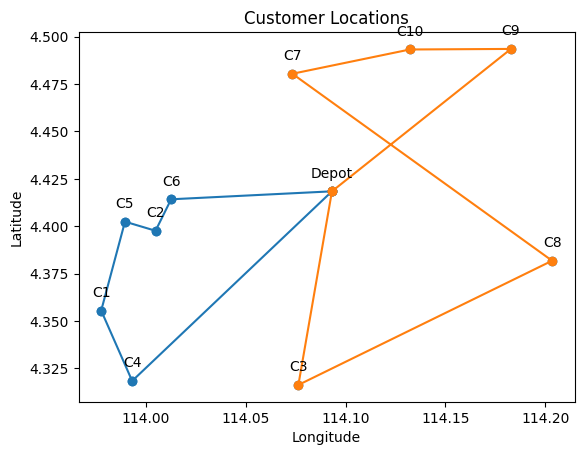

Total Distance = 148.7117 km
Total Cost = RM 223.07

Vehicle 1 (Type B):
Round Trip Distance:78.779 km, Cost: RM 118.17, Demand:30
Depot -> C3 (10.347 km) -> C7 (16.413 km) -> C4 (18.077 km) -> C5 (8.408 km) -> C1 (4.839 km) -> C10 (20.696 km)

Vehicle 2 (Type B):
Round Trip Distance:69.933 km, Cost: RM 104.9, Demand:27
Depot -> C8 (11.612 km) -> C6 (19.343 km) -> C9 (18.768 km) -> C2 (20.21 km)



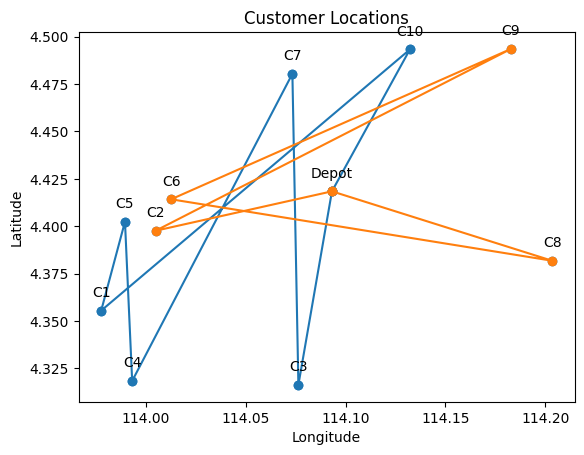

Iteration 1: Best Cost = 176.8170464913864
Iteration 2: Best Cost = 163.44663833264542
Iteration 3: Best Cost = 157.70186090149173
Iteration 4: Best Cost = 154.89605806082005
Iteration 5: Best Cost = 113.68459803375308
Iteration 6: Best Cost = 105.07282186113453
Iteration 7: Best Cost = 95.61053398599122
Iteration 8: Best Cost = 95.61053398599122
Iteration 9: Best Cost = 95.61053398599122
Iteration 10: Best Cost = 95.61053398599122
Iteration 11: Best Cost = 95.61053398599122
Iteration 12: Best Cost = 95.61053398599122
Iteration 13: Best Cost = 95.61053398599122
Iteration 14: Best Cost = 95.61053398599122
Iteration 15: Best Cost = 95.61053398599122
Iteration 16: Best Cost = 95.61053398599122
Iteration 17: Best Cost = 95.61053398599122
Iteration 18: Best Cost = 95.61053398599122
Iteration 19: Best Cost = 95.61053398599122
Iteration 20: Best Cost = 95.61053398599122
Iteration 21: Best Cost = 95.61053398599122
Iteration 22: Best Cost = 95.61053398599122
Iteration 23: Best Cost = 95.6105339

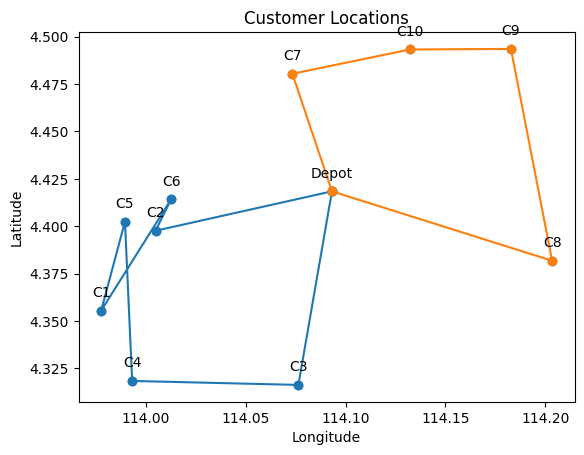

Total Distance = 156.7142 km
Total Cost = RM 235.07

Vehicle 1 (Type B):
Round Trip Distance:77.455 km, Cost: RM 116.18, Demand:28
Depot -> C6 (8.061 km) -> C7 (8.982 km) -> C1 (15.735 km) -> C8 (22.723 km) -> C4 (21.955 km)

Vehicle 2 (Type B):
Round Trip Distance:79.259 km, Cost: RM 118.89, Demand:29
Depot -> C5 (10.483 km) -> C9 (21.36 km) -> C3 (20.669 km) -> C2 (10.827 km) -> C10 (15.92 km)



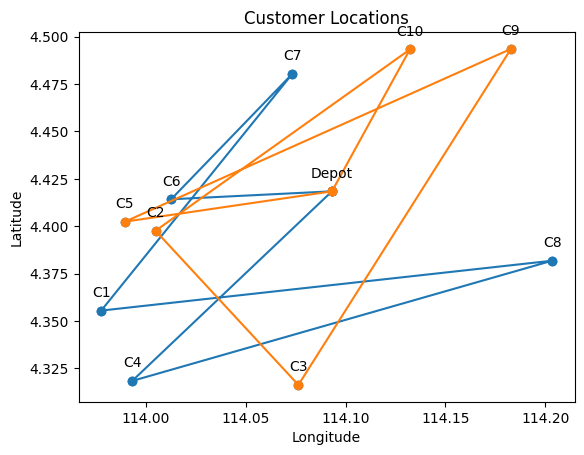

Iteration 1: Best Cost = 210.0986549673139
Iteration 2: Best Cost = 187.0726793971454
Iteration 3: Best Cost = 181.04359806318058
Iteration 4: Best Cost = 165.3137566277993
Iteration 5: Best Cost = 163.4021687286663
Iteration 6: Best Cost = 161.59504150375273
Iteration 7: Best Cost = 111.49995708979725
Iteration 8: Best Cost = 105.35831659747193
Iteration 9: Best Cost = 95.89602872232864
Iteration 10: Best Cost = 91.53984868078001
Iteration 11: Best Cost = 91.53984868078001
Iteration 12: Best Cost = 91.53984868078001
Iteration 13: Best Cost = 91.53984868078001
Iteration 14: Best Cost = 91.53984868078001
Iteration 15: Best Cost = 91.53984868078001
Iteration 16: Best Cost = 91.53984868078001
Iteration 17: Best Cost = 91.53984868078001
Iteration 18: Best Cost = 91.53984868078001
Iteration 19: Best Cost = 91.53984868078001
Iteration 20: Best Cost = 91.53984868078001
Iteration 21: Best Cost = 91.53984868078001
Iteration 22: Best Cost = 91.53984868078001
Iteration 23: Best Cost = 91.53984868

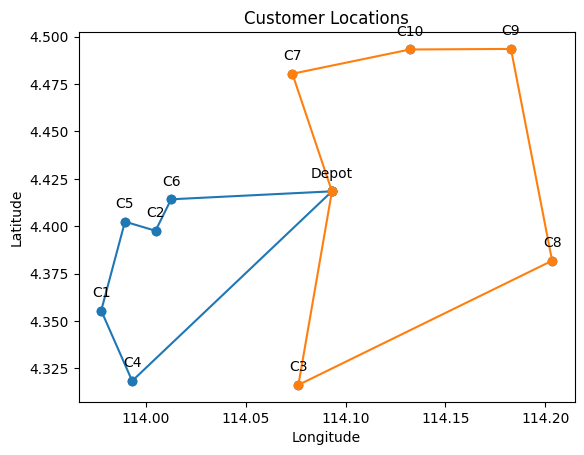

Total Distance = 148.2513 km
Total Cost = RM 222.38

Vehicle 1 (Type B):
Round Trip Distance:81.608 km, Cost: RM 122.41, Demand:27
Depot -> C4 (14.142 km) -> C9 (25.809 km) -> C2 (20.21 km) -> C3 (10.827 km) -> C1 (10.62 km)

Vehicle 2 (Type B):
Round Trip Distance:66.644 km, Cost: RM 99.97, Demand:30
Depot -> C6 (8.061 km) -> C8 (19.343 km) -> C7 (16.316 km) -> C10 (6.018 km) -> C5 (16.905 km)



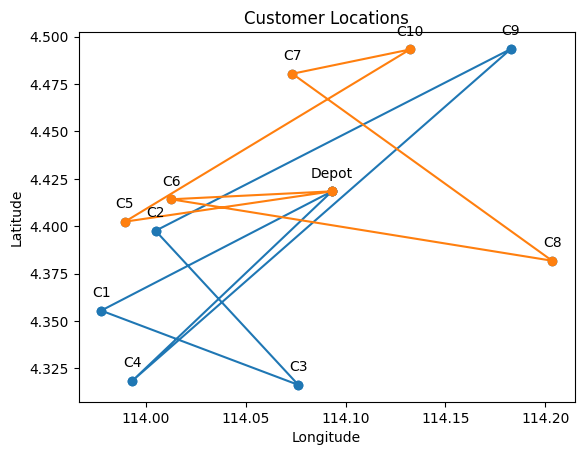

Iteration 1: Best Cost = 213.81553214701313
Iteration 2: Best Cost = 188.86873064800005
Iteration 3: Best Cost = 170.24098439348194
Iteration 4: Best Cost = 165.9390801109474
Iteration 5: Best Cost = 157.76491964383175
Iteration 6: Best Cost = 150.38989151019052
Iteration 7: Best Cost = 123.90660207964848
Iteration 8: Best Cost = 123.31575602547511
Iteration 9: Best Cost = 119.99558609240079
Iteration 10: Best Cost = 102.50608565073753
Iteration 11: Best Cost = 100.12893384085281
Iteration 12: Best Cost = 97.1272320959603
Iteration 13: Best Cost = 94.60740333645678
Iteration 14: Best Cost = 92.97408235819756
Iteration 15: Best Cost = 92.97408235819756
Iteration 16: Best Cost = 92.97408235819756
Iteration 17: Best Cost = 92.97408235819756
Iteration 18: Best Cost = 92.97408235819756
Iteration 19: Best Cost = 92.97408235819756
Iteration 20: Best Cost = 92.97408235819756
Iteration 21: Best Cost = 92.97408235819756
Iteration 22: Best Cost = 92.97408235819756
Iteration 23: Best Cost = 92.974

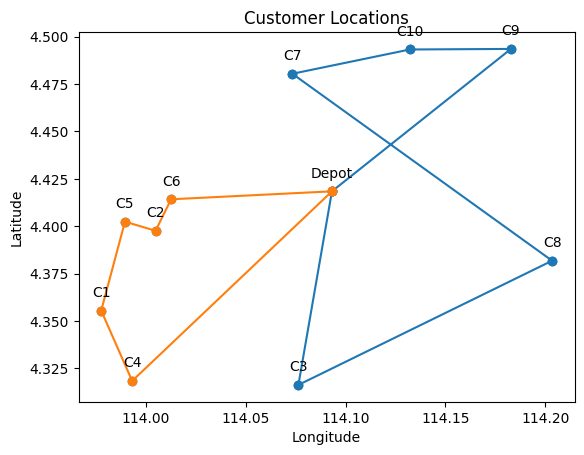

Total Distance = 107.5642 km
Total Cost = RM 161.35

Vehicle 1 (Type B):
Round Trip Distance:69.681 km, Cost: RM 104.52, Demand:28
Depot -> C1 (13.152 km) -> C10 (20.696 km) -> C8 (13.221 km) -> C3 (14.29 km) -> C4 (8.323 km)

Vehicle 2 (Type B):
Round Trip Distance:37.884 km, Cost: RM 56.83, Demand:29
Depot -> C9 (11.691 km) -> C7 (11.018 km) -> C2 (10.746 km) -> C6 (1.834 km) -> C5 (2.594 km)



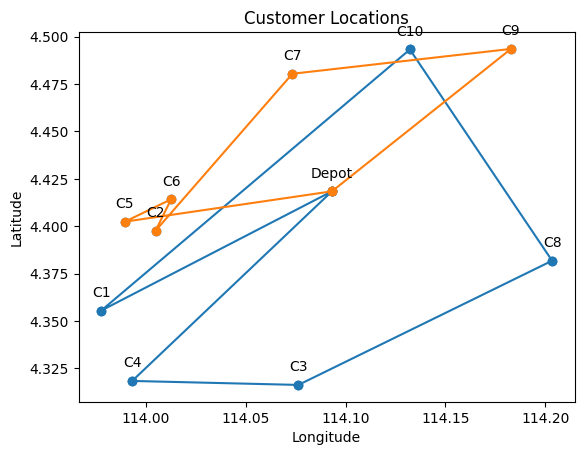

Iteration 1: Best Cost = 148.6061201818361
Iteration 2: Best Cost = 147.96009048181025
Iteration 3: Best Cost = 140.78068360975522
Iteration 4: Best Cost = 140.5354050422729
Iteration 5: Best Cost = 125.52089720428842
Iteration 6: Best Cost = 97.89245885659223
Iteration 7: Best Cost = 97.89245885659223
Iteration 8: Best Cost = 97.89245885659223
Iteration 9: Best Cost = 97.89245885659223
Iteration 10: Best Cost = 97.89245885659223
Iteration 11: Best Cost = 97.89245885659223
Iteration 12: Best Cost = 97.89245885659223
Iteration 13: Best Cost = 97.89245885659223
Iteration 14: Best Cost = 97.89245885659223
Iteration 15: Best Cost = 97.89245885659223
Iteration 16: Best Cost = 97.89245885659223
Iteration 17: Best Cost = 97.89245885659223
Iteration 18: Best Cost = 97.89245885659223
Iteration 19: Best Cost = 97.89245885659223
Iteration 20: Best Cost = 97.89245885659223
Iteration 21: Best Cost = 97.89245885659223
Iteration 22: Best Cost = 97.89245885659223
Iteration 23: Best Cost = 97.892458856

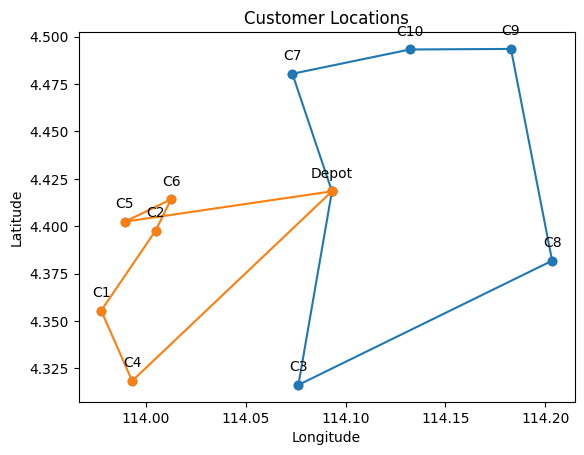

Total Distance = 122.4595 km
Total Cost = RM 183.69

Vehicle 1 (Type B):
Round Trip Distance:68.736 km, Cost: RM 103.1, Demand:27
Depot -> C4 (14.142 km) -> C3 (8.323 km) -> C9 (20.669 km) -> C6 (18.768 km) -> C1 (6.834 km)

Vehicle 2 (Type B):
Round Trip Distance:53.724 km, Cost: RM 80.59, Demand:30
Depot -> C10 (8.436 km) -> C2 (15.92 km) -> C5 (1.604 km) -> C7 (11.448 km) -> C8 (16.316 km)



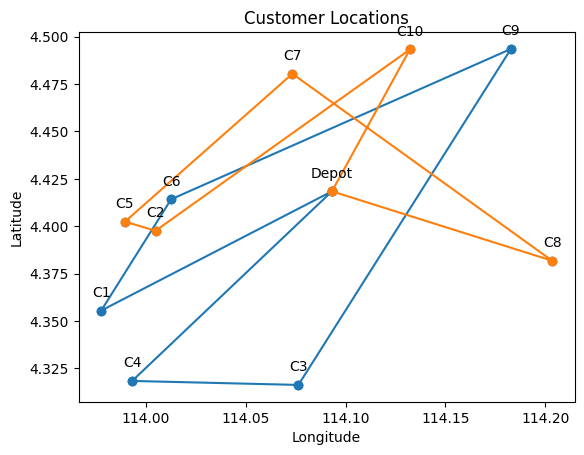

Iteration 1: Best Cost = 165.34046194010926
Iteration 2: Best Cost = 159.78675502952092
Iteration 3: Best Cost = 156.87057216634003
Iteration 4: Best Cost = 145.942462691971
Iteration 5: Best Cost = 128.5647580844402
Iteration 6: Best Cost = 127.57592926816902
Iteration 7: Best Cost = 127.13972405659065
Iteration 8: Best Cost = 126.01698062212397
Iteration 9: Best Cost = 125.47163280380306
Iteration 10: Best Cost = 113.64054168338373
Iteration 11: Best Cost = 111.26338987349901
Iteration 12: Best Cost = 108.2616881286065
Iteration 13: Best Cost = 108.2616881286065
Iteration 14: Best Cost = 108.2616881286065
Iteration 15: Best Cost = 108.2616881286065
Iteration 16: Best Cost = 108.2616881286065
Iteration 17: Best Cost = 108.2616881286065
Iteration 18: Best Cost = 108.2616881286065
Iteration 19: Best Cost = 108.2616881286065
Iteration 20: Best Cost = 108.2616881286065
Iteration 21: Best Cost = 108.2616881286065
Iteration 22: Best Cost = 108.2616881286065
Iteration 23: Best Cost = 108.261

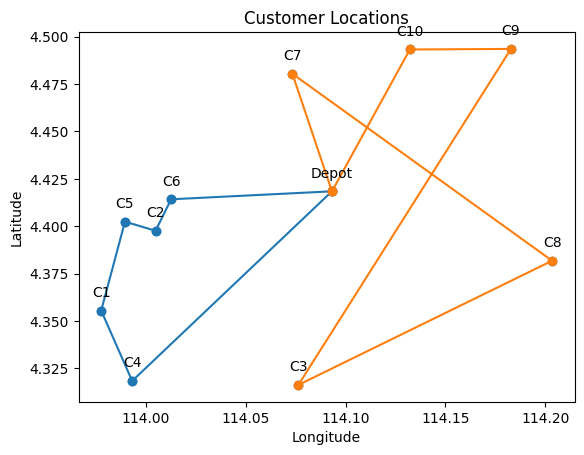

Total Distance = 128.7914 km
Total Cost = RM 193.19

Vehicle 1 (Type B):
Round Trip Distance:67.384 km, Cost: RM 101.08, Demand:29
Depot -> C10 (8.436 km) -> C6 (14.325 km) -> C5 (2.594 km) -> C9 (21.36 km) -> C3 (20.669 km)

Vehicle 2 (Type B):
Round Trip Distance:61.407 km, Cost: RM 92.11, Demand:28
Depot -> C1 (13.152 km) -> C4 (4.021 km) -> C2 (8.006 km) -> C8 (19.913 km) -> C7 (16.316 km)



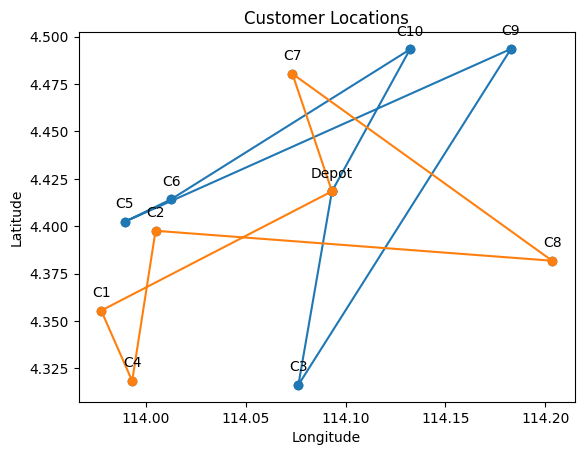

Iteration 1: Best Cost = 175.67082560935262
Iteration 2: Best Cost = 149.91479621839176
Iteration 3: Best Cost = 148.37487009945184
Iteration 4: Best Cost = 132.22308995027373
Iteration 5: Best Cost = 129.1287263690477
Iteration 6: Best Cost = 129.1287263690477
Iteration 7: Best Cost = 129.1287263690477
Iteration 8: Best Cost = 129.1287263690477
Iteration 9: Best Cost = 129.1287263690477
Iteration 10: Best Cost = 129.1287263690477
Iteration 11: Best Cost = 129.1287263690477
Iteration 12: Best Cost = 129.1287263690477
Iteration 13: Best Cost = 129.1287263690477
Iteration 14: Best Cost = 129.1287263690477
Iteration 15: Best Cost = 129.1287263690477
Iteration 16: Best Cost = 129.1287263690477
Iteration 17: Best Cost = 129.1287263690477
Iteration 18: Best Cost = 129.1287263690477
Iteration 19: Best Cost = 129.1287263690477
Iteration 20: Best Cost = 129.1287263690477
Iteration 21: Best Cost = 129.1287263690477
Iteration 22: Best Cost = 129.1287263690477
Iteration 23: Best Cost = 129.1287263

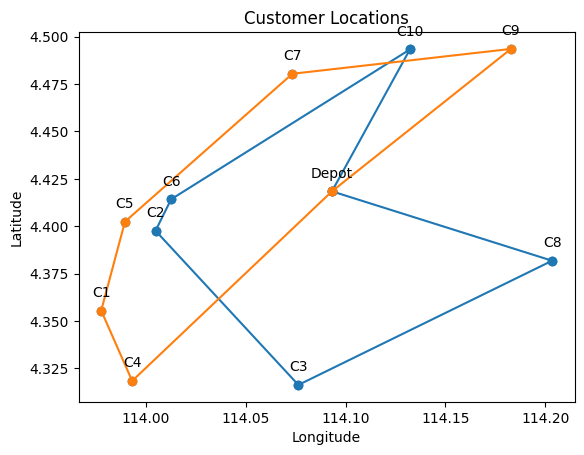

Total Distance = 120.2569 km
Total Cost = RM 180.39

Vehicle 1 (Type B):
Round Trip Distance:72.695 km, Cost: RM 109.04, Demand:29
Depot -> C10 (8.436 km) -> C8 (13.221 km) -> C5 (21.479 km) -> C1 (4.839 km) -> C9 (24.72 km)

Vehicle 2 (Type B):
Round Trip Distance:47.562 km, Cost: RM 71.34, Demand:28
Depot -> C3 (10.347 km) -> C4 (8.323 km) -> C7 (18.077 km) -> C6 (8.982 km) -> C2 (1.834 km)



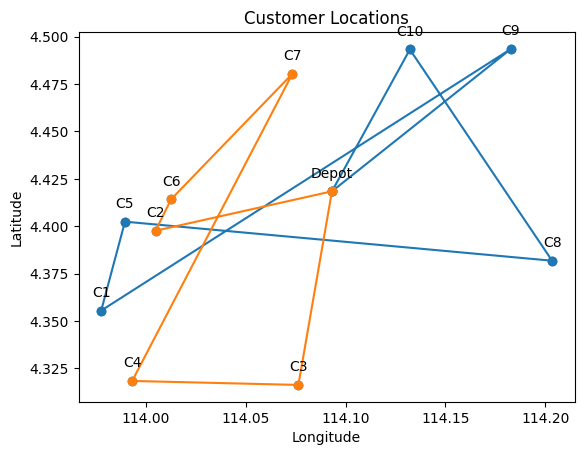

Iteration 1: Best Cost = 156.874613170352
Iteration 2: Best Cost = 153.0924815111519
Iteration 3: Best Cost = 146.6156049437721
Iteration 4: Best Cost = 135.54037810230807
Iteration 5: Best Cost = 134.17180632155038
Iteration 6: Best Cost = 130.77844855337958
Iteration 7: Best Cost = 124.13120178320975
Iteration 8: Best Cost = 122.3507229643197
Iteration 9: Best Cost = 122.3507229643197
Iteration 10: Best Cost = 122.3507229643197
Iteration 11: Best Cost = 122.3507229643197
Iteration 12: Best Cost = 122.3507229643197
Iteration 13: Best Cost = 122.3507229643197
Iteration 14: Best Cost = 122.3507229643197
Iteration 15: Best Cost = 122.3507229643197
Iteration 16: Best Cost = 122.3507229643197
Iteration 17: Best Cost = 122.3507229643197
Iteration 18: Best Cost = 122.3507229643197
Iteration 19: Best Cost = 122.3507229643197
Iteration 20: Best Cost = 122.3507229643197
Iteration 21: Best Cost = 122.3507229643197
Iteration 22: Best Cost = 122.3507229643197
Iteration 23: Best Cost = 122.35072296

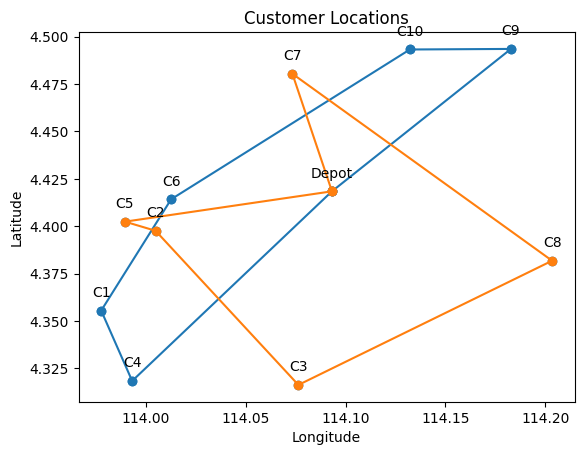

Total Distance = 125.6585 km
Total Cost = RM 188.49

Vehicle 1 (Type B):
Round Trip Distance:50.516 km, Cost: RM 75.77, Demand:30
Depot -> C7 (6.508 km) -> C4 (18.077 km) -> C5 (8.408 km) -> C2 (1.604 km) -> C10 (15.92 km)

Vehicle 2 (Type B):
Round Trip Distance:75.142 km, Cost: RM 112.71, Demand:27
Depot -> C1 (13.152 km) -> C3 (10.62 km) -> C9 (20.669 km) -> C8 (11.358 km) -> C6 (19.343 km)



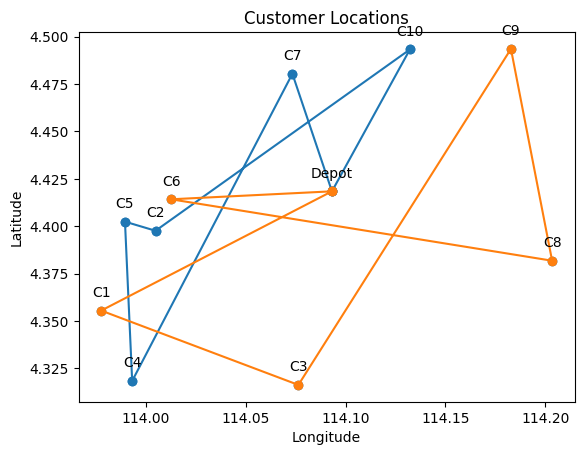

Iteration 1: Best Cost = 158.1754976308294
Iteration 2: Best Cost = 149.50700933589107
Iteration 3: Best Cost = 147.11203616649664
Iteration 4: Best Cost = 135.76610324133094
Iteration 5: Best Cost = 135.64891025561394
Iteration 6: Best Cost = 128.68623097623774
Iteration 7: Best Cost = 125.68452923134522
Iteration 8: Best Cost = 125.61725098378204
Iteration 9: Best Cost = 124.64024974999117
Iteration 10: Best Cost = 124.64024974999117
Iteration 11: Best Cost = 124.64024974999117
Iteration 12: Best Cost = 124.64024974999117
Iteration 13: Best Cost = 124.64024974999117
Iteration 14: Best Cost = 124.64024974999117
Iteration 15: Best Cost = 124.64024974999117
Iteration 16: Best Cost = 124.64024974999117
Iteration 17: Best Cost = 124.64024974999117
Iteration 18: Best Cost = 124.64024974999117
Iteration 19: Best Cost = 124.64024974999117
Iteration 20: Best Cost = 124.64024974999117
Iteration 21: Best Cost = 124.64024974999117
Iteration 22: Best Cost = 124.64024974999117
Iteration 23: Best C

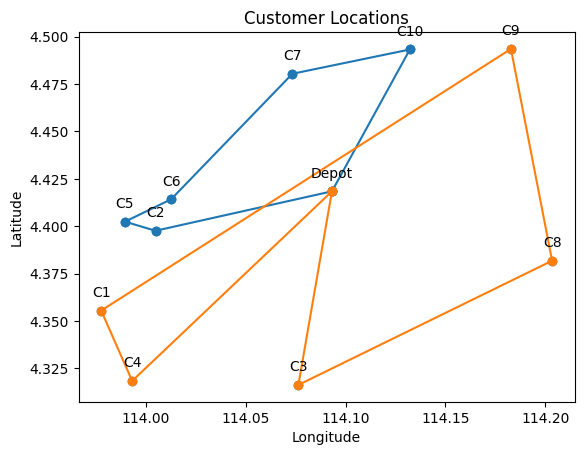

Total Distance = 141.8258 km
Total Cost = RM 212.74

Vehicle 1 (Type B):
Round Trip Distance:94.992 km, Cost: RM 142.49, Demand:30
Depot -> C2 (9.072 km) -> C7 (10.746 km) -> C4 (18.077 km) -> C9 (25.809 km) -> C3 (20.669 km) -> C1 (10.62 km)

Vehicle 2 (Type B):
Round Trip Distance:46.834 km, Cost: RM 70.25, Demand:27
Depot -> C10 (8.436 km) -> C6 (14.325 km) -> C5 (2.594 km) -> C8 (21.479 km)



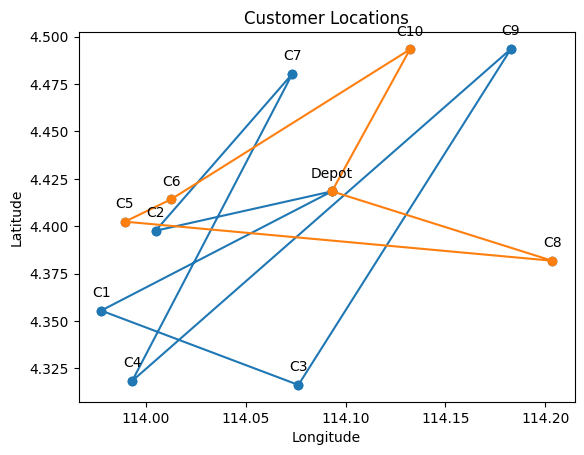

Iteration 1: Best Cost = 193.28251697935707
Iteration 2: Best Cost = 170.30949077790956
Iteration 3: Best Cost = 162.08793450105844
Iteration 4: Best Cost = 157.30745380143557
Iteration 5: Best Cost = 150.57588643667975
Iteration 6: Best Cost = 126.04573810268293
Iteration 7: Best Cost = 116.49400301433957
Iteration 8: Best Cost = 100.88370821787359
Iteration 9: Best Cost = 100.88370821787359
Iteration 10: Best Cost = 100.88370821787359
Iteration 11: Best Cost = 100.88370821787359
Iteration 12: Best Cost = 100.88370821787359
Iteration 13: Best Cost = 100.88370821787359
Iteration 14: Best Cost = 100.88370821787359
Iteration 15: Best Cost = 100.88370821787359
Iteration 16: Best Cost = 100.88370821787359
Iteration 17: Best Cost = 100.88370821787359
Iteration 18: Best Cost = 100.88370821787359
Iteration 19: Best Cost = 100.88370821787359
Iteration 20: Best Cost = 100.88370821787359
Iteration 21: Best Cost = 100.88370821787359
Iteration 22: Best Cost = 100.88370821787359
Iteration 23: Best 

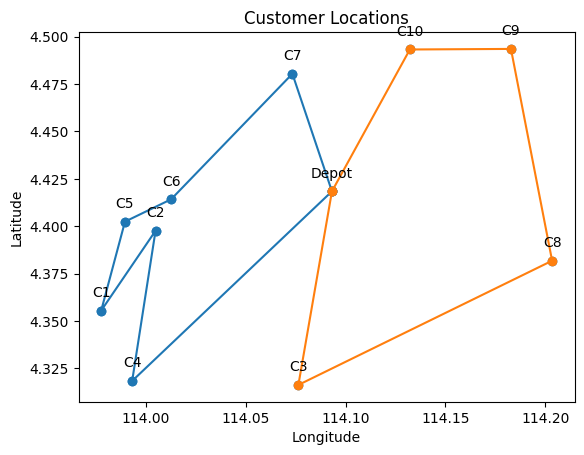

Total Distance = 129.3375 km
Total Cost = RM 194.01

Vehicle 1 (Type B):
Round Trip Distance:67.841 km, Cost: RM 101.76, Demand:28
Depot -> C2 (9.072 km) -> C8 (19.913 km) -> C3 (14.29 km) -> C10 (18.549 km) -> C7 (6.018 km)

Vehicle 2 (Type B):
Round Trip Distance:61.497 km, Cost: RM 92.24, Demand:29
Depot -> C6 (8.061 km) -> C9 (18.768 km) -> C4 (25.809 km) -> C1 (4.021 km) -> C5 (4.839 km)



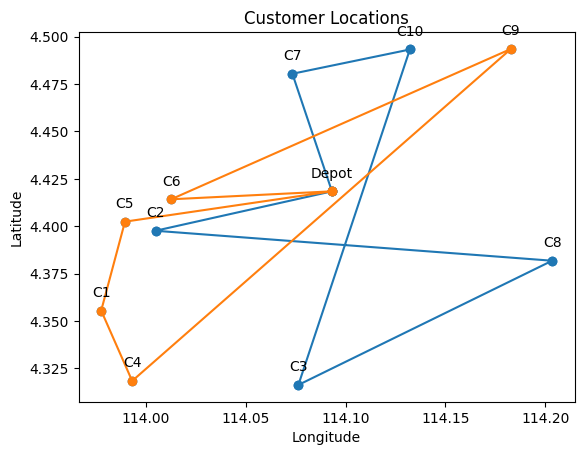

Iteration 1: Best Cost = 190.6444667318211
Iteration 2: Best Cost = 157.45831907816137
Iteration 3: Best Cost = 157.43835830764468
Iteration 4: Best Cost = 136.30802031873307
Iteration 5: Best Cost = 131.37388102023803
Iteration 6: Best Cost = 99.44527535760011
Iteration 7: Best Cost = 99.00907014602176
Iteration 8: Best Cost = 96.00736840112924
Iteration 9: Best Cost = 96.00736840112924
Iteration 10: Best Cost = 96.00736840112924
Iteration 11: Best Cost = 96.00736840112924
Iteration 12: Best Cost = 96.00736840112924
Iteration 13: Best Cost = 96.00736840112924
Iteration 14: Best Cost = 96.00736840112924
Iteration 15: Best Cost = 96.00736840112924
Iteration 16: Best Cost = 96.00736840112924
Iteration 17: Best Cost = 96.00736840112924
Iteration 18: Best Cost = 96.00736840112924
Iteration 19: Best Cost = 96.00736840112924
Iteration 20: Best Cost = 96.00736840112924
Iteration 21: Best Cost = 96.00736840112924
Iteration 22: Best Cost = 96.00736840112924
Iteration 23: Best Cost = 96.00736840

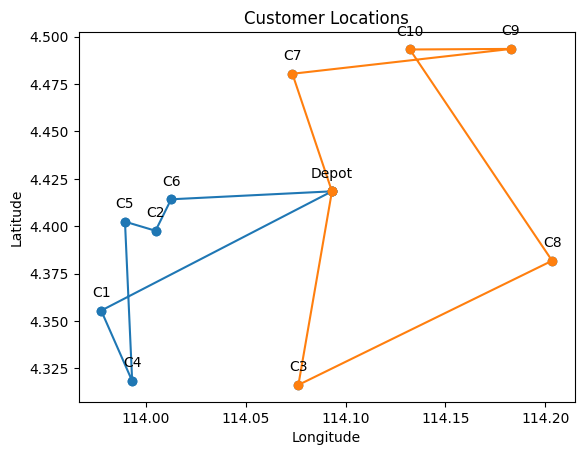

Total Distance = 131.7904 km
Total Cost = RM 197.69

Vehicle 1 (Type B):
Round Trip Distance:49.735 km, Cost: RM 74.6, Demand:27
Depot -> C5 (10.483 km) -> C6 (2.594 km) -> C10 (14.325 km) -> C4 (22.333 km)

Vehicle 2 (Type B):
Round Trip Distance:82.055 km, Cost: RM 123.08, Demand:30
Depot -> C7 (6.508 km) -> C8 (16.316 km) -> C1 (22.723 km) -> C2 (5.012 km) -> C3 (10.827 km) -> C9 (20.669 km)



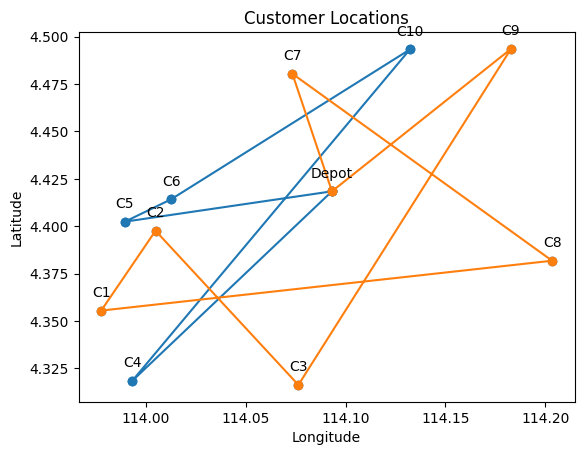

Iteration 1: Best Cost = 182.8228102185009
Iteration 2: Best Cost = 168.4403039294213
Iteration 3: Best Cost = 153.91037532541372
Iteration 4: Best Cost = 153.6706359384827
Iteration 5: Best Cost = 152.9069520864751
Iteration 6: Best Cost = 152.42430007600012
Iteration 7: Best Cost = 135.18548129274572
Iteration 8: Best Cost = 134.6799751456826
Iteration 9: Best Cost = 134.58782160353877
Iteration 10: Best Cost = 127.26403658284897
Iteration 11: Best Cost = 124.51598462877642
Iteration 12: Best Cost = 120.87545752580928
Iteration 13: Best Cost = 120.87545752580928
Iteration 14: Best Cost = 120.87545752580928
Iteration 15: Best Cost = 120.87545752580928
Iteration 16: Best Cost = 120.87545752580928
Iteration 17: Best Cost = 120.87545752580928
Iteration 18: Best Cost = 120.87545752580928
Iteration 19: Best Cost = 120.87545752580928
Iteration 20: Best Cost = 120.87545752580928
Iteration 21: Best Cost = 120.87545752580928
Iteration 22: Best Cost = 120.87545752580928
Iteration 23: Best Cost 

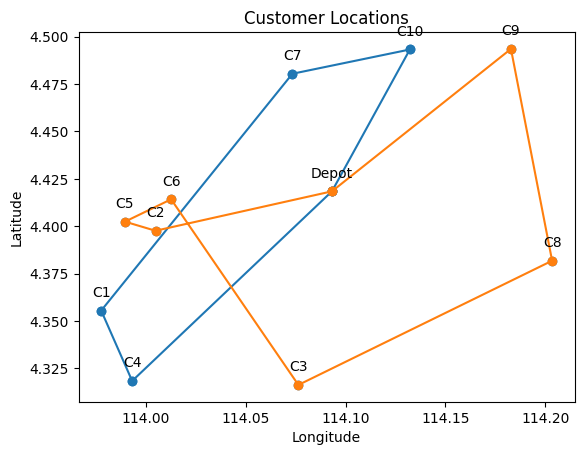

Total Distance = 109.3948 km
Total Cost = RM 164.09

Vehicle 1 (Type B):
Round Trip Distance:52.095 km, Cost: RM 78.14, Demand:27
Depot -> C1 (13.152 km) -> C6 (6.834 km) -> C4 (9.776 km) -> C10 (22.333 km)

Vehicle 2 (Type B):
Round Trip Distance:57.3 km, Cost: RM 85.95, Demand:30
Depot -> C3 (10.347 km) -> C5 (12.226 km) -> C2 (1.604 km) -> C7 (10.746 km) -> C9 (11.018 km) -> C8 (11.358 km)



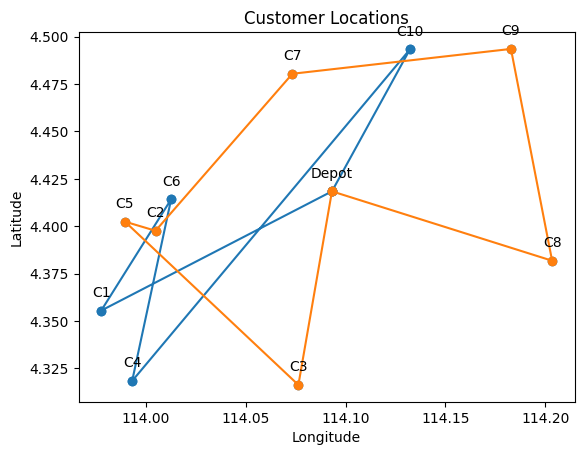

Iteration 1: Best Cost = 142.17954498303675
Iteration 2: Best Cost = 141.33913735362557
Iteration 3: Best Cost = 127.33877232451644
Iteration 4: Best Cost = 123.9092882353109
Iteration 5: Best Cost = 112.3058247257126
Iteration 6: Best Cost = 109.94802822647468
Iteration 7: Best Cost = 108.85271519156747
Iteration 8: Best Cost = 101.7848777220539
Iteration 9: Best Cost = 101.7848777220539
Iteration 10: Best Cost = 101.7848777220539
Iteration 11: Best Cost = 101.7848777220539
Iteration 12: Best Cost = 101.7848777220539
Iteration 13: Best Cost = 101.7848777220539
Iteration 14: Best Cost = 101.7848777220539
Iteration 15: Best Cost = 101.7848777220539
Iteration 16: Best Cost = 101.7848777220539
Iteration 17: Best Cost = 101.7848777220539
Iteration 18: Best Cost = 101.7848777220539
Iteration 19: Best Cost = 101.7848777220539
Iteration 20: Best Cost = 101.7848777220539
Iteration 21: Best Cost = 101.7848777220539
Iteration 22: Best Cost = 101.7848777220539
Iteration 23: Best Cost = 101.784877

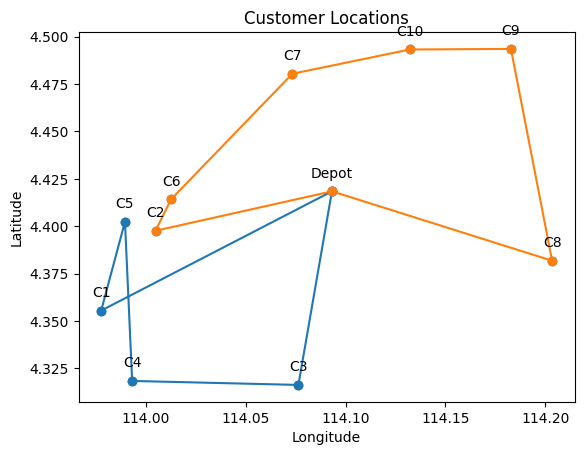

Total Distance = 132.9148 km
Total Cost = RM 199.37

Vehicle 1 (Type B):
Round Trip Distance:64.822 km, Cost: RM 97.23, Demand:30
Depot -> C8 (11.612 km) -> C7 (16.316 km) -> C1 (15.735 km) -> C6 (6.834 km) -> C10 (14.325 km)

Vehicle 2 (Type B):
Round Trip Distance:68.092 km, Cost: RM 102.14, Demand:27
Depot -> C5 (10.483 km) -> C4 (8.408 km) -> C3 (8.323 km) -> C9 (20.669 km) -> C2 (20.21 km)



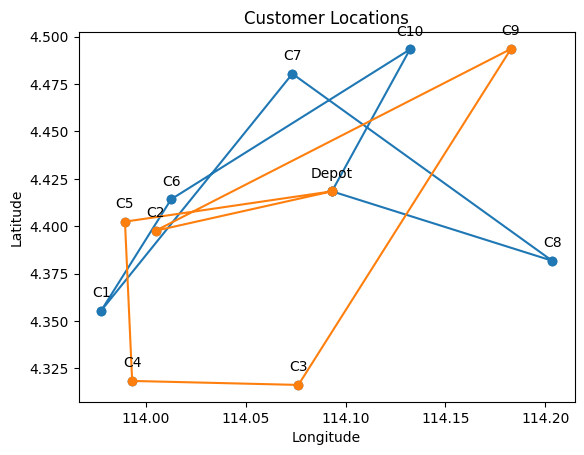

Iteration 1: Best Cost = 157.91041739761732
Iteration 2: Best Cost = 152.86274298430223
Iteration 3: Best Cost = 150.14447752747674
Iteration 4: Best Cost = 123.82998875368864
Iteration 5: Best Cost = 115.42062362736476
Iteration 6: Best Cost = 114.44362239357389
Iteration 7: Best Cost = 112.14139964015752
Iteration 8: Best Cost = 112.14139964015752
Iteration 9: Best Cost = 112.14139964015752
Iteration 10: Best Cost = 112.14139964015752
Iteration 11: Best Cost = 112.14139964015752
Iteration 12: Best Cost = 112.14139964015752
Iteration 13: Best Cost = 112.14139964015752
Iteration 14: Best Cost = 112.14139964015752
Iteration 15: Best Cost = 112.14139964015752
Iteration 16: Best Cost = 112.14139964015752
Iteration 17: Best Cost = 112.14139964015752
Iteration 18: Best Cost = 112.14139964015752
Iteration 19: Best Cost = 112.14139964015752
Iteration 20: Best Cost = 112.14139964015752
Iteration 21: Best Cost = 112.14139964015752
Iteration 22: Best Cost = 112.14139964015752
Iteration 23: Best 

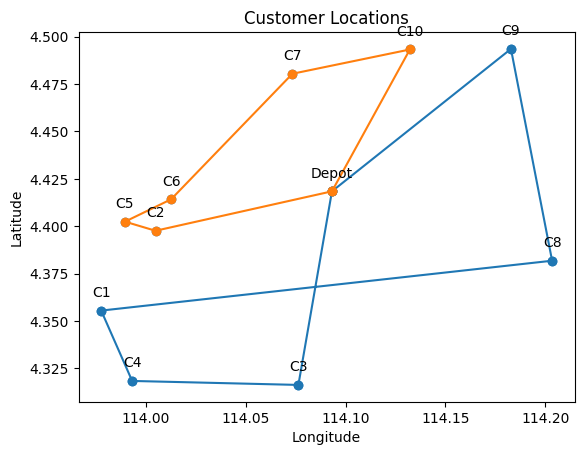

Total Distance = 132.6689 km
Total Cost = RM 199.0

Vehicle 1 (Type B):
Round Trip Distance:56.397 km, Cost: RM 84.59, Demand:30
Depot -> C7 (6.508 km) -> C1 (15.735 km) -> C2 (5.012 km) -> C10 (15.92 km) -> C8 (13.221 km)

Vehicle 2 (Type B):
Round Trip Distance:76.272 km, Cost: RM 114.41, Demand:27
Depot -> C4 (14.142 km) -> C6 (9.776 km) -> C9 (18.768 km) -> C5 (21.36 km) -> C3 (12.226 km)



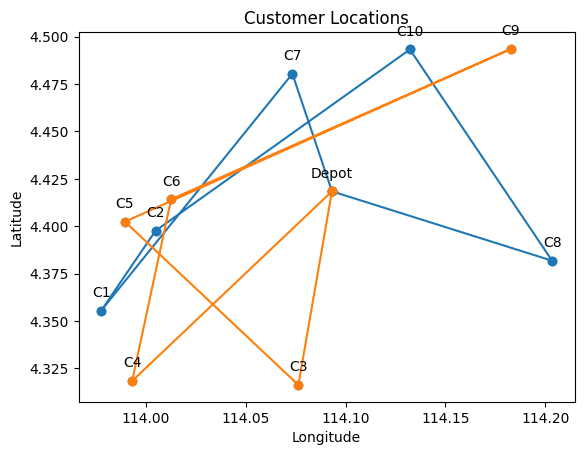

Iteration 1: Best Cost = 192.62280457921406
Iteration 2: Best Cost = 165.77515801465734
Iteration 3: Best Cost = 163.50382106459782
Iteration 4: Best Cost = 160.57966281606883
Iteration 5: Best Cost = 145.51984442803158
Iteration 6: Best Cost = 139.7290844685555
Iteration 7: Best Cost = 128.33253199363907
Iteration 8: Best Cost = 106.24901191810179
Iteration 9: Best Cost = 103.72918315859827
Iteration 10: Best Cost = 102.09586218033905
Iteration 11: Best Cost = 102.09586218033905
Iteration 12: Best Cost = 102.09586218033905
Iteration 13: Best Cost = 102.09586218033905
Iteration 14: Best Cost = 102.09586218033905
Iteration 15: Best Cost = 102.09586218033905
Iteration 16: Best Cost = 102.09586218033905
Iteration 17: Best Cost = 102.09586218033905
Iteration 18: Best Cost = 102.09586218033905
Iteration 19: Best Cost = 102.09586218033905
Iteration 20: Best Cost = 102.09586218033905
Iteration 21: Best Cost = 102.09586218033905
Iteration 22: Best Cost = 102.09586218033905
Iteration 23: Best C

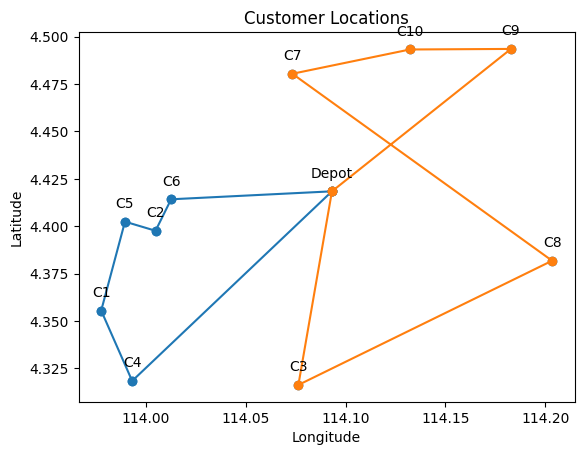

Total Distance = 131.0454 km
Total Cost = RM 196.57

Vehicle 1 (Type B):
Round Trip Distance:49.698 km, Cost: RM 74.55, Demand:29
Depot -> C2 (9.072 km) -> C1 (5.012 km) -> C5 (4.839 km) -> C3 (12.226 km) -> C10 (18.549 km)

Vehicle 2 (Type B):
Round Trip Distance:81.348 km, Cost: RM 122.02, Demand:28
Depot -> C4 (14.142 km) -> C7 (18.077 km) -> C9 (11.018 km) -> C6 (18.768 km) -> C8 (19.343 km)



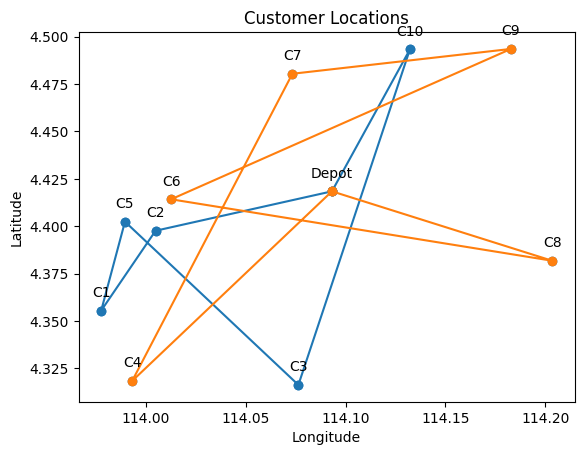

Iteration 1: Best Cost = 182.65169862925757
Iteration 2: Best Cost = 165.96687281771662
Iteration 3: Best Cost = 157.97185658695642
Iteration 4: Best Cost = 157.7402960420401
Iteration 5: Best Cost = 133.49320069699868
Iteration 6: Best Cost = 123.26698820109756
Iteration 7: Best Cost = 110.57670045913005
Iteration 8: Best Cost = 104.78170669258566
Iteration 9: Best Cost = 104.78170669258566
Iteration 10: Best Cost = 104.78170669258566
Iteration 11: Best Cost = 104.78170669258566
Iteration 12: Best Cost = 104.78170669258566
Iteration 13: Best Cost = 104.78170669258566
Iteration 14: Best Cost = 104.78170669258566
Iteration 15: Best Cost = 104.78170669258566
Iteration 16: Best Cost = 104.78170669258566
Iteration 17: Best Cost = 104.78170669258566
Iteration 18: Best Cost = 104.78170669258566
Iteration 19: Best Cost = 104.78170669258566
Iteration 20: Best Cost = 104.78170669258566
Iteration 21: Best Cost = 104.78170669258566
Iteration 22: Best Cost = 104.78170669258566
Iteration 23: Best C

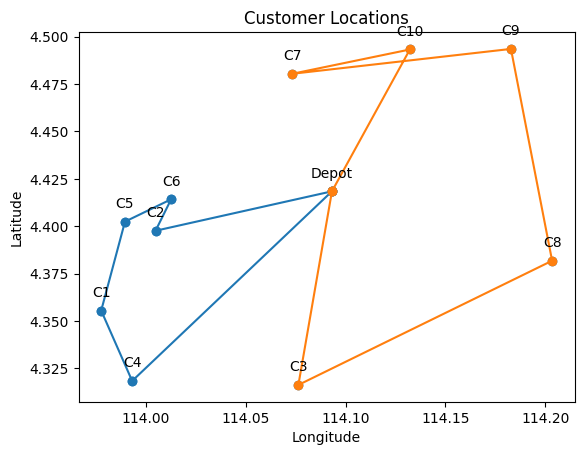

Total Distance = 121.3578 km
Total Cost = RM 145.63

Vehicle 1 (Type A):
Round Trip Distance:42.321 km, Cost: RM 50.78, Demand:16
Depot -> C1 (13.152 km) -> C3 (10.62 km) -> C10 (18.549 km)

Vehicle 2 (Type A):
Round Trip Distance:43.201 km, Cost: RM 51.84, Demand:16
Depot -> C5 (10.483 km) -> C9 (21.36 km) -> C8 (11.358 km)

Vehicle 3 (Type A):
Round Trip Distance:35.836 km, Cost: RM 43.0, Demand:25
Depot -> C2 (9.072 km) -> C4 (8.006 km) -> C6 (9.776 km) -> C7 (8.982 km)



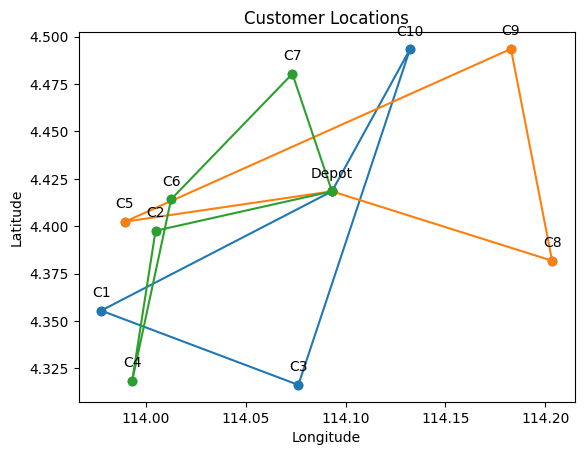

Iteration 1: Best Cost = 144.73157914457104
Iteration 2: Best Cost = 135.55677298961302
Iteration 3: Best Cost = 129.89407934778194
Iteration 4: Best Cost = 122.0535318276452
Iteration 5: Best Cost = 96.03907265369506
Iteration 6: Best Cost = 95.76230183806692
Iteration 7: Best Cost = 86.1618753768337
Iteration 8: Best Cost = 82.7966165366102
Iteration 9: Best Cost = 82.7966165366102
Iteration 10: Best Cost = 82.7966165366102
Iteration 11: Best Cost = 82.7966165366102
Iteration 12: Best Cost = 82.7966165366102
Iteration 13: Best Cost = 82.7966165366102
Iteration 14: Best Cost = 82.7966165366102
Iteration 15: Best Cost = 82.7966165366102
Iteration 16: Best Cost = 82.7966165366102
Iteration 17: Best Cost = 82.7966165366102
Iteration 18: Best Cost = 82.7966165366102
Iteration 19: Best Cost = 82.7966165366102
Iteration 20: Best Cost = 82.7966165366102
Iteration 21: Best Cost = 82.7966165366102
Iteration 22: Best Cost = 82.7966165366102
Iteration 23: Best Cost = 82.7966165366102
Iteration 2

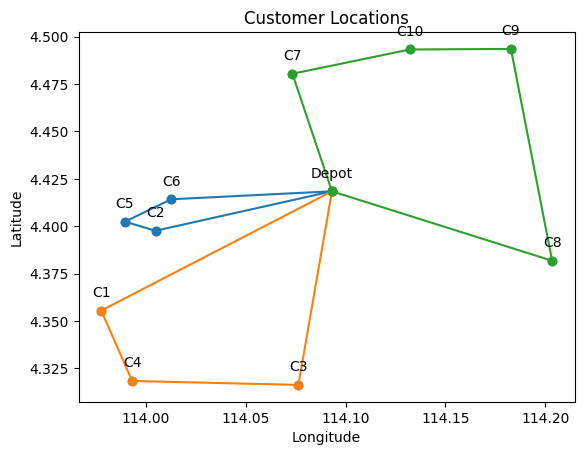

Total Distance = 118.8706 km
Total Cost = RM 142.64

Vehicle 1 (Type A):
Round Trip Distance:49.081 km, Cost: RM 58.9, Demand:21
Depot -> C7 (6.508 km) -> C9 (11.018 km) -> C1 (24.72 km) -> C6 (6.834 km)

Vehicle 2 (Type A):
Round Trip Distance:29.18 km, Cost: RM 35.02, Demand:17
Depot -> C3 (10.347 km) -> C2 (10.827 km) -> C4 (8.006 km)

Vehicle 3 (Type A):
Round Trip Distance:40.609 km, Cost: RM 48.73, Demand:19
Depot -> C5 (10.483 km) -> C10 (16.905 km) -> C8 (13.221 km)



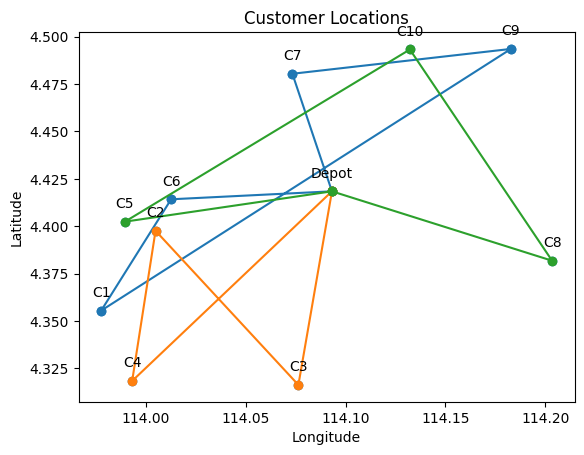

Iteration 1: Best Cost = 124.96339576197238
Iteration 2: Best Cost = 116.8092563894001
Iteration 3: Best Cost = 112.67893945722702
Iteration 4: Best Cost = 110.41805432663048
Iteration 5: Best Cost = 108.53068817707455
Iteration 6: Best Cost = 104.07397719758156
Iteration 7: Best Cost = 103.42139719889282
Iteration 8: Best Cost = 99.2305177230702
Iteration 9: Best Cost = 88.87781880704392
Iteration 10: Best Cost = 87.66494685820354
Iteration 11: Best Cost = 85.55337460746566
Iteration 12: Best Cost = 85.55337460746566
Iteration 13: Best Cost = 85.55337460746566
Iteration 14: Best Cost = 85.55337460746566
Iteration 15: Best Cost = 85.55337460746566
Iteration 16: Best Cost = 85.55337460746566
Iteration 17: Best Cost = 85.55337460746566
Iteration 18: Best Cost = 85.55337460746566
Iteration 19: Best Cost = 85.55337460746566
Iteration 20: Best Cost = 85.55337460746566
Iteration 21: Best Cost = 85.55337460746566
Iteration 22: Best Cost = 85.55337460746566
Iteration 23: Best Cost = 85.5533746

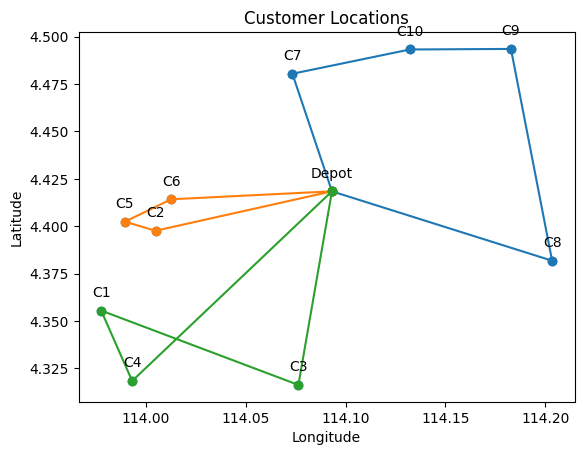

Total Distance = 108.467 km
Total Cost = RM 146.07

Vehicle 1 (Type B):
Round Trip Distance:53.047 km, Cost: RM 79.57, Demand:30
Depot -> C2 (9.072 km) -> C4 (8.006 km) -> C5 (8.408 km) -> C1 (4.839 km) -> C8 (22.723 km)

Vehicle 2 (Type A):
Round Trip Distance:32.36 km, Cost: RM 38.83, Demand:8
Depot -> C9 (11.691 km) -> C3 (20.669 km)

Vehicle 3 (Type A):
Round Trip Distance:23.06 km, Cost: RM 27.67, Demand:19
Depot -> C6 (8.061 km) -> C7 (8.982 km) -> C10 (6.018 km)



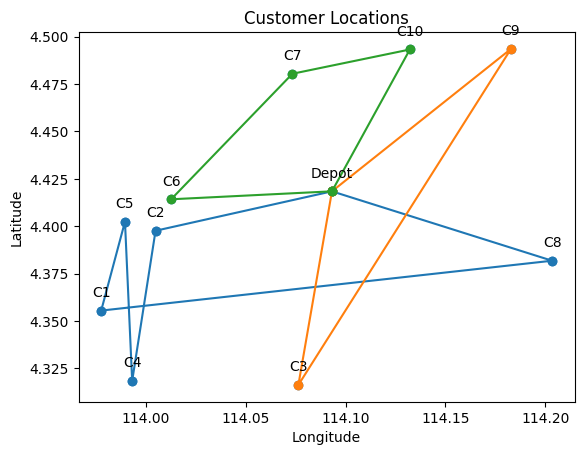

Iteration 1: Best Cost = 137.73142058145703
Iteration 2: Best Cost = 136.30176797000746
Iteration 3: Best Cost = 125.39144203693061
Iteration 4: Best Cost = 120.99912580319724
Iteration 5: Best Cost = 118.99464018713485
Iteration 6: Best Cost = 113.78573868431175
Iteration 7: Best Cost = 105.76144492499034
Iteration 8: Best Cost = 97.56523135073272
Iteration 9: Best Cost = 93.6587123397039
Iteration 10: Best Cost = 89.91225238420307
Iteration 11: Best Cost = 89.91225238420307
Iteration 12: Best Cost = 89.91225238420307
Iteration 13: Best Cost = 89.91225238420307
Iteration 14: Best Cost = 89.91225238420307
Iteration 15: Best Cost = 89.91225238420307
Iteration 16: Best Cost = 89.91225238420307
Iteration 17: Best Cost = 89.91225238420307
Iteration 18: Best Cost = 89.91225238420307
Iteration 19: Best Cost = 89.91225238420307
Iteration 20: Best Cost = 89.91225238420307
Iteration 21: Best Cost = 89.91225238420307
Iteration 22: Best Cost = 89.91225238420307
Iteration 23: Best Cost = 89.912252

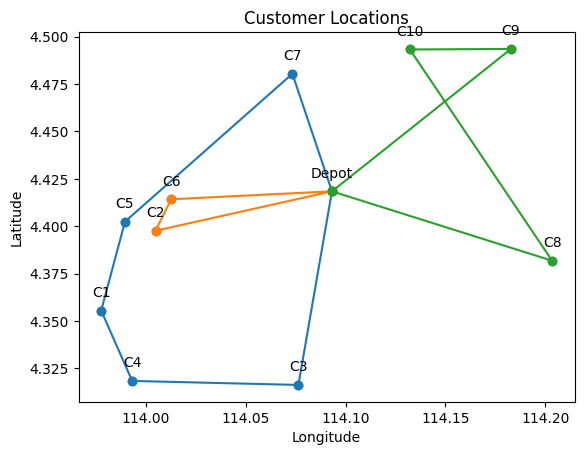

Total Distance = 139.8346 km
Total Cost = RM 181.11

Vehicle 1 (Type A):
Round Trip Distance:40.786 km, Cost: RM 48.94, Demand:14
Depot -> C9 (11.691 km) -> C7 (11.018 km) -> C4 (18.077 km)

Vehicle 2 (Type A):
Round Trip Distance:54.685 km, Cost: RM 65.62, Demand:16
Depot -> C5 (10.483 km) -> C8 (21.479 km) -> C1 (22.723 km)

Vehicle 3 (Type B):
Round Trip Distance:44.364 km, Cost: RM 66.55, Demand:27
Depot -> C6 (8.061 km) -> C2 (1.834 km) -> C10 (15.92 km) -> C3 (18.549 km)



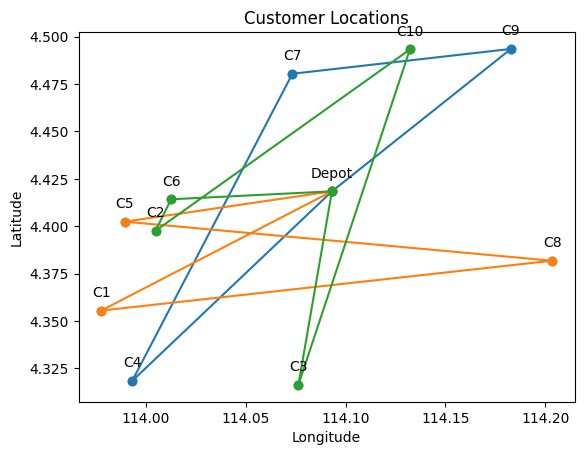

Iteration 1: Best Cost = 133.79498624311708
Iteration 2: Best Cost = 131.82067355751215
Iteration 3: Best Cost = 127.0522463503836
Iteration 4: Best Cost = 122.09461233931287
Iteration 5: Best Cost = 121.45213632491743
Iteration 6: Best Cost = 111.6157731061218
Iteration 7: Best Cost = 111.31051505735067
Iteration 8: Best Cost = 105.1960726007049
Iteration 9: Best Cost = 104.74582110065657
Iteration 10: Best Cost = 103.43960183363345
Iteration 11: Best Cost = 101.49187751511576
Iteration 12: Best Cost = 98.82692299272985
Iteration 13: Best Cost = 94.92040398170104
Iteration 14: Best Cost = 91.17394402620022
Iteration 15: Best Cost = 90.91548868479009
Iteration 16: Best Cost = 90.07079494746134
Iteration 17: Best Cost = 90.07079494746134
Iteration 18: Best Cost = 90.07079494746134
Iteration 19: Best Cost = 90.07079494746134
Iteration 20: Best Cost = 90.07079494746134
Iteration 21: Best Cost = 90.07079494746134
Iteration 22: Best Cost = 90.07079494746134
Iteration 23: Best Cost = 90.0707

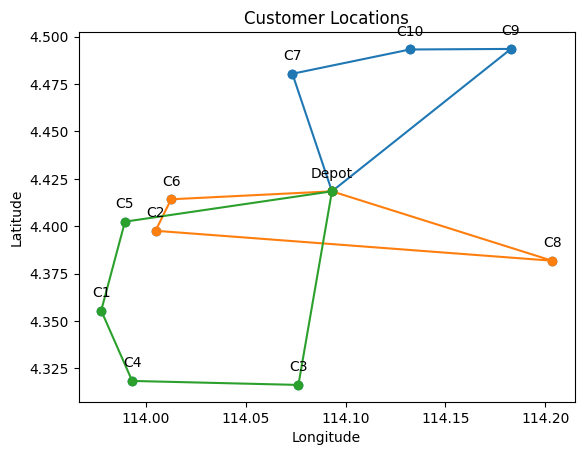

Total Distance = 124.6857 km
Total Cost = RM 164.28

Vehicle 1 (Type B):
Round Trip Distance:48.861 km, Cost: RM 73.29, Demand:27
Depot -> C9 (11.691 km) -> C10 (5.06 km) -> C4 (22.333 km) -> C6 (9.776 km)

Vehicle 2 (Type A):
Round Trip Distance:53.894 km, Cost: RM 64.67, Demand:22
Depot -> C2 (9.072 km) -> C8 (19.913 km) -> C3 (14.29 km) -> C1 (10.62 km)

Vehicle 3 (Type A):
Round Trip Distance:21.931 km, Cost: RM 26.32, Demand:8
Depot -> C5 (10.483 km) -> C7 (11.448 km)



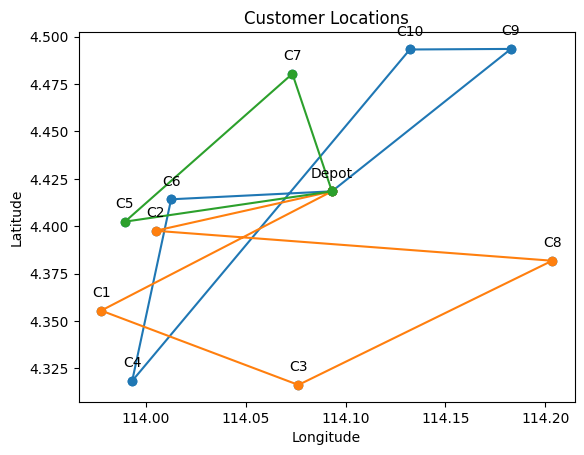

Iteration 1: Best Cost = 163.3007418746232
Iteration 2: Best Cost = 160.98498704243718
Iteration 3: Best Cost = 146.40039731325018
Iteration 4: Best Cost = 131.07702671760217
Iteration 5: Best Cost = 117.53042476150686
Iteration 6: Best Cost = 114.08321520470214
Iteration 7: Best Cost = 110.3148910761042
Iteration 8: Best Cost = 108.62151305932878
Iteration 9: Best Cost = 106.70919112670845
Iteration 10: Best Cost = 106.51360980560872
Iteration 11: Best Cost = 105.46544823575766
Iteration 12: Best Cost = 105.4028109706947
Iteration 13: Best Cost = 101.38497213178246
Iteration 14: Best Cost = 99.26692956885134
Iteration 15: Best Cost = 84.90718846129724
Iteration 16: Best Cost = 84.90718846129724
Iteration 17: Best Cost = 84.90718846129724
Iteration 18: Best Cost = 84.90718846129724
Iteration 19: Best Cost = 84.90718846129724
Iteration 20: Best Cost = 84.90718846129724
Iteration 21: Best Cost = 84.90718846129724
Iteration 22: Best Cost = 84.90718846129724
Iteration 23: Best Cost = 84.90

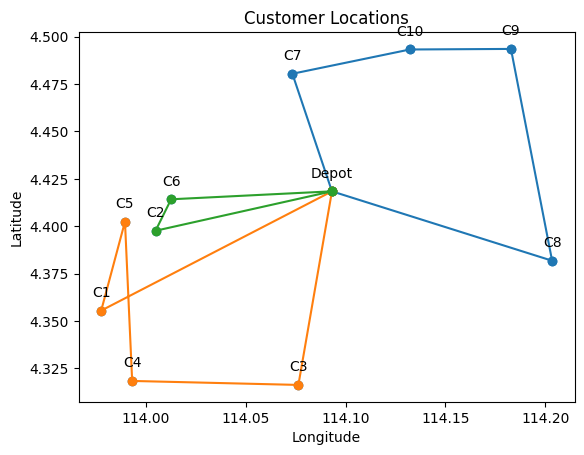

Total Distance = 119.6517 km
Total Cost = RM 160.36

Vehicle 1 (Type A):
Round Trip Distance:22.761 km, Cost: RM 27.31, Demand:16
Depot -> C10 (8.436 km) -> C6 (14.325 km)

Vehicle 2 (Type B):
Round Trip Distance:55.938 km, Cost: RM 83.91, Demand:29
Depot -> C1 (13.152 km) -> C2 (5.012 km) -> C4 (8.006 km) -> C5 (8.408 km) -> C9 (21.36 km)

Vehicle 3 (Type A):
Round Trip Distance:40.953 km, Cost: RM 49.14, Demand:12
Depot -> C3 (10.347 km) -> C8 (14.29 km) -> C7 (16.316 km)



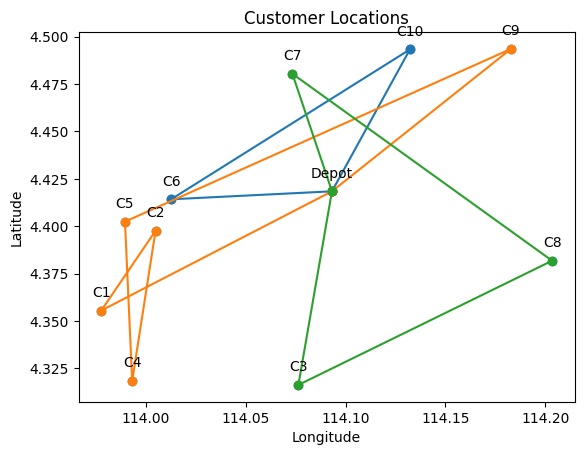

Iteration 1: Best Cost = 139.54625826820177
Iteration 2: Best Cost = 138.53812150451984
Iteration 3: Best Cost = 137.30259106305923
Iteration 4: Best Cost = 134.0535115878276
Iteration 5: Best Cost = 129.15880136335116
Iteration 6: Best Cost = 116.29561762404032
Iteration 7: Best Cost = 107.25937561261719
Iteration 8: Best Cost = 104.94676486238279
Iteration 9: Best Cost = 104.94676486238279
Iteration 10: Best Cost = 104.94676486238279
Iteration 11: Best Cost = 104.94676486238279
Iteration 12: Best Cost = 104.94676486238279
Iteration 13: Best Cost = 104.94676486238279
Iteration 14: Best Cost = 104.94676486238279
Iteration 15: Best Cost = 104.94676486238279
Iteration 16: Best Cost = 104.94676486238279
Iteration 17: Best Cost = 104.94676486238279
Iteration 18: Best Cost = 104.94676486238279
Iteration 19: Best Cost = 104.94676486238279
Iteration 20: Best Cost = 104.94676486238279
Iteration 21: Best Cost = 104.94676486238279
Iteration 22: Best Cost = 104.94676486238279
Iteration 23: Best C

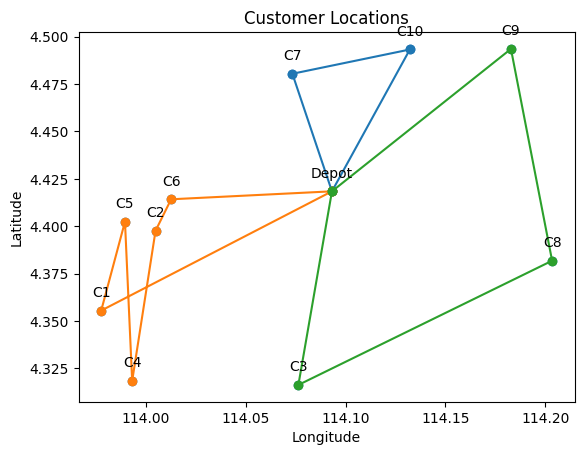

Total Distance = 130.7138 km
Total Cost = RM 156.86

Vehicle 1 (Type A):
Round Trip Distance:45.271 km, Cost: RM 54.32, Demand:22
Depot -> C4 (14.142 km) -> C7 (18.077 km) -> C5 (11.448 km) -> C2 (1.604 km)

Vehicle 2 (Type A):
Round Trip Distance:47.654 km, Cost: RM 57.18, Demand:16
Depot -> C10 (8.436 km) -> C3 (18.549 km) -> C9 (20.669 km)

Vehicle 3 (Type A):
Round Trip Distance:37.789 km, Cost: RM 45.35, Demand:19
Depot -> C8 (11.612 km) -> C6 (19.343 km) -> C1 (6.834 km)



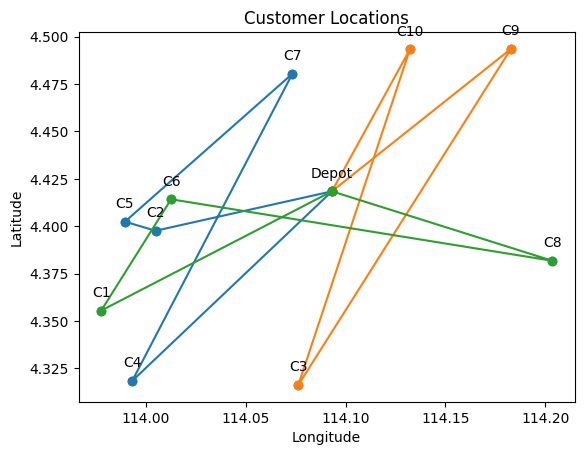

Iteration 1: Best Cost = 154.73851051148193
Iteration 2: Best Cost = 152.11492623407256
Iteration 3: Best Cost = 143.60534519349986
Iteration 4: Best Cost = 123.68481811254507
Iteration 5: Best Cost = 117.34823061316155
Iteration 6: Best Cost = 116.78932835561305
Iteration 7: Best Cost = 107.28340782415376
Iteration 8: Best Cost = 107.2207705590908
Iteration 9: Best Cost = 104.96468718522578
Iteration 10: Best Cost = 102.4091603249993
Iteration 11: Best Cost = 101.15980658150158
Iteration 12: Best Cost = 101.15773186008813
Iteration 13: Best Cost = 100.50515186139941
Iteration 14: Best Cost = 93.60488974165335
Iteration 15: Best Cost = 93.03163218575301
Iteration 16: Best Cost = 89.28517223025219
Iteration 17: Best Cost = 89.28517223025219
Iteration 18: Best Cost = 89.28517223025219
Iteration 19: Best Cost = 89.28517223025219
Iteration 20: Best Cost = 89.28517223025219
Iteration 21: Best Cost = 89.28517223025219
Iteration 22: Best Cost = 89.28517223025219
Iteration 23: Best Cost = 89.2

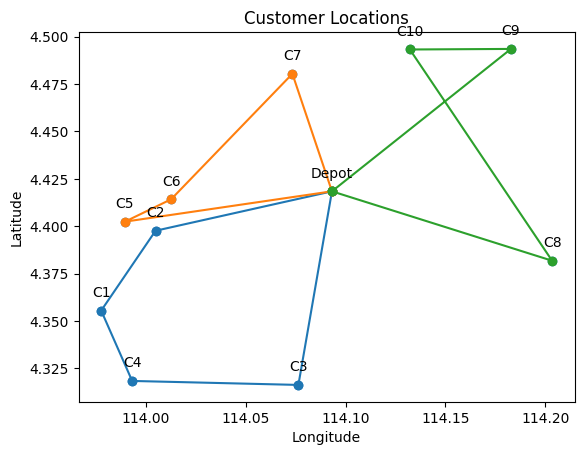

Total Distance = 155.2066 km
Total Cost = RM 186.25

Vehicle 1 (Type A):
Round Trip Distance:58.718 km, Cost: RM 70.46, Demand:19
Depot -> C4 (14.142 km) -> C9 (25.809 km) -> C6 (18.768 km)

Vehicle 2 (Type A):
Round Trip Distance:38.247 km, Cost: RM 45.9, Demand:14
Depot -> C5 (10.483 km) -> C7 (11.448 km) -> C8 (16.316 km)

Vehicle 3 (Type A):
Round Trip Distance:58.241 km, Cost: RM 69.89, Demand:24
Depot -> C1 (13.152 km) -> C3 (10.62 km) -> C10 (18.549 km) -> C2 (15.92 km)



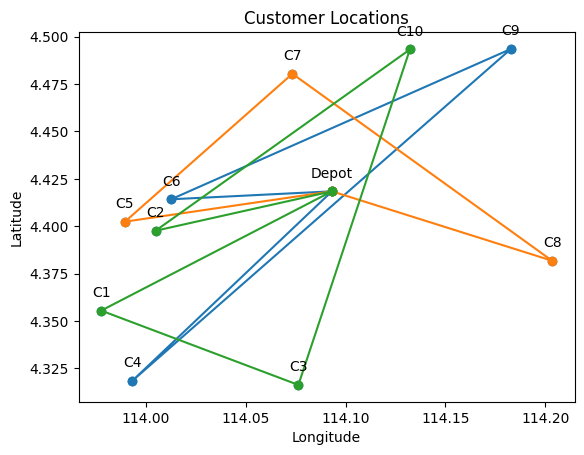

Iteration 1: Best Cost = 173.56946563359443
Iteration 2: Best Cost = 139.85233756581613
Iteration 3: Best Cost = 137.65038745041608
Iteration 4: Best Cost = 134.41836182361615
Iteration 5: Best Cost = 121.33423865597138
Iteration 6: Best Cost = 120.47732478637192
Iteration 7: Best Cost = 119.52614324782769
Iteration 8: Best Cost = 115.69067006738015
Iteration 9: Best Cost = 114.96052729598311
Iteration 10: Best Cost = 113.07316114642718
Iteration 11: Best Cost = 105.17339675782026
Iteration 12: Best Cost = 105.17339675782026
Iteration 13: Best Cost = 105.17339675782026
Iteration 14: Best Cost = 105.17339675782026
Iteration 15: Best Cost = 105.17339675782026
Iteration 16: Best Cost = 105.17339675782026
Iteration 17: Best Cost = 105.17339675782026
Iteration 18: Best Cost = 105.17339675782026
Iteration 19: Best Cost = 105.17339675782026
Iteration 20: Best Cost = 105.17339675782026
Iteration 21: Best Cost = 105.17339675782026
Iteration 22: Best Cost = 105.17339675782026
Iteration 23: Best 

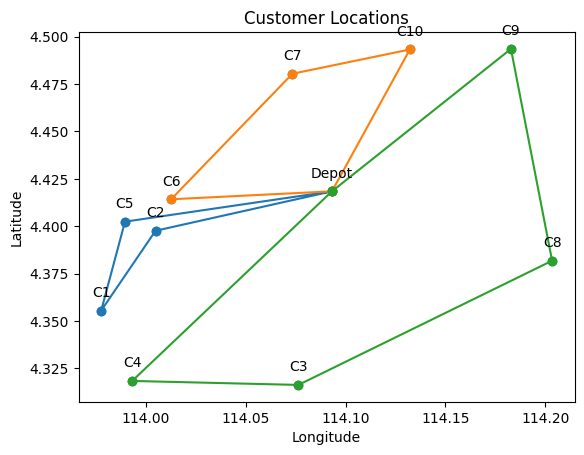

Total Distance = 124.3696 km
Total Cost = RM 149.24

Vehicle 1 (Type A):
Round Trip Distance:44.78 km, Cost: RM 53.74, Demand:15
Depot -> C7 (6.508 km) -> C8 (16.316 km) -> C4 (21.955 km)

Vehicle 2 (Type A):
Round Trip Distance:53.852 km, Cost: RM 64.62, Demand:18
Depot -> C10 (8.436 km) -> C1 (20.696 km) -> C9 (24.72 km)

Vehicle 3 (Type A):
Round Trip Distance:25.738 km, Cost: RM 30.89, Demand:24
Depot -> C5 (10.483 km) -> C6 (2.594 km) -> C2 (1.834 km) -> C3 (10.827 km)



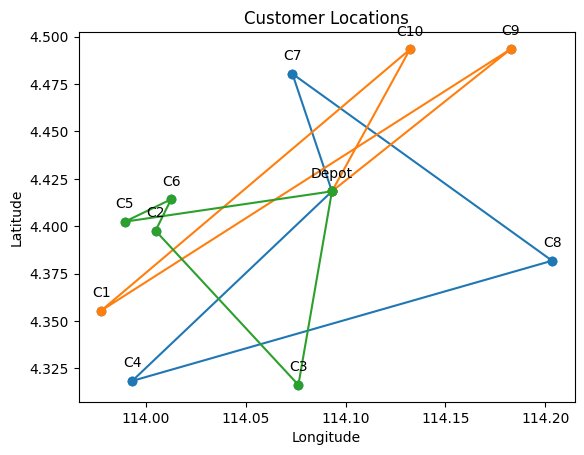

Iteration 1: Best Cost = 140.96288216981827
Iteration 2: Best Cost = 134.3171130634415
Iteration 3: Best Cost = 129.32032537553863
Iteration 4: Best Cost = 127.50835578845515
Iteration 5: Best Cost = 125.97207078351647
Iteration 6: Best Cost = 123.85402822058535
Iteration 7: Best Cost = 105.23022437664419
Iteration 8: Best Cost = 99.44353470041847
Iteration 9: Best Cost = 97.48085566829579
Iteration 10: Best Cost = 93.0896817761984
Iteration 11: Best Cost = 92.30147437351371
Iteration 12: Best Cost = 90.39891022787931
Iteration 13: Best Cost = 90.39891022787931
Iteration 14: Best Cost = 90.39891022787931
Iteration 15: Best Cost = 90.39891022787931
Iteration 16: Best Cost = 90.39891022787931
Iteration 17: Best Cost = 90.39891022787931
Iteration 18: Best Cost = 90.39891022787931
Iteration 19: Best Cost = 90.39891022787931
Iteration 20: Best Cost = 90.39891022787931
Iteration 21: Best Cost = 90.39891022787931
Iteration 22: Best Cost = 90.39891022787931
Iteration 23: Best Cost = 90.3989102

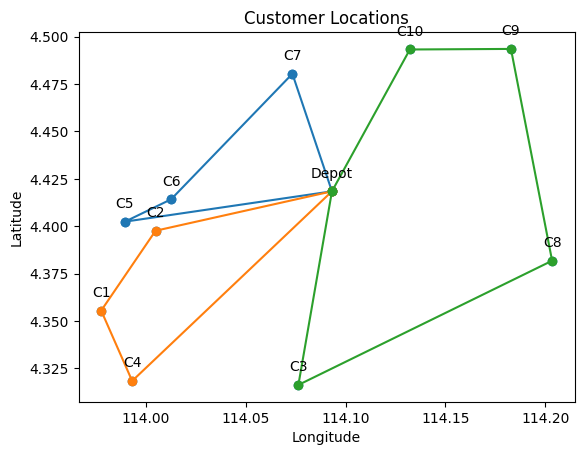

Total Distance = 146.3149 km
Total Cost = RM 175.58

Vehicle 1 (Type A):
Round Trip Distance:78.216 km, Cost: RM 93.86, Demand:24
Depot -> C4 (14.142 km) -> C9 (25.809 km) -> C5 (21.36 km) -> C10 (16.905 km)

Vehicle 2 (Type A):
Round Trip Distance:18.164 km, Cost: RM 21.8, Demand:13
Depot -> C1 (13.152 km) -> C2 (5.012 km)

Vehicle 3 (Type A):
Round Trip Distance:49.935 km, Cost: RM 59.92, Demand:20
Depot -> C3 (10.347 km) -> C8 (14.29 km) -> C7 (16.316 km) -> C6 (8.982 km)



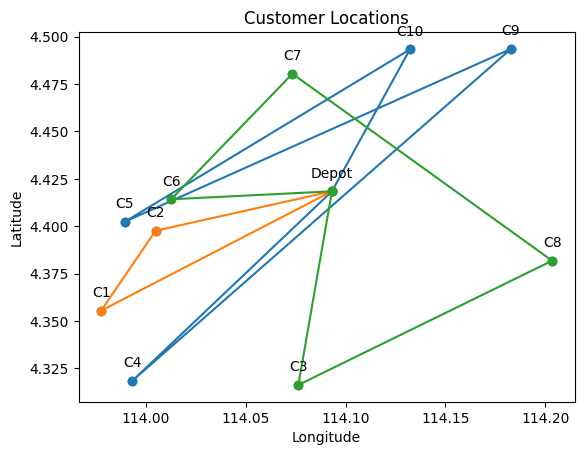

Iteration 1: Best Cost = 154.8473866919083
Iteration 2: Best Cost = 154.62668107506974
Iteration 3: Best Cost = 150.8365884632529
Iteration 4: Best Cost = 148.10666374244934
Iteration 5: Best Cost = 144.13898246785214
Iteration 6: Best Cost = 143.59395328892384
Iteration 7: Best Cost = 143.51369786522852
Iteration 8: Best Cost = 127.68954493712242
Iteration 9: Best Cost = 124.70301777482246
Iteration 10: Best Cost = 114.43840674125227
Iteration 11: Best Cost = 113.44048463919623
Iteration 12: Best Cost = 110.64134145989757
Iteration 13: Best Cost = 105.65258877250923
Iteration 14: Best Cost = 105.58995150744627
Iteration 15: Best Cost = 104.18111203413211
Iteration 16: Best Cost = 102.66359668377878
Iteration 17: Best Cost = 100.78459448837975
Iteration 18: Best Cost = 91.1063737321418
Iteration 19: Best Cost = 91.1063737321418
Iteration 20: Best Cost = 91.1063737321418
Iteration 21: Best Cost = 91.1063737321418
Iteration 22: Best Cost = 91.1063737321418
Iteration 23: Best Cost = 91.10

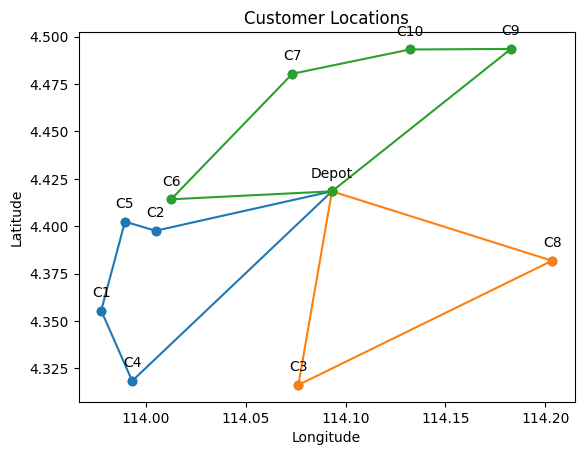

Total Distance = 166.9546 km
Total Cost = RM 200.35

Vehicle 1 (Type A):
Round Trip Distance:58.541 km, Cost: RM 70.25, Demand:13
Depot -> C1 (13.152 km) -> C9 (24.72 km) -> C3 (20.669 km)

Vehicle 2 (Type A):
Round Trip Distance:57.613 km, Cost: RM 69.14, Demand:22
Depot -> C2 (9.072 km) -> C7 (10.746 km) -> C8 (16.316 km) -> C5 (21.479 km)

Vehicle 3 (Type A):
Round Trip Distance:50.8 km, Cost: RM 60.96, Demand:22
Depot -> C4 (14.142 km) -> C10 (22.333 km) -> C6 (14.325 km)



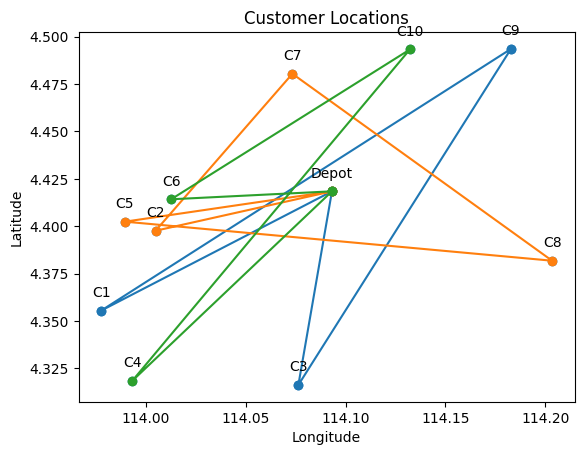

Iteration 1: Best Cost = 167.55671787190255
Iteration 2: Best Cost = 162.77781327533202
Iteration 3: Best Cost = 153.08404109228343
Iteration 4: Best Cost = 144.15333342734567
Iteration 5: Best Cost = 143.41891666125258
Iteration 6: Best Cost = 143.10770246645126
Iteration 7: Best Cost = 140.84004195970016
Iteration 8: Best Cost = 136.49180909789007
Iteration 9: Best Cost = 135.6899612945883
Iteration 10: Best Cost = 124.96531621793649
Iteration 11: Best Cost = 112.29586589501574
Iteration 12: Best Cost = 104.5032512488234
Iteration 13: Best Cost = 102.52688262946435
Iteration 14: Best Cost = 100.36020905538524
Iteration 15: Best Cost = 95.71514962946654
Iteration 16: Best Cost = 92.6788554301466
Iteration 17: Best Cost = 92.6788554301466
Iteration 18: Best Cost = 92.6788554301466
Iteration 19: Best Cost = 92.6788554301466
Iteration 20: Best Cost = 92.6788554301466
Iteration 21: Best Cost = 92.6788554301466
Iteration 22: Best Cost = 92.6788554301466
Iteration 23: Best Cost = 92.6788554

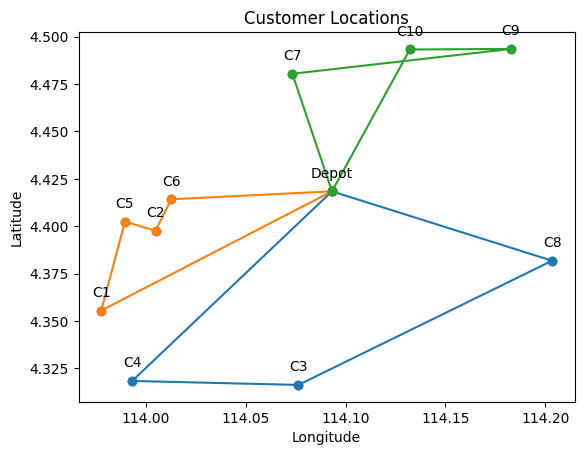

Total Distance = 125.0893 km
Total Cost = RM 161.85

Vehicle 1 (Type B):
Round Trip Distance:39.15 km, Cost: RM 58.73, Demand:27
Depot -> C6 (8.061 km) -> C10 (14.325 km) -> C7 (6.018 km) -> C2 (10.746 km)

Vehicle 2 (Type A):
Round Trip Distance:44.441 km, Cost: RM 53.33, Demand:13
Depot -> C1 (13.152 km) -> C3 (10.62 km) -> C9 (20.669 km)

Vehicle 3 (Type A):
Round Trip Distance:41.499 km, Cost: RM 49.8, Demand:17
Depot -> C8 (11.612 km) -> C5 (21.479 km) -> C4 (8.408 km)



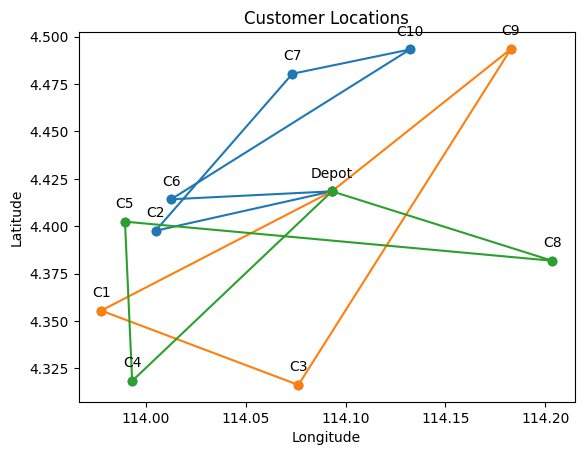

Iteration 1: Best Cost = 150.73857330726625
Iteration 2: Best Cost = 147.07091245975136
Iteration 3: Best Cost = 135.17367138361183
Iteration 4: Best Cost = 111.88800408427673
Iteration 5: Best Cost = 107.43129310478375
Iteration 6: Best Cost = 103.46568655160002
Iteration 7: Best Cost = 102.70000228435008
Iteration 8: Best Cost = 99.42511393620056
Iteration 9: Best Cost = 94.93817321367106
Iteration 10: Best Cost = 91.59786436182506
Iteration 11: Best Cost = 79.42929017905756
Iteration 12: Best Cost = 79.42929017905756
Iteration 13: Best Cost = 79.42929017905756
Iteration 14: Best Cost = 79.42929017905756
Iteration 15: Best Cost = 79.42929017905756
Iteration 16: Best Cost = 79.42929017905756
Iteration 17: Best Cost = 79.42929017905756
Iteration 18: Best Cost = 79.42929017905756
Iteration 19: Best Cost = 79.42929017905756
Iteration 20: Best Cost = 79.42929017905756
Iteration 21: Best Cost = 79.42929017905756
Iteration 22: Best Cost = 79.42929017905756
Iteration 23: Best Cost = 79.42929

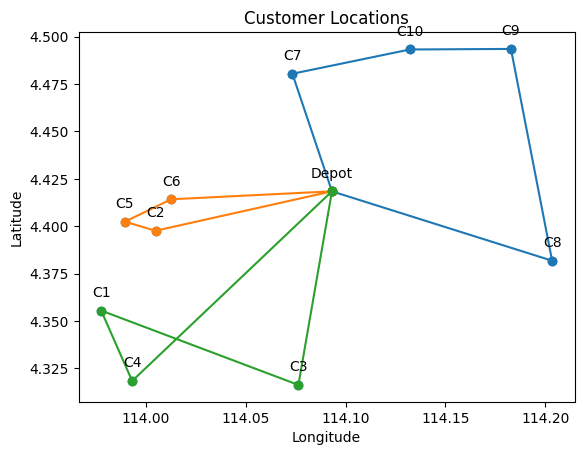

Total Distance = 131.5115 km
Total Cost = RM 157.81

Vehicle 1 (Type A):
Round Trip Distance:25.902 km, Cost: RM 31.08, Demand:16
Depot -> C10 (8.436 km) -> C7 (6.018 km) -> C5 (11.448 km)

Vehicle 2 (Type A):
Round Trip Distance:28.861 km, Cost: RM 34.63, Demand:16
Depot -> C3 (10.347 km) -> C6 (11.68 km) -> C1 (6.834 km)

Vehicle 3 (Type A):
Round Trip Distance:76.748 km, Cost: RM 92.1, Demand:25
Depot -> C2 (9.072 km) -> C8 (19.913 km) -> C4 (21.955 km) -> C9 (25.809 km)



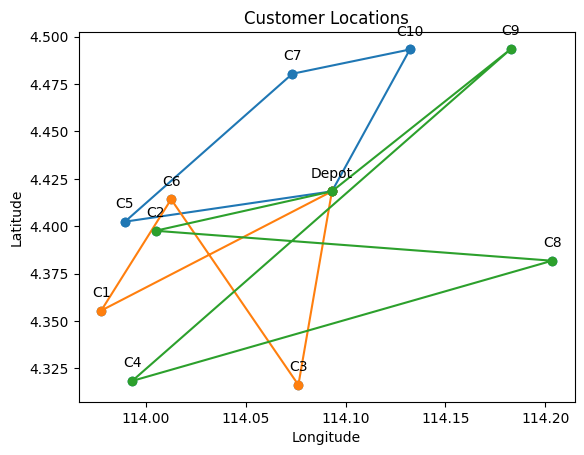

Iteration 1: Best Cost = 133.42255328010492
Iteration 2: Best Cost = 127.04445540343269
Iteration 3: Best Cost = 123.42711411390985
Iteration 4: Best Cost = 119.16482040211649
Iteration 5: Best Cost = 117.92609148724787
Iteration 6: Best Cost = 111.67773199214366
Iteration 7: Best Cost = 100.69614258714405
Iteration 8: Best Cost = 100.37777655993338
Iteration 9: Best Cost = 99.53308282260463
Iteration 10: Best Cost = 97.58535850408697
Iteration 11: Best Cost = 94.92040398170104
Iteration 12: Best Cost = 91.17394402620022
Iteration 13: Best Cost = 90.91548868479009
Iteration 14: Best Cost = 90.07079494746134
Iteration 15: Best Cost = 90.07079494746134
Iteration 16: Best Cost = 90.07079494746134
Iteration 17: Best Cost = 90.07079494746134
Iteration 18: Best Cost = 90.07079494746134
Iteration 19: Best Cost = 90.07079494746134
Iteration 20: Best Cost = 90.07079494746134
Iteration 21: Best Cost = 90.07079494746134
Iteration 22: Best Cost = 90.07079494746134
Iteration 23: Best Cost = 90.0707

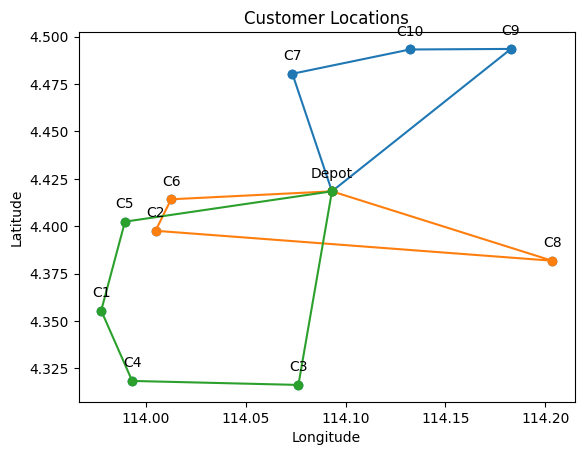

Total Distance = 128.8047 km
Total Cost = RM 154.57

Vehicle 1 (Type A):
Round Trip Distance:17.078 km, Cost: RM 20.49, Demand:14
Depot -> C2 (9.072 km) -> C4 (8.006 km)

Vehicle 2 (Type A):
Round Trip Distance:43.222 km, Cost: RM 51.87, Demand:19
Depot -> C3 (10.347 km) -> C10 (18.549 km) -> C6 (14.325 km)

Vehicle 3 (Type A):
Round Trip Distance:68.505 km, Cost: RM 82.21, Demand:24
Depot -> C8 (11.612 km) -> C7 (16.316 km) -> C9 (11.018 km) -> C1 (24.72 km) -> C5 (4.839 km)



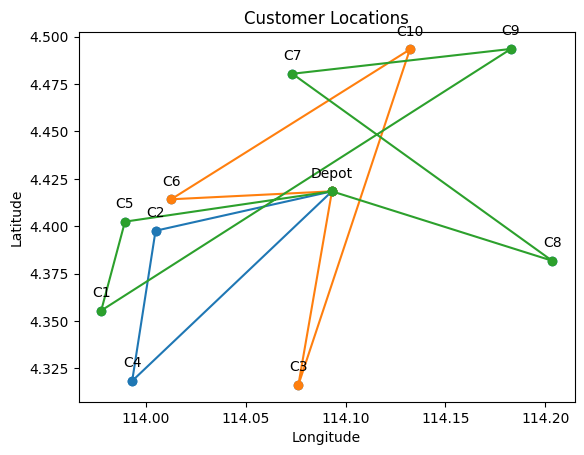

Iteration 1: Best Cost = 134.1149405995459
Iteration 2: Best Cost = 116.34922028610782
Iteration 3: Best Cost = 107.43954162784783
Iteration 4: Best Cost = 107.32903718019243
Iteration 5: Best Cost = 107.21002907559378
Iteration 6: Best Cost = 107.21002907559378
Iteration 7: Best Cost = 107.21002907559378
Iteration 8: Best Cost = 107.21002907559378
Iteration 9: Best Cost = 107.21002907559378
Iteration 10: Best Cost = 107.21002907559378
Iteration 11: Best Cost = 107.21002907559378
Iteration 12: Best Cost = 107.21002907559378
Iteration 13: Best Cost = 107.21002907559378
Iteration 14: Best Cost = 107.21002907559378
Iteration 15: Best Cost = 107.21002907559378
Iteration 16: Best Cost = 107.21002907559378
Iteration 17: Best Cost = 107.21002907559378
Iteration 18: Best Cost = 107.21002907559378
Iteration 19: Best Cost = 107.21002907559378
Iteration 20: Best Cost = 107.21002907559378
Iteration 21: Best Cost = 107.21002907559378
Iteration 22: Best Cost = 107.21002907559378
Iteration 23: Best C

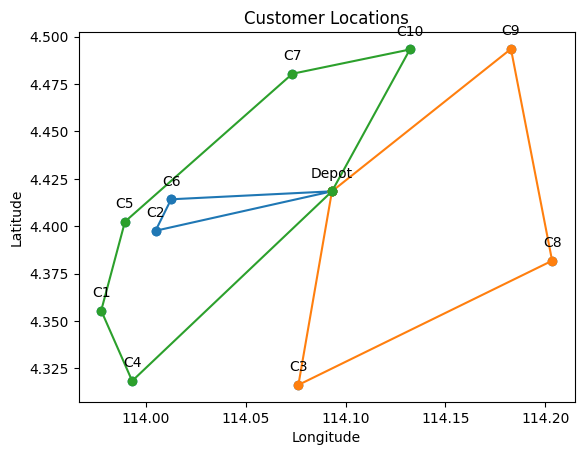

Total Distance = 136.4816 km
Total Cost = RM 179.45

Vehicle 1 (Type B):
Round Trip Distance:52.229 km, Cost: RM 78.34, Demand:27
Depot -> C6 (8.061 km) -> C7 (8.982 km) -> C10 (6.018 km) -> C3 (18.549 km) -> C1 (10.62 km)

Vehicle 2 (Type A):
Round Trip Distance:10.483 km, Cost: RM 12.58, Demand:5
Depot -> C5 (10.483 km)

Vehicle 3 (Type A):
Round Trip Distance:73.769 km, Cost: RM 88.52, Demand:25
Depot -> C9 (11.691 km) -> C2 (20.21 km) -> C8 (19.913 km) -> C4 (21.955 km)



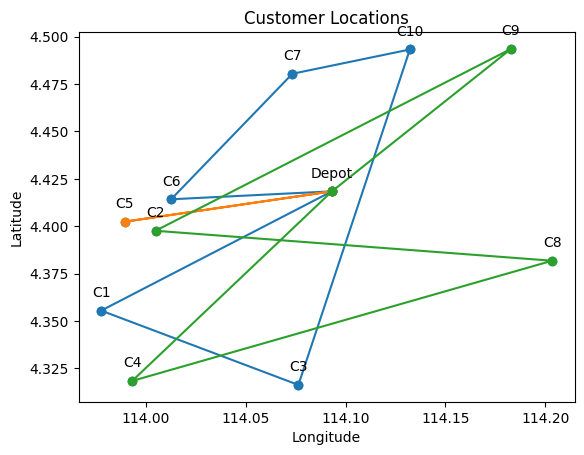

Iteration 1: Best Cost = 176.92170027700496
Iteration 2: Best Cost = 163.5690227189113
Iteration 3: Best Cost = 156.97439068809626
Iteration 4: Best Cost = 137.55679190004537
Iteration 5: Best Cost = 115.22878426037163
Iteration 6: Best Cost = 108.97274383375802
Iteration 7: Best Cost = 106.73994319045207
Iteration 8: Best Cost = 106.73994319045207
Iteration 9: Best Cost = 106.73994319045207
Iteration 10: Best Cost = 106.73994319045207
Iteration 11: Best Cost = 106.73994319045207
Iteration 12: Best Cost = 106.73994319045207
Iteration 13: Best Cost = 106.73994319045207
Iteration 14: Best Cost = 106.73994319045207
Iteration 15: Best Cost = 106.73994319045207
Iteration 16: Best Cost = 106.73994319045207
Iteration 17: Best Cost = 106.73994319045207
Iteration 18: Best Cost = 106.73994319045207
Iteration 19: Best Cost = 106.73994319045207
Iteration 20: Best Cost = 106.73994319045207
Iteration 21: Best Cost = 106.73994319045207
Iteration 22: Best Cost = 106.73994319045207
Iteration 23: Best C

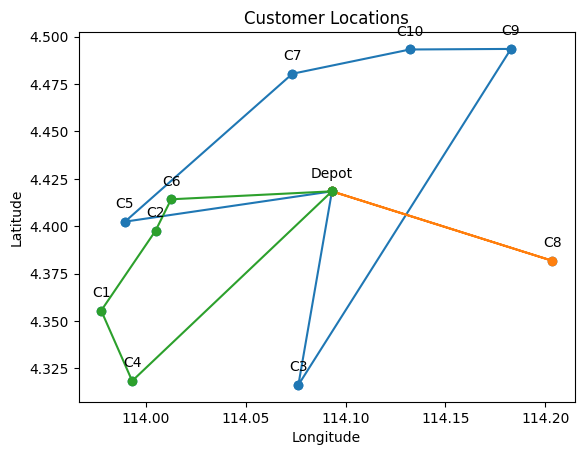

Total Distance = 133.2513 km
Total Cost = RM 182.88

Vehicle 1 (Type B):
Round Trip Distance:76.596 km, Cost: RM 114.89, Demand:30
Depot -> C8 (11.612 km) -> C6 (19.343 km) -> C10 (14.325 km) -> C1 (20.696 km) -> C3 (10.62 km)

Vehicle 2 (Type A):
Round Trip Distance:10.483 km, Cost: RM 12.58, Demand:5
Depot -> C5 (10.483 km)

Vehicle 3 (Type A):
Round Trip Distance:46.172 km, Cost: RM 55.41, Demand:22
Depot -> C2 (9.072 km) -> C4 (8.006 km) -> C7 (18.077 km) -> C9 (11.018 km)



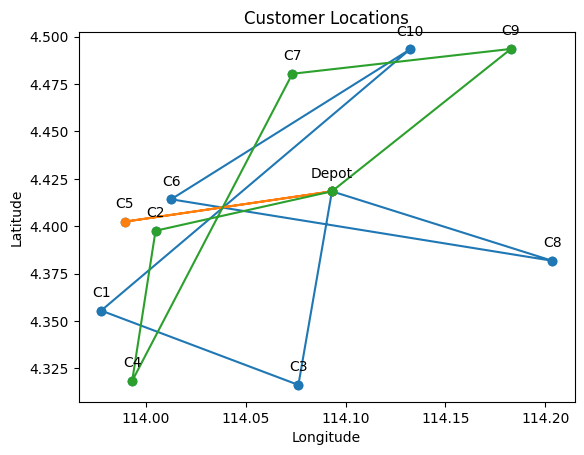

Iteration 1: Best Cost = 180.16042916914188
Iteration 2: Best Cost = 147.841641736088
Iteration 3: Best Cost = 137.55507521607618
Iteration 4: Best Cost = 121.29794619731325
Iteration 5: Best Cost = 115.68418240486221
Iteration 6: Best Cost = 115.5497118552686
Iteration 7: Best Cost = 103.3196198880496
Iteration 8: Best Cost = 103.3196198880496
Iteration 9: Best Cost = 103.3196198880496
Iteration 10: Best Cost = 103.3196198880496
Iteration 11: Best Cost = 103.3196198880496
Iteration 12: Best Cost = 103.3196198880496
Iteration 13: Best Cost = 103.3196198880496
Iteration 14: Best Cost = 103.3196198880496
Iteration 15: Best Cost = 103.3196198880496
Iteration 16: Best Cost = 103.3196198880496
Iteration 17: Best Cost = 103.3196198880496
Iteration 18: Best Cost = 103.3196198880496
Iteration 19: Best Cost = 103.3196198880496
Iteration 20: Best Cost = 103.3196198880496
Iteration 21: Best Cost = 103.3196198880496
Iteration 22: Best Cost = 103.3196198880496
Iteration 23: Best Cost = 103.31961988

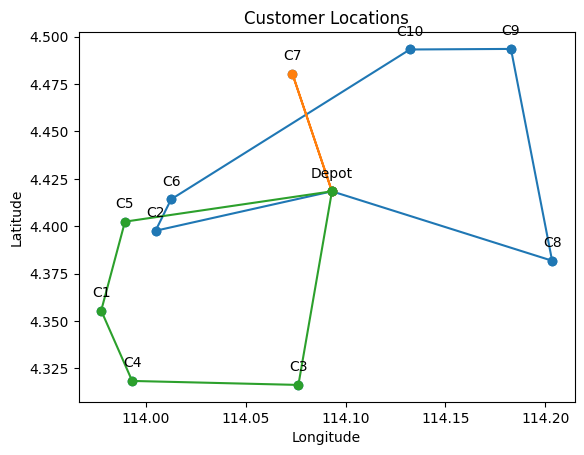

Total Distance = 141.3562 km
Total Cost = RM 169.63

Vehicle 1 (Type A):
Round Trip Distance:22.027 km, Cost: RM 26.43, Demand:11
Depot -> C3 (10.347 km) -> C6 (11.68 km)

Vehicle 2 (Type A):
Round Trip Distance:47.216 km, Cost: RM 56.66, Demand:23
Depot -> C7 (6.508 km) -> C2 (10.746 km) -> C4 (8.006 km) -> C8 (21.955 km)

Vehicle 3 (Type A):
Round Trip Distance:72.113 km, Cost: RM 86.54, Demand:23
Depot -> C1 (13.152 km) -> C10 (20.696 km) -> C5 (16.905 km) -> C9 (21.36 km)



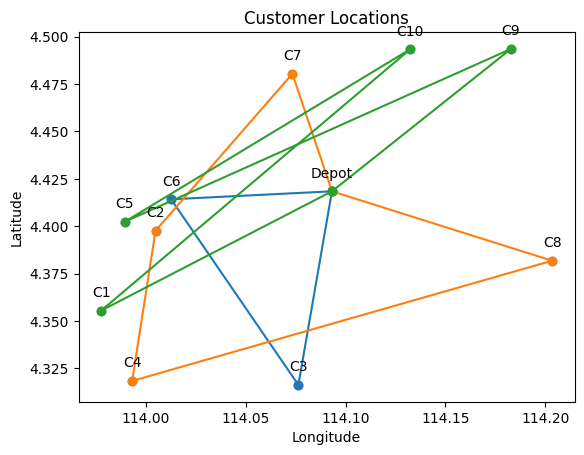

Iteration 1: Best Cost = 136.94686075524294
Iteration 2: Best Cost = 135.90289202354978
Iteration 3: Best Cost = 121.27843884814061
Iteration 4: Best Cost = 118.53538225079387
Iteration 5: Best Cost = 117.0604492040062
Iteration 6: Best Cost = 114.85574812341466
Iteration 7: Best Cost = 110.75600170265646
Iteration 8: Best Cost = 110.75600170265646
Iteration 9: Best Cost = 110.75600170265646
Iteration 10: Best Cost = 110.75600170265646
Iteration 11: Best Cost = 110.75600170265646
Iteration 12: Best Cost = 110.75600170265646
Iteration 13: Best Cost = 110.75600170265646
Iteration 14: Best Cost = 110.75600170265646
Iteration 15: Best Cost = 110.75600170265646
Iteration 16: Best Cost = 110.75600170265646
Iteration 17: Best Cost = 110.75600170265646
Iteration 18: Best Cost = 110.75600170265646
Iteration 19: Best Cost = 110.75600170265646
Iteration 20: Best Cost = 110.75600170265646
Iteration 21: Best Cost = 110.75600170265646
Iteration 22: Best Cost = 110.75600170265646
Iteration 23: Best C

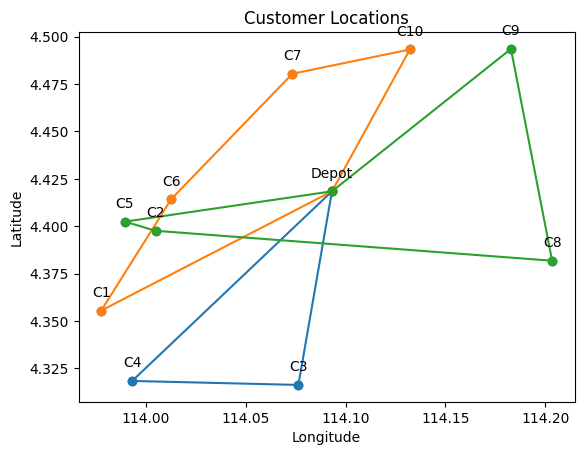

Total Distance = 121.1632 km
Total Cost = RM 145.4

Vehicle 1 (Type A):
Round Trip Distance:45.415 km, Cost: RM 54.5, Demand:24
Depot -> C9 (11.691 km) -> C2 (20.21 km) -> C6 (1.834 km) -> C3 (11.68 km)

Vehicle 2 (Type A):
Round Trip Distance:40.886 km, Cost: RM 49.06, Demand:17
Depot -> C4 (14.142 km) -> C1 (4.021 km) -> C8 (22.723 km)

Vehicle 3 (Type A):
Round Trip Distance:34.862 km, Cost: RM 41.83, Demand:16
Depot -> C7 (6.508 km) -> C5 (11.448 km) -> C10 (16.905 km)



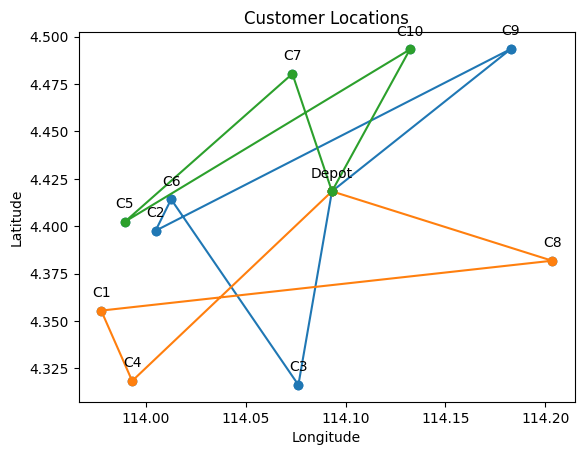

Iteration 1: Best Cost = 125.35508505529916
Iteration 2: Best Cost = 124.29168500164653
Iteration 3: Best Cost = 109.51412095465679
Iteration 4: Best Cost = 105.54643968005962
Iteration 5: Best Cost = 101.6399206690308
Iteration 6: Best Cost = 97.89346071352998
Iteration 7: Best Cost = 93.3396511638567
Iteration 8: Best Cost = 91.87644986771839
Iteration 9: Best Cost = 91.87644986771839
Iteration 10: Best Cost = 91.87644986771839
Iteration 11: Best Cost = 91.87644986771839
Iteration 12: Best Cost = 91.87644986771839
Iteration 13: Best Cost = 91.87644986771839
Iteration 14: Best Cost = 91.87644986771839
Iteration 15: Best Cost = 91.87644986771839
Iteration 16: Best Cost = 91.87644986771839
Iteration 17: Best Cost = 91.87644986771839
Iteration 18: Best Cost = 91.87644986771839
Iteration 19: Best Cost = 91.87644986771839
Iteration 20: Best Cost = 91.87644986771839
Iteration 21: Best Cost = 91.87644986771839
Iteration 22: Best Cost = 91.87644986771839
Iteration 23: Best Cost = 91.876449867

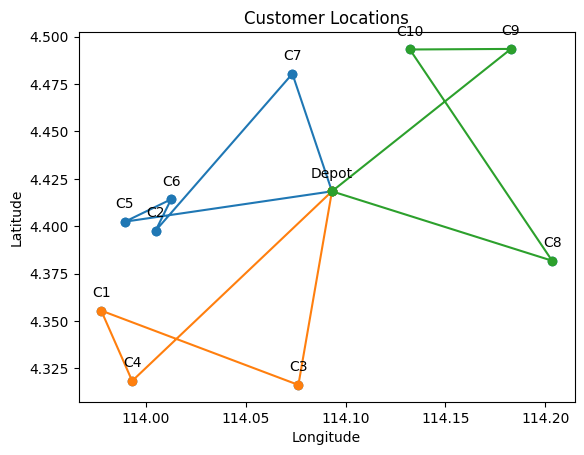

Total Distance = 112.6859 km
Total Cost = RM 165.92

Vehicle 1 (Type A):
Round Trip Distance:10.347 km, Cost: RM 12.42, Demand:3
Depot -> C3 (10.347 km)

Vehicle 2 (Type B):
Round Trip Distance:54.806 km, Cost: RM 82.21, Demand:27
Depot -> C7 (6.508 km) -> C4 (18.077 km) -> C5 (8.408 km) -> C2 (1.604 km) -> C9 (20.21 km)

Vehicle 3 (Type B):
Round Trip Distance:47.532 km, Cost: RM 71.3, Demand:27
Depot -> C1 (13.152 km) -> C6 (6.834 km) -> C10 (14.325 km) -> C8 (13.221 km)



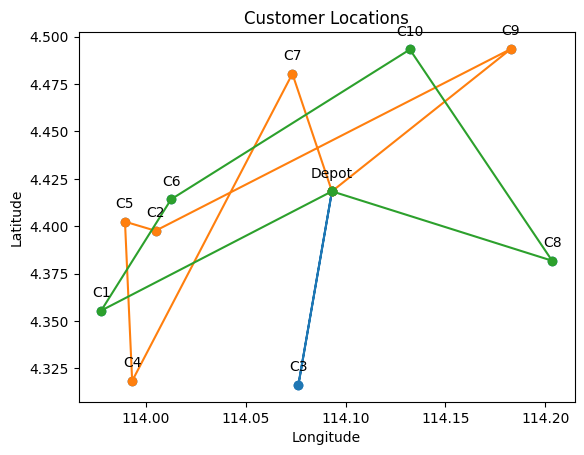

Iteration 1: Best Cost = 153.23716210265053
Iteration 2: Best Cost = 149.01620051101526
Iteration 3: Best Cost = 137.1744476424373
Iteration 4: Best Cost = 122.30404071968957
Iteration 5: Best Cost = 118.63512632896777
Iteration 6: Best Cost = 111.07487185730267
Iteration 7: Best Cost = 105.77997511482491
Iteration 8: Best Cost = 105.77997511482491
Iteration 9: Best Cost = 105.77997511482491
Iteration 10: Best Cost = 105.77997511482491
Iteration 11: Best Cost = 105.77997511482491
Iteration 12: Best Cost = 105.77997511482491
Iteration 13: Best Cost = 105.77997511482491
Iteration 14: Best Cost = 105.77997511482491
Iteration 15: Best Cost = 105.77997511482491
Iteration 16: Best Cost = 105.77997511482491
Iteration 17: Best Cost = 105.77997511482491
Iteration 18: Best Cost = 105.77997511482491
Iteration 19: Best Cost = 105.77997511482491
Iteration 20: Best Cost = 105.77997511482491
Iteration 21: Best Cost = 105.77997511482491
Iteration 22: Best Cost = 105.77997511482491
Iteration 23: Best C

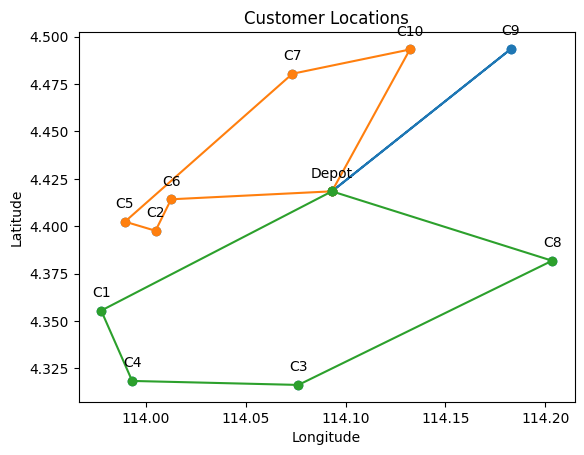

Total Distance = 120.1071 km
Total Cost = RM 144.13

Vehicle 1 (Type A):
Round Trip Distance:61.039 km, Cost: RM 73.25, Demand:25
Depot -> C9 (11.691 km) -> C10 (5.06 km) -> C4 (22.333 km) -> C8 (21.955 km)

Vehicle 2 (Type A):
Round Trip Distance:31.266 km, Cost: RM 37.52, Demand:16
Depot -> C2 (9.072 km) -> C7 (10.746 km) -> C5 (11.448 km)

Vehicle 3 (Type A):
Round Trip Distance:27.801 km, Cost: RM 33.36, Demand:16
Depot -> C3 (10.347 km) -> C1 (10.62 km) -> C6 (6.834 km)



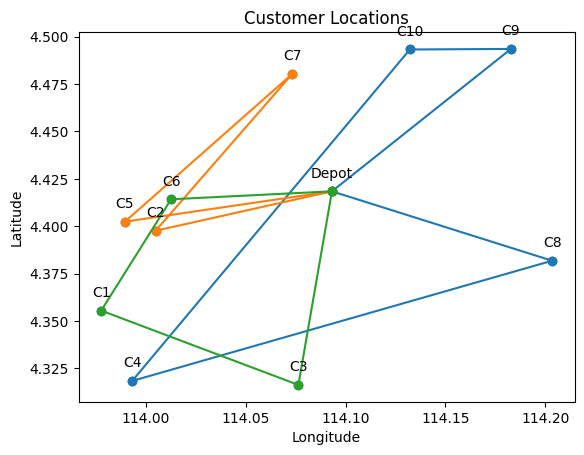

Iteration 1: Best Cost = 138.77375170405062
Iteration 2: Best Cost = 130.7077704458846
Iteration 3: Best Cost = 117.27800231565695
Iteration 4: Best Cost = 106.94783928977945
Iteration 5: Best Cost = 105.89449107891467
Iteration 6: Best Cost = 105.67954123213033
Iteration 7: Best Cost = 103.50767607114865
Iteration 8: Best Cost = 102.93441851524831
Iteration 9: Best Cost = 98.17317574205516
Iteration 10: Best Cost = 96.93444682718655
Iteration 11: Best Cost = 90.68608733208234
Iteration 12: Best Cost = 78.51751314931484
Iteration 13: Best Cost = 78.51751314931484
Iteration 14: Best Cost = 78.51751314931484
Iteration 15: Best Cost = 78.51751314931484
Iteration 16: Best Cost = 78.51751314931484
Iteration 17: Best Cost = 78.51751314931484
Iteration 18: Best Cost = 78.51751314931484
Iteration 19: Best Cost = 78.51751314931484
Iteration 20: Best Cost = 78.51751314931484
Iteration 21: Best Cost = 78.51751314931484
Iteration 22: Best Cost = 78.51751314931484
Iteration 23: Best Cost = 78.51751

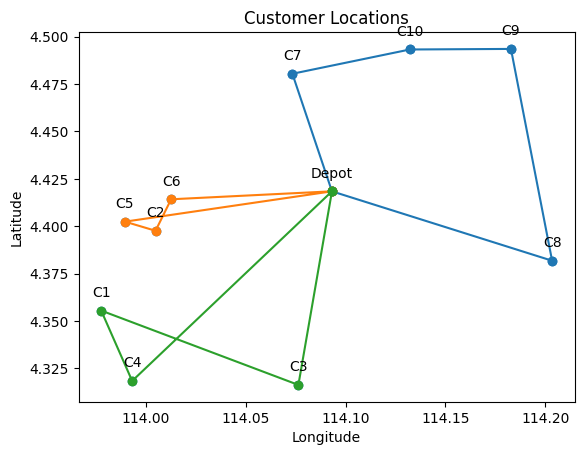

Total Distance = 115.8132 km
Total Cost = RM 138.98

Vehicle 1 (Type A):
Round Trip Distance:48.189 km, Cost: RM 57.83, Demand:18
Depot -> C6 (8.061 km) -> C9 (18.768 km) -> C5 (21.36 km)

Vehicle 2 (Type A):
Round Trip Distance:11.612 km, Cost: RM 13.93, Demand:6
Depot -> C8 (11.612 km)

Vehicle 3 (Type A):
Round Trip Distance:21.098 km, Cost: RM 25.32, Demand:19
Depot -> C2 (9.072 km) -> C4 (8.006 km) -> C1 (4.021 km)

Vehicle 4 (Type A):
Round Trip Distance:34.914 km, Cost: RM 41.9, Demand:14
Depot -> C3 (10.347 km) -> C10 (18.549 km) -> C7 (6.018 km)



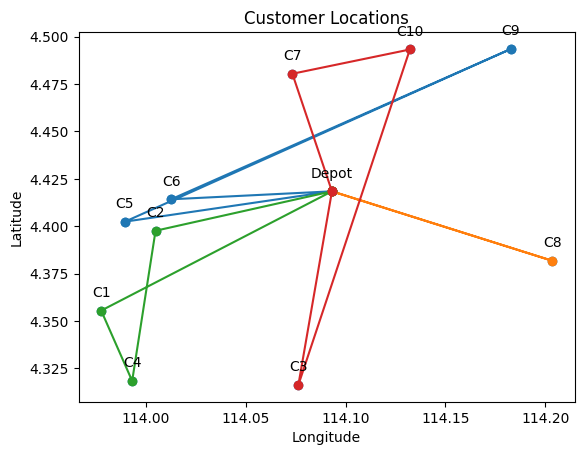

Iteration 1: Best Cost = 118.34471342493333
Iteration 2: Best Cost = 114.91303762125753
Iteration 3: Best Cost = 105.97780946762231
Iteration 4: Best Cost = 97.08665979788253
Iteration 5: Best Cost = 84.59842396070974
Iteration 6: Best Cost = 84.19016745194409
Iteration 7: Best Cost = 82.9772955031037
Iteration 8: Best Cost = 82.9772955031037
Iteration 9: Best Cost = 82.9772955031037
Iteration 10: Best Cost = 82.9772955031037
Iteration 11: Best Cost = 82.9772955031037
Iteration 12: Best Cost = 82.9772955031037
Iteration 13: Best Cost = 82.9772955031037
Iteration 14: Best Cost = 82.9772955031037
Iteration 15: Best Cost = 82.9772955031037
Iteration 16: Best Cost = 82.9772955031037
Iteration 17: Best Cost = 82.9772955031037
Iteration 18: Best Cost = 82.9772955031037
Iteration 19: Best Cost = 82.9772955031037
Iteration 20: Best Cost = 82.9772955031037
Iteration 21: Best Cost = 82.9772955031037
Iteration 22: Best Cost = 82.9772955031037
Iteration 23: Best Cost = 82.9772955031037
Iteration 2

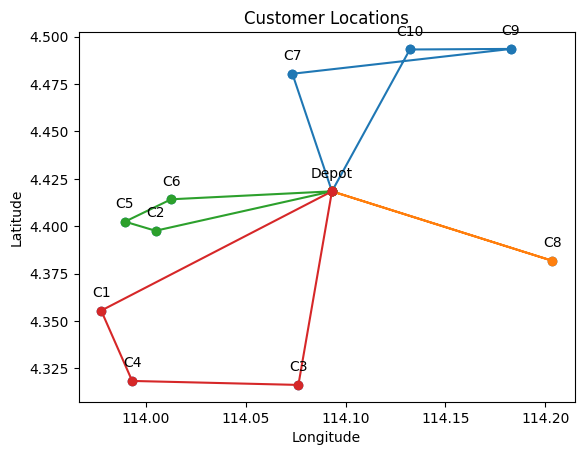

Total Distance = 124.8455 km
Total Cost = RM 149.81

Vehicle 1 (Type A):
Round Trip Distance:25.753 km, Cost: RM 30.9, Demand:22
Depot -> C4 (14.142 km) -> C6 (9.776 km) -> C2 (1.834 km)

Vehicle 2 (Type A):
Round Trip Distance:29.131 km, Cost: RM 34.96, Demand:13
Depot -> C10 (8.436 km) -> C1 (20.696 km)

Vehicle 3 (Type A):
Round Trip Distance:26.76 km, Cost: RM 32.11, Demand:6
Depot -> C3 (10.347 km) -> C7 (16.413 km)

Vehicle 4 (Type A):
Round Trip Distance:43.201 km, Cost: RM 51.84, Demand:16
Depot -> C5 (10.483 km) -> C9 (21.36 km) -> C8 (11.358 km)



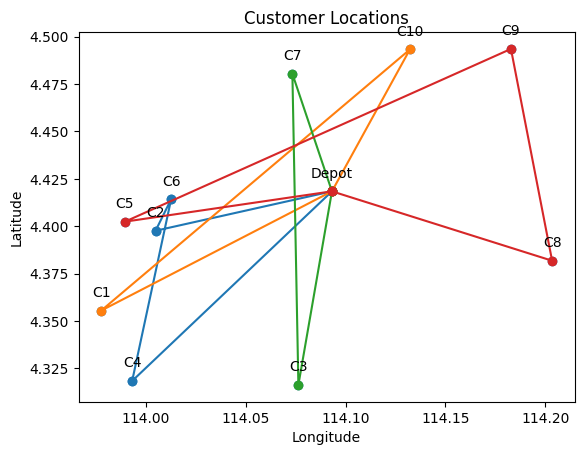

Iteration 1: Best Cost = 148.9774198281029
Iteration 2: Best Cost = 131.11983895025796
Iteration 3: Best Cost = 130.87825371162288
Iteration 4: Best Cost = 121.51941248902472
Iteration 5: Best Cost = 121.27782725038966
Iteration 6: Best Cost = 118.46432877273915
Iteration 7: Best Cost = 110.11828240562394
Iteration 8: Best Cost = 99.70810856190204
Iteration 9: Best Cost = 95.74250200871829
Iteration 10: Best Cost = 94.32367474189995
Iteration 11: Best Cost = 93.33484592562877
Iteration 12: Best Cost = 90.93348452971476
Iteration 13: Best Cost = 86.37967498004147
Iteration 14: Best Cost = 86.37967498004147
Iteration 15: Best Cost = 86.37967498004147
Iteration 16: Best Cost = 86.37967498004147
Iteration 17: Best Cost = 86.37967498004147
Iteration 18: Best Cost = 86.37967498004147
Iteration 19: Best Cost = 86.37967498004147
Iteration 20: Best Cost = 86.37967498004147
Iteration 21: Best Cost = 86.37967498004147
Iteration 22: Best Cost = 86.37967498004147
Iteration 23: Best Cost = 86.379674

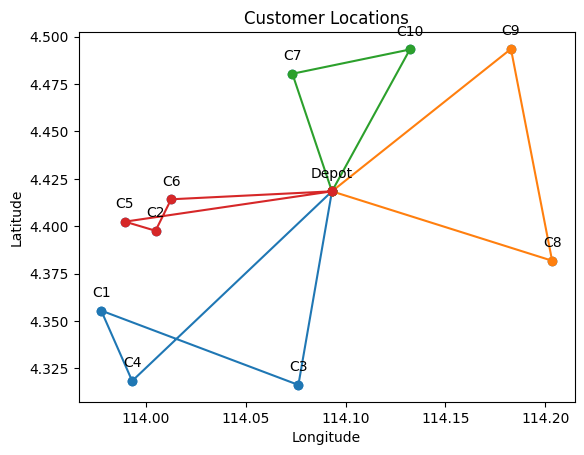

Total Distance = 132.8158 km
Total Cost = RM 159.38

Vehicle 1 (Type A):
Round Trip Distance:17.957 km, Cost: RM 21.55, Demand:8
Depot -> C7 (6.508 km) -> C5 (11.448 km)

Vehicle 2 (Type A):
Round Trip Distance:18.164 km, Cost: RM 21.8, Demand:13
Depot -> C1 (13.152 km) -> C2 (5.012 km)

Vehicle 3 (Type A):
Round Trip Distance:55.9 km, Cost: RM 67.08, Demand:20
Depot -> C8 (11.612 km) -> C4 (21.955 km) -> C10 (22.333 km)

Vehicle 4 (Type A):
Round Trip Distance:40.795 km, Cost: RM 48.95, Demand:16
Depot -> C3 (10.347 km) -> C6 (11.68 km) -> C9 (18.768 km)



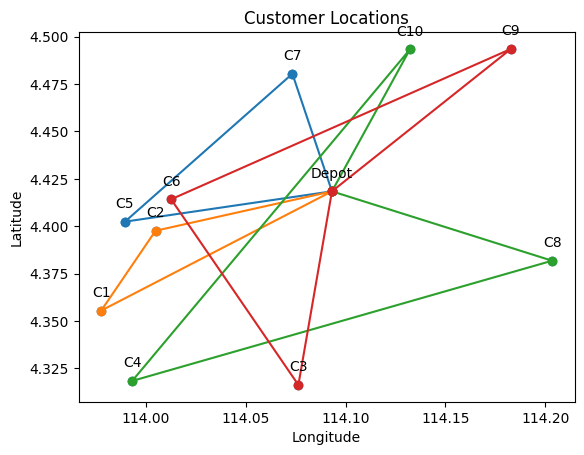

Iteration 1: Best Cost = 158.21877163461969
Iteration 2: Best Cost = 138.64894009103335
Iteration 3: Best Cost = 131.8791474217237
Iteration 4: Best Cost = 126.1688849502242
Iteration 5: Best Cost = 123.86623676559815
Iteration 6: Best Cost = 116.16000760292003
Iteration 7: Best Cost = 110.46813403904805
Iteration 8: Best Cost = 101.80380871102707
Iteration 9: Best Cost = 95.54714444176369
Iteration 10: Best Cost = 92.59111047068181
Iteration 11: Best Cost = 91.07359512032848
Iteration 12: Best Cost = 91.07359512032848
Iteration 13: Best Cost = 91.07359512032848
Iteration 14: Best Cost = 91.07359512032848
Iteration 15: Best Cost = 91.07359512032848
Iteration 16: Best Cost = 91.07359512032848
Iteration 17: Best Cost = 91.07359512032848
Iteration 18: Best Cost = 91.07359512032848
Iteration 19: Best Cost = 91.07359512032848
Iteration 20: Best Cost = 91.07359512032848
Iteration 21: Best Cost = 91.07359512032848
Iteration 22: Best Cost = 91.07359512032848
Iteration 23: Best Cost = 91.073595

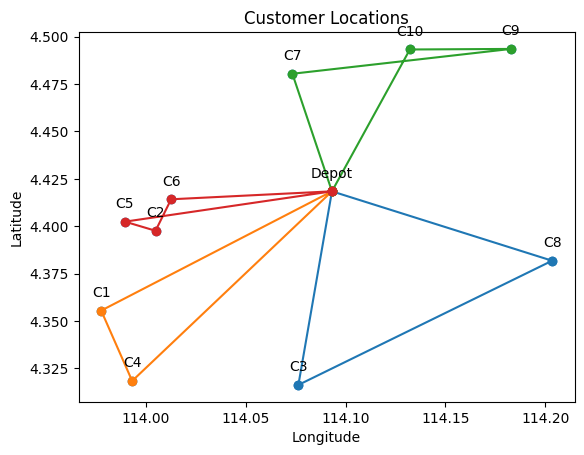

Total Distance = 125.5073 km
Total Cost = RM 150.61

Vehicle 1 (Type A):
Round Trip Distance:29.815 km, Cost: RM 35.78, Demand:19
Depot -> C7 (6.508 km) -> C6 (8.982 km) -> C10 (14.325 km)

Vehicle 2 (Type A):
Round Trip Distance:34.335 km, Cost: RM 41.2, Demand:11
Depot -> C8 (11.612 km) -> C1 (22.723 km)

Vehicle 3 (Type A):
Round Trip Distance:19.898 km, Cost: RM 23.88, Demand:11
Depot -> C2 (9.072 km) -> C3 (10.827 km)

Vehicle 4 (Type A):
Round Trip Distance:41.459 km, Cost: RM 49.75, Demand:16
Depot -> C9 (11.691 km) -> C5 (21.36 km) -> C4 (8.408 km)



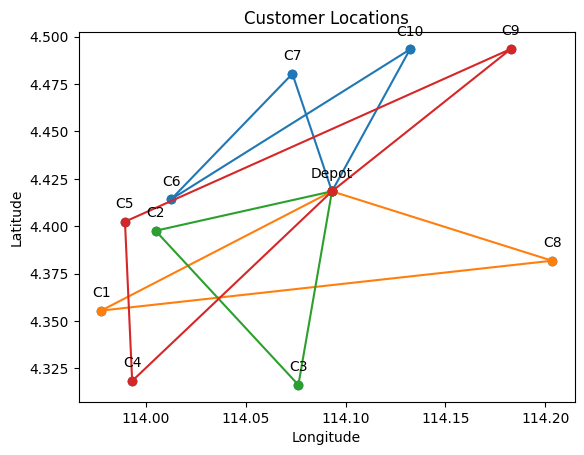

Iteration 1: Best Cost = 138.60948009998356
Iteration 2: Best Cost = 128.18919388402935
Iteration 3: Best Cost = 117.582187383882
Iteration 4: Best Cost = 116.58426528182594
Iteration 5: Best Cost = 113.78353107719187
Iteration 6: Best Cost = 103.34106750692233
Iteration 7: Best Cost = 101.5258550271882
Iteration 8: Best Cost = 101.43080969433308
Iteration 9: Best Cost = 96.8770001446598
Iteration 10: Best Cost = 96.8770001446598
Iteration 11: Best Cost = 96.8770001446598
Iteration 12: Best Cost = 96.8770001446598
Iteration 13: Best Cost = 96.8770001446598
Iteration 14: Best Cost = 96.8770001446598
Iteration 15: Best Cost = 96.8770001446598
Iteration 16: Best Cost = 96.8770001446598
Iteration 17: Best Cost = 96.8770001446598
Iteration 18: Best Cost = 96.8770001446598
Iteration 19: Best Cost = 96.8770001446598
Iteration 20: Best Cost = 96.8770001446598
Iteration 21: Best Cost = 96.8770001446598
Iteration 22: Best Cost = 96.8770001446598
Iteration 23: Best Cost = 96.8770001446598
Iterati

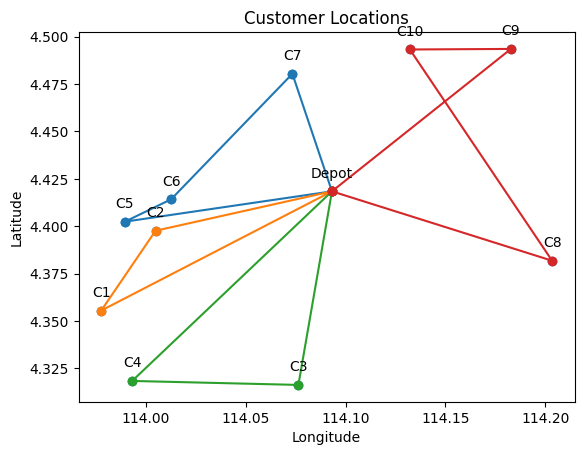

Total Distance = 102.4566 km
Total Cost = RM 122.95

Vehicle 1 (Type A):
Round Trip Distance:22.586 km, Cost: RM 27.1, Demand:19
Depot -> C2 (9.072 km) -> C6 (1.834 km) -> C3 (11.68 km)

Vehicle 2 (Type A):
Round Trip Distance:43.32 km, Cost: RM 51.98, Demand:16
Depot -> C5 (10.483 km) -> C8 (21.479 km) -> C9 (11.358 km)

Vehicle 3 (Type A):
Round Trip Distance:36.551 km, Cost: RM 43.86, Demand:22
Depot -> C10 (8.436 km) -> C7 (6.018 km) -> C4 (18.077 km) -> C1 (4.021 km)



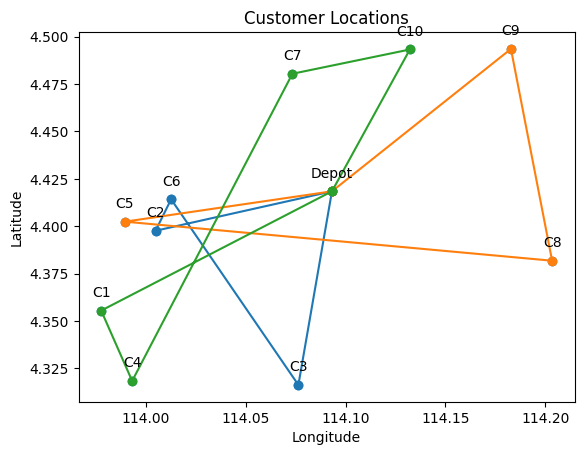

Iteration 1: Best Cost = 119.55501689978647
Iteration 2: Best Cost = 105.54554958750411
Iteration 3: Best Cost = 98.13525501754935
Iteration 4: Best Cost = 92.65939228696398
Iteration 5: Best Cost = 83.19710441182069
Iteration 6: Best Cost = 80.79574301590668
Iteration 7: Best Cost = 80.79574301590668
Iteration 8: Best Cost = 80.79574301590668
Iteration 9: Best Cost = 80.79574301590668
Iteration 10: Best Cost = 80.79574301590668
Iteration 11: Best Cost = 80.79574301590668
Iteration 12: Best Cost = 80.79574301590668
Iteration 13: Best Cost = 80.79574301590668
Iteration 14: Best Cost = 80.79574301590668
Iteration 15: Best Cost = 80.79574301590668
Iteration 16: Best Cost = 80.79574301590668
Iteration 17: Best Cost = 80.79574301590668
Iteration 18: Best Cost = 80.79574301590668
Iteration 19: Best Cost = 80.79574301590668
Iteration 20: Best Cost = 80.79574301590668
Iteration 21: Best Cost = 80.79574301590668
Iteration 22: Best Cost = 80.79574301590668
Iteration 23: Best Cost = 80.7957430159

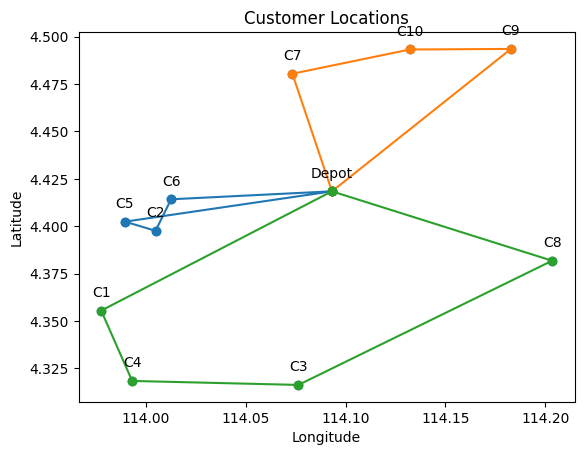

Total Distance = 107.903 km
Total Cost = RM 137.39

Vehicle 1 (Type A):
Round Trip Distance:32.36 km, Cost: RM 38.83, Demand:8
Depot -> C9 (11.691 km) -> C3 (20.669 km)

Vehicle 2 (Type A):
Round Trip Distance:13.152 km, Cost: RM 15.78, Demand:5
Depot -> C1 (13.152 km)

Vehicle 3 (Type A):
Round Trip Distance:36.046 km, Cost: RM 43.25, Demand:17
Depot -> C7 (6.508 km) -> C8 (16.316 km) -> C10 (13.221 km)

Vehicle 4 (Type B):
Round Trip Distance:26.346 km, Cost: RM 39.52, Demand:27
Depot -> C4 (14.142 km) -> C2 (8.006 km) -> C5 (1.604 km) -> C6 (2.594 km)



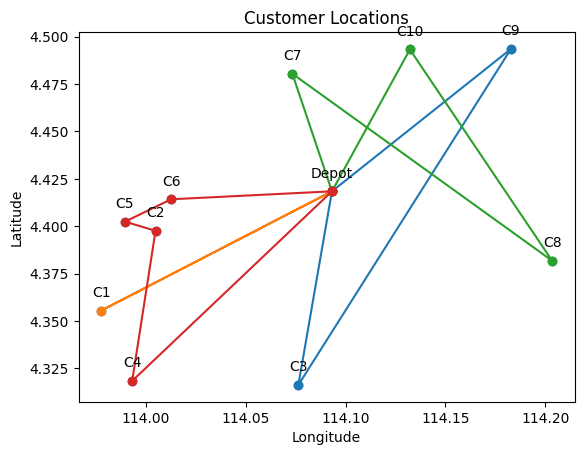

Iteration 1: Best Cost = 132.59958159056146
Iteration 2: Best Cost = 127.93648262189686
Iteration 3: Best Cost = 127.70902155180244
Iteration 4: Best Cost = 121.51594642995036
Iteration 5: Best Cost = 120.5866346526158
Iteration 6: Best Cost = 108.31478480627223
Iteration 7: Best Cost = 106.1967422433411
Iteration 8: Best Cost = 102.45028228784028
Iteration 9: Best Cost = 101.76168702503296
Iteration 10: Best Cost = 96.45159706900925
Iteration 11: Best Cost = 91.98296114847149
Iteration 12: Best Cost = 90.08123970056371
Iteration 13: Best Cost = 86.1747206895349
Iteration 14: Best Cost = 86.1747206895349
Iteration 15: Best Cost = 86.1747206895349
Iteration 16: Best Cost = 86.1747206895349
Iteration 17: Best Cost = 86.1747206895349
Iteration 18: Best Cost = 86.1747206895349
Iteration 19: Best Cost = 86.1747206895349
Iteration 20: Best Cost = 86.1747206895349
Iteration 21: Best Cost = 86.1747206895349
Iteration 22: Best Cost = 86.1747206895349
Iteration 23: Best Cost = 86.1747206895349
I

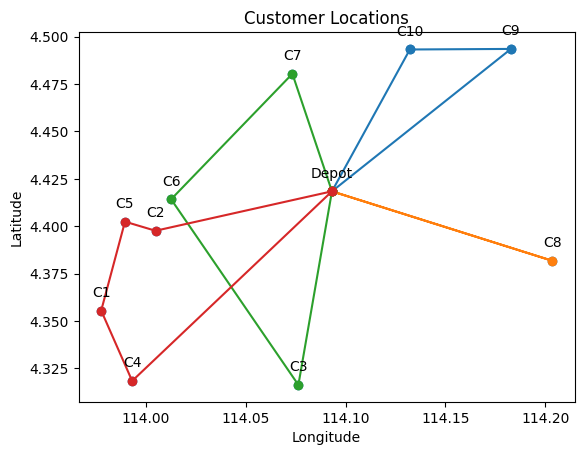

Total Distance = 120.978 km
Total Cost = RM 145.17

Vehicle 1 (Type A):
Round Trip Distance:25.341 km, Cost: RM 30.41, Demand:13
Depot -> C10 (8.436 km) -> C5 (16.905 km)

Vehicle 2 (Type A):
Round Trip Distance:39.907 km, Cost: RM 47.89, Demand:19
Depot -> C9 (11.691 km) -> C2 (20.21 km) -> C4 (8.006 km)

Vehicle 3 (Type A):
Round Trip Distance:27.928 km, Cost: RM 33.51, Demand:9
Depot -> C8 (11.612 km) -> C7 (16.316 km)

Vehicle 4 (Type A):
Round Trip Distance:27.801 km, Cost: RM 33.36, Demand:16
Depot -> C3 (10.347 km) -> C1 (10.62 km) -> C6 (6.834 km)



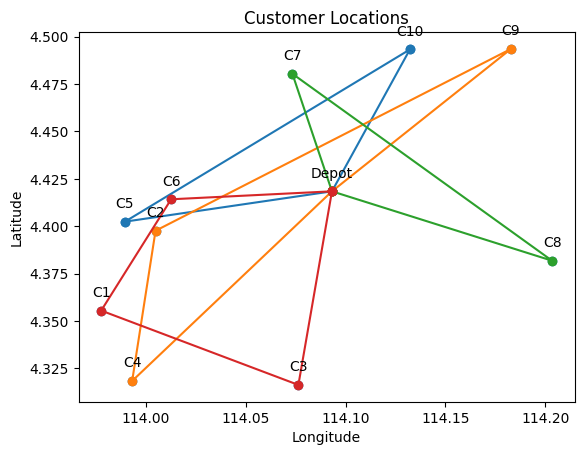

Iteration 1: Best Cost = 134.3911956298067
Iteration 2: Best Cost = 133.49051762596542
Iteration 3: Best Cost = 121.24575452247808
Iteration 4: Best Cost = 112.9931639636566
Iteration 5: Best Cost = 108.50622324112709
Iteration 6: Best Cost = 104.97582372357087
Iteration 7: Best Cost = 100.17552122912599
Iteration 8: Best Cost = 98.48214321235056
Iteration 9: Best Cost = 98.03248723213102
Iteration 10: Best Cost = 98.03248723213102
Iteration 11: Best Cost = 98.03248723213102
Iteration 12: Best Cost = 98.03248723213102
Iteration 13: Best Cost = 98.03248723213102
Iteration 14: Best Cost = 98.03248723213102
Iteration 15: Best Cost = 98.03248723213102
Iteration 16: Best Cost = 98.03248723213102
Iteration 17: Best Cost = 98.03248723213102
Iteration 18: Best Cost = 98.03248723213102
Iteration 19: Best Cost = 98.03248723213102
Iteration 20: Best Cost = 98.03248723213102
Iteration 21: Best Cost = 98.03248723213102
Iteration 22: Best Cost = 98.03248723213102
Iteration 23: Best Cost = 98.0324872

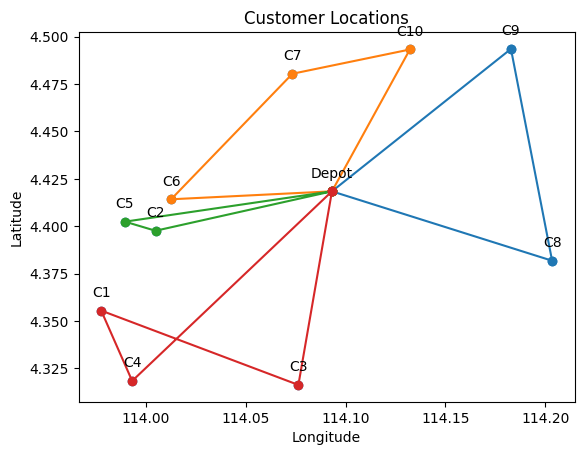

Total Distance = 123.0049 km
Total Cost = RM 147.61

Vehicle 1 (Type A):
Round Trip Distance:18.164 km, Cost: RM 21.8, Demand:13
Depot -> C1 (13.152 km) -> C2 (5.012 km)

Vehicle 2 (Type A):
Round Trip Distance:59.615 km, Cost: RM 71.54, Demand:17
Depot -> C8 (11.612 km) -> C7 (16.316 km) -> C9 (11.018 km) -> C3 (20.669 km)

Vehicle 3 (Type A):
Round Trip Distance:17.837 km, Cost: RM 21.4, Demand:14
Depot -> C6 (8.061 km) -> C4 (9.776 km)

Vehicle 4 (Type A):
Round Trip Distance:27.388 km, Cost: RM 32.87, Demand:13
Depot -> C5 (10.483 km) -> C10 (16.905 km)



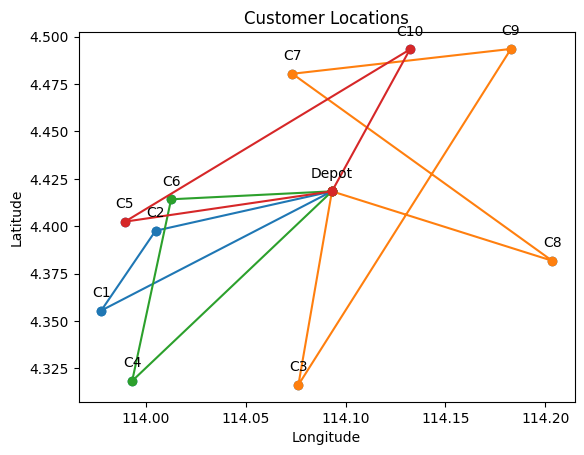

Iteration 1: Best Cost = 142.86711258420866
Iteration 2: Best Cost = 133.5123357702384
Iteration 3: Best Cost = 111.60726987125418
Iteration 4: Best Cost = 105.93730073954677
Iteration 5: Best Cost = 104.24392272277134
Iteration 6: Best Cost = 102.72640737241801
Iteration 7: Best Cost = 102.72640737241801
Iteration 8: Best Cost = 102.72640737241801
Iteration 9: Best Cost = 102.72640737241801
Iteration 10: Best Cost = 102.72640737241801
Iteration 11: Best Cost = 102.72640737241801
Iteration 12: Best Cost = 102.72640737241801
Iteration 13: Best Cost = 102.72640737241801
Iteration 14: Best Cost = 102.72640737241801
Iteration 15: Best Cost = 102.72640737241801
Iteration 16: Best Cost = 102.72640737241801
Iteration 17: Best Cost = 102.72640737241801
Iteration 18: Best Cost = 102.72640737241801
Iteration 19: Best Cost = 102.72640737241801
Iteration 20: Best Cost = 102.72640737241801
Iteration 21: Best Cost = 102.72640737241801
Iteration 22: Best Cost = 102.72640737241801
Iteration 23: Best C

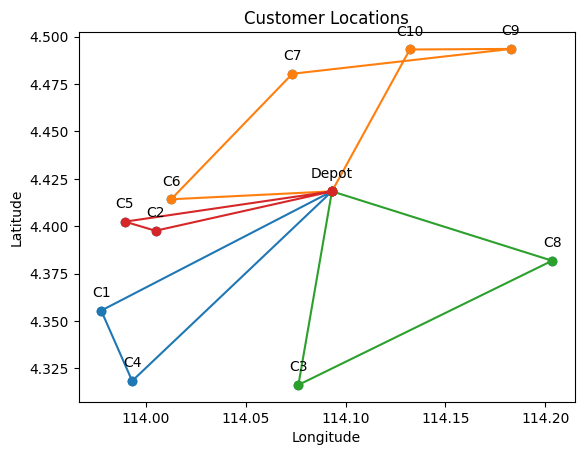

Total Distance = 144.5528 km
Total Cost = RM 173.46

Vehicle 1 (Type A):
Round Trip Distance:25.341 km, Cost: RM 30.41, Demand:13
Depot -> C10 (8.436 km) -> C5 (16.905 km)

Vehicle 2 (Type A):
Round Trip Distance:58.082 km, Cost: RM 69.7, Demand:18
Depot -> C1 (13.152 km) -> C9 (24.72 km) -> C2 (20.21 km)

Vehicle 3 (Type A):
Round Trip Distance:23.919 km, Cost: RM 28.7, Demand:14
Depot -> C4 (14.142 km) -> C6 (9.776 km)

Vehicle 4 (Type A):
Round Trip Distance:37.211 km, Cost: RM 44.65, Demand:12
Depot -> C7 (6.508 km) -> C3 (16.413 km) -> C8 (14.29 km)



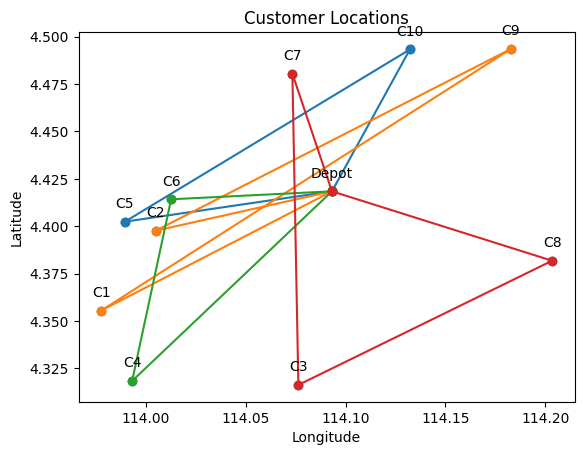

Iteration 1: Best Cost = 158.68582715522257
Iteration 2: Best Cost = 137.23270813657626
Iteration 3: Best Cost = 136.81982474602137
Iteration 4: Best Cost = 112.44541715198139
Iteration 5: Best Cost = 111.28757833866406
Iteration 6: Best Cost = 103.54941485462136
Iteration 7: Best Cost = 97.35347108987644
Iteration 8: Best Cost = 96.16492038042666
Iteration 9: Best Cost = 96.16492038042666
Iteration 10: Best Cost = 96.16492038042666
Iteration 11: Best Cost = 96.16492038042666
Iteration 12: Best Cost = 96.16492038042666
Iteration 13: Best Cost = 96.16492038042666
Iteration 14: Best Cost = 96.16492038042666
Iteration 15: Best Cost = 96.16492038042666
Iteration 16: Best Cost = 96.16492038042666
Iteration 17: Best Cost = 96.16492038042666
Iteration 18: Best Cost = 96.16492038042666
Iteration 19: Best Cost = 96.16492038042666
Iteration 20: Best Cost = 96.16492038042666
Iteration 21: Best Cost = 96.16492038042666
Iteration 22: Best Cost = 96.16492038042666
Iteration 23: Best Cost = 96.164920

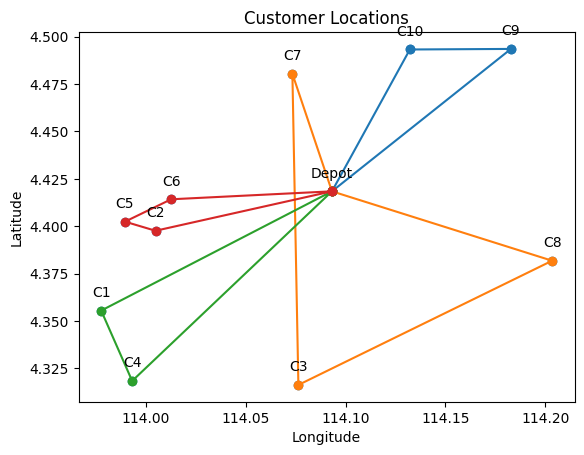

Total Distance = 121.4271 km
Total Cost = RM 145.71

Vehicle 1 (Type A):
Round Trip Distance:17.837 km, Cost: RM 21.4, Demand:14
Depot -> C6 (8.061 km) -> C4 (9.776 km)

Vehicle 2 (Type A):
Round Trip Distance:59.156 km, Cost: RM 70.99, Demand:22
Depot -> C8 (11.612 km) -> C7 (16.316 km) -> C9 (11.018 km) -> C2 (20.21 km)

Vehicle 3 (Type A):
Round Trip Distance:35.998 km, Cost: RM 43.2, Demand:13
Depot -> C1 (13.152 km) -> C3 (10.62 km) -> C5 (12.226 km)

Vehicle 4 (Type A):
Round Trip Distance:8.436 km, Cost: RM 10.12, Demand:8
Depot -> C10 (8.436 km)



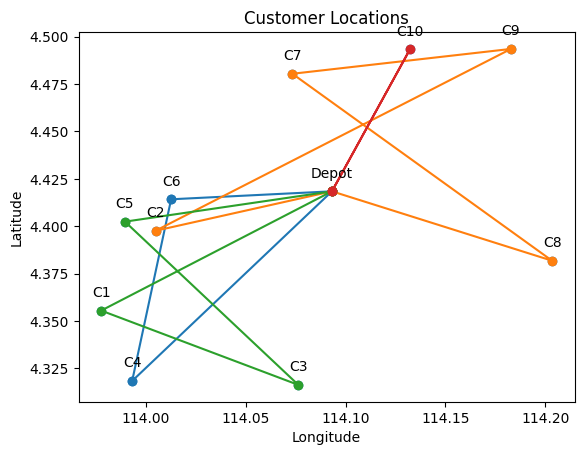

Iteration 1: Best Cost = 128.29565066072976
Iteration 2: Best Cost = 110.3501983052552
Iteration 3: Best Cost = 108.60564266585986
Iteration 4: Best Cost = 104.79190588085235
Iteration 5: Best Cost = 104.09422186882395
Iteration 6: Best Cost = 99.80408867696191
Iteration 7: Best Cost = 96.60146549431431
Iteration 8: Best Cost = 94.69974404640654
Iteration 9: Best Cost = 94.69974404640654
Iteration 10: Best Cost = 94.69974404640654
Iteration 11: Best Cost = 94.69974404640654
Iteration 12: Best Cost = 94.69974404640654
Iteration 13: Best Cost = 94.69974404640654
Iteration 14: Best Cost = 94.69974404640654
Iteration 15: Best Cost = 94.69974404640654
Iteration 16: Best Cost = 94.69974404640654
Iteration 17: Best Cost = 94.69974404640654
Iteration 18: Best Cost = 94.69974404640654
Iteration 19: Best Cost = 94.69974404640654
Iteration 20: Best Cost = 94.69974404640654
Iteration 21: Best Cost = 94.69974404640654
Iteration 22: Best Cost = 94.69974404640654
Iteration 23: Best Cost = 94.69974404

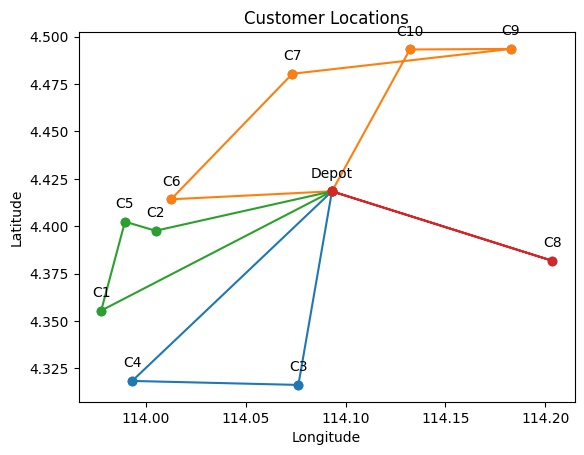

Total Distance = 119.0311 km
Total Cost = RM 142.84

Vehicle 1 (Type A):
Round Trip Distance:24.356 km, Cost: RM 29.23, Demand:16
Depot -> C10 (8.436 km) -> C2 (15.92 km)

Vehicle 2 (Type A):
Round Trip Distance:17.043 km, Cost: RM 20.45, Demand:11
Depot -> C6 (8.061 km) -> C7 (8.982 km)

Vehicle 3 (Type A):
Round Trip Distance:14.142 km, Cost: RM 16.97, Demand:6
Depot -> C4 (14.142 km)

Vehicle 4 (Type A):
Round Trip Distance:63.491 km, Cost: RM 76.19, Demand:24
Depot -> C3 (10.347 km) -> C5 (12.226 km) -> C1 (4.839 km) -> C9 (24.72 km) -> C8 (11.358 km)



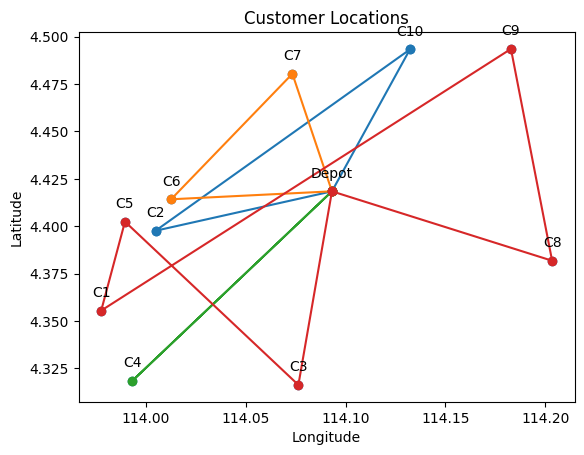

Iteration 1: Best Cost = 140.5355214820102
Iteration 2: Best Cost = 135.39260989467036
Iteration 3: Best Cost = 122.37752099015016
Iteration 4: Best Cost = 107.31301227641359
Iteration 5: Best Cost = 99.94474058809097
Iteration 6: Best Cost = 99.01157220412097
Iteration 7: Best Cost = 84.16988542178498
Iteration 8: Best Cost = 84.16988542178498
Iteration 9: Best Cost = 84.16988542178498
Iteration 10: Best Cost = 84.16988542178498
Iteration 11: Best Cost = 84.16988542178498
Iteration 12: Best Cost = 84.16988542178498
Iteration 13: Best Cost = 84.16988542178498
Iteration 14: Best Cost = 84.16988542178498
Iteration 15: Best Cost = 84.16988542178498
Iteration 16: Best Cost = 84.16988542178498
Iteration 17: Best Cost = 84.16988542178498
Iteration 18: Best Cost = 84.16988542178498
Iteration 19: Best Cost = 84.16988542178498
Iteration 20: Best Cost = 84.16988542178498
Iteration 21: Best Cost = 84.16988542178498
Iteration 22: Best Cost = 84.16988542178498
Iteration 23: Best Cost = 84.169885421

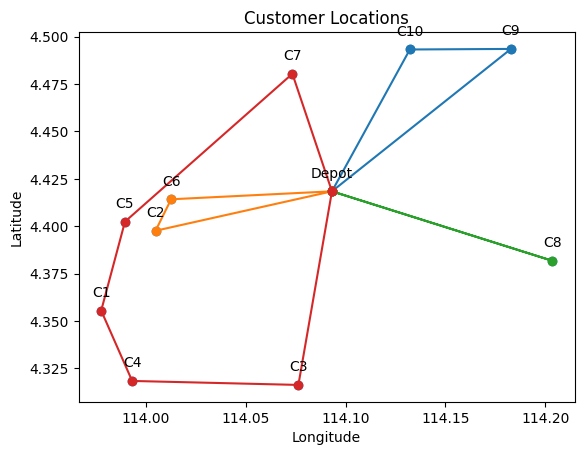

Total Distance = 129.7181 km
Total Cost = RM 155.66

Vehicle 1 (Type A):
Round Trip Distance:68.559 km, Cost: RM 82.27, Demand:16
Depot -> C9 (11.691 km) -> C1 (24.72 km) -> C7 (15.735 km) -> C3 (16.413 km)

Vehicle 2 (Type A):
Round Trip Distance:10.483 km, Cost: RM 12.58, Demand:5
Depot -> C5 (10.483 km)

Vehicle 3 (Type A):
Round Trip Distance:25.843 km, Cost: RM 31.01, Demand:22
Depot -> C6 (8.061 km) -> C4 (9.776 km) -> C2 (8.006 km)

Vehicle 4 (Type A):
Round Trip Distance:24.833 km, Cost: RM 29.8, Demand:14
Depot -> C8 (11.612 km) -> C10 (13.221 km)



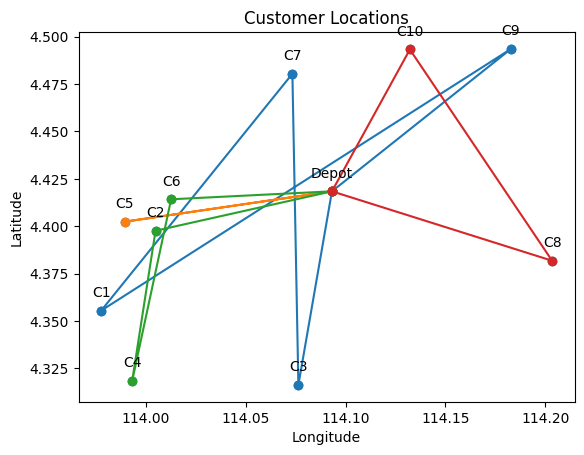

Iteration 1: Best Cost = 144.47007948164088
Iteration 2: Best Cost = 141.99373827478962
Iteration 3: Best Cost = 129.6268343174786
Iteration 4: Best Cost = 122.11029788369991
Iteration 5: Best Cost = 121.58503726481015
Iteration 6: Best Cost = 117.8824586355201
Iteration 7: Best Cost = 114.058276692893
Iteration 8: Best Cost = 109.70755135365795
Iteration 9: Best Cost = 105.15374180398467
Iteration 10: Best Cost = 97.78547011566204
Iteration 11: Best Cost = 97.78547011566204
Iteration 12: Best Cost = 97.78547011566204
Iteration 13: Best Cost = 97.78547011566204
Iteration 14: Best Cost = 97.78547011566204
Iteration 15: Best Cost = 97.78547011566204
Iteration 16: Best Cost = 97.78547011566204
Iteration 17: Best Cost = 97.78547011566204
Iteration 18: Best Cost = 97.78547011566204
Iteration 19: Best Cost = 97.78547011566204
Iteration 20: Best Cost = 97.78547011566204
Iteration 21: Best Cost = 97.78547011566204
Iteration 22: Best Cost = 97.78547011566204
Iteration 23: Best Cost = 97.7854701

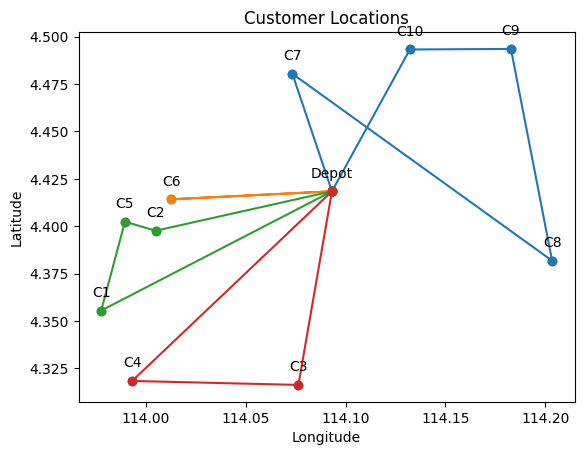

Total Distance = 112.9744 km
Total Cost = RM 155.7

Vehicle 1 (Type B):
Round Trip Distance:67.114 km, Cost: RM 100.67, Demand:30
Depot -> C4 (14.142 km) -> C8 (21.955 km) -> C6 (19.343 km) -> C1 (6.834 km) -> C5 (4.839 km)

Vehicle 2 (Type A):
Round Trip Distance:8.436 km, Cost: RM 10.12, Demand:8
Depot -> C10 (8.436 km)

Vehicle 3 (Type A):
Round Trip Distance:19.898 km, Cost: RM 23.88, Demand:11
Depot -> C2 (9.072 km) -> C3 (10.827 km)

Vehicle 4 (Type A):
Round Trip Distance:17.527 km, Cost: RM 21.03, Demand:8
Depot -> C7 (6.508 km) -> C9 (11.018 km)



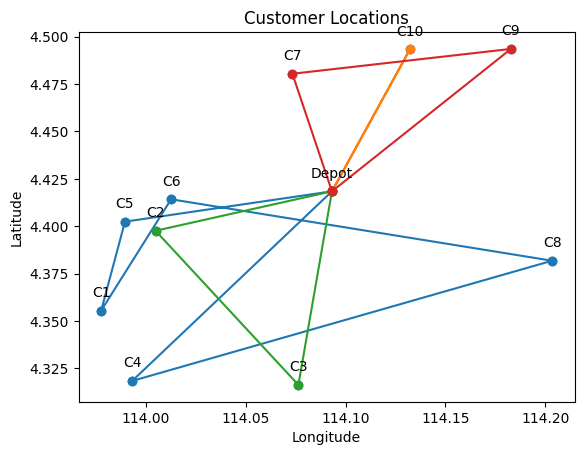

Iteration 1: Best Cost = 148.55363736202992
Iteration 2: Best Cost = 146.15772024175806
Iteration 3: Best Cost = 124.73407853806634
Iteration 4: Best Cost = 121.74305647896693
Iteration 5: Best Cost = 117.42720246025121
Iteration 6: Best Cost = 116.43837364398003
Iteration 7: Best Cost = 109.55754623258888
Iteration 8: Best Cost = 88.5511726938625
Iteration 9: Best Cost = 85.54947094897
Iteration 10: Best Cost = 85.54947094897
Iteration 11: Best Cost = 85.54947094897
Iteration 12: Best Cost = 85.54947094897
Iteration 13: Best Cost = 85.54947094897
Iteration 14: Best Cost = 85.54947094897
Iteration 15: Best Cost = 85.54947094897
Iteration 16: Best Cost = 85.54947094897
Iteration 17: Best Cost = 85.54947094897
Iteration 18: Best Cost = 85.54947094897
Iteration 19: Best Cost = 85.54947094897
Iteration 20: Best Cost = 85.54947094897
Iteration 21: Best Cost = 85.54947094897
Iteration 22: Best Cost = 85.54947094897
Iteration 23: Best Cost = 85.54947094897
Iteration 24: Best Cost = 85.5494709

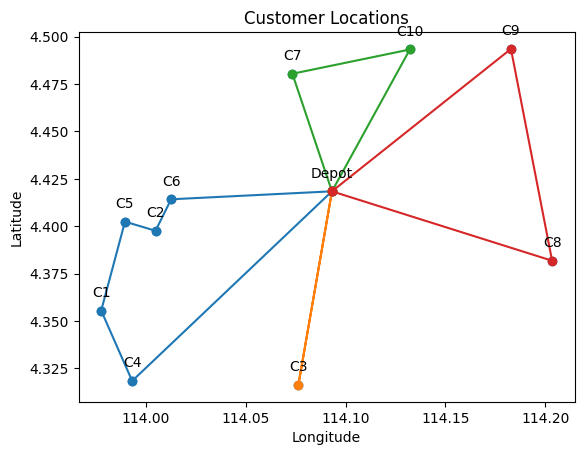

Total Distance = 139.8518 km
Total Cost = RM 167.82

Vehicle 1 (Type A):
Round Trip Distance:50.164 km, Cost: RM 60.2, Demand:14
Depot -> C1 (13.152 km) -> C8 (22.723 km) -> C3 (14.29 km)

Vehicle 2 (Type A):
Round Trip Distance:6.508 km, Cost: RM 7.81, Demand:3
Depot -> C7 (6.508 km)

Vehicle 3 (Type A):
Round Trip Distance:50.642 km, Cost: RM 60.77, Demand:18
Depot -> C2 (9.072 km) -> C9 (20.21 km) -> C5 (21.36 km)

Vehicle 4 (Type A):
Round Trip Distance:32.537 km, Cost: RM 39.04, Demand:22
Depot -> C10 (8.436 km) -> C6 (14.325 km) -> C4 (9.776 km)



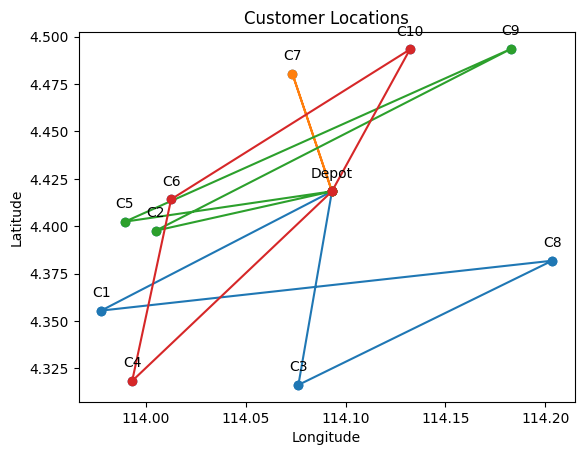

Iteration 1: Best Cost = 164.5412945179059
Iteration 2: Best Cost = 134.65269844912692
Iteration 3: Best Cost = 131.3718180582896
Iteration 4: Best Cost = 123.05817777379133
Iteration 5: Best Cost = 120.49443854686132
Iteration 6: Best Cost = 115.2770311576861
Iteration 7: Best Cost = 111.57114008347261
Iteration 8: Best Cost = 109.47712389665196
Iteration 9: Best Cost = 96.15940778682503
Iteration 10: Best Cost = 95.75115127805938
Iteration 11: Best Cost = 87.22363794013043
Iteration 12: Best Cost = 84.82227654421644
Iteration 13: Best Cost = 84.82227654421644
Iteration 14: Best Cost = 84.82227654421644
Iteration 15: Best Cost = 84.82227654421644
Iteration 16: Best Cost = 84.82227654421644
Iteration 17: Best Cost = 84.82227654421644
Iteration 18: Best Cost = 84.82227654421644
Iteration 19: Best Cost = 84.82227654421644
Iteration 20: Best Cost = 84.82227654421644
Iteration 21: Best Cost = 84.82227654421644
Iteration 22: Best Cost = 84.82227654421644
Iteration 23: Best Cost = 84.8222765

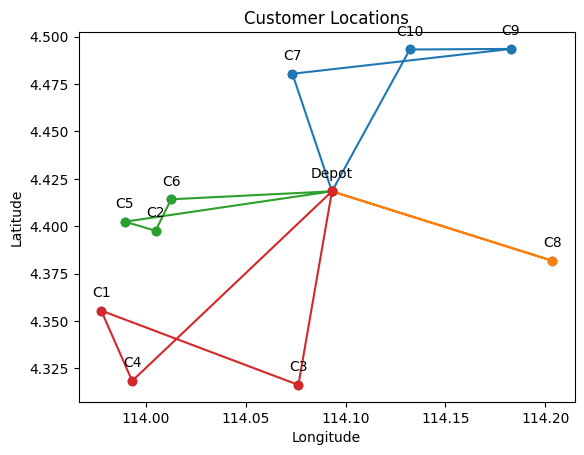

Total Distance = 120.3311 km
Total Cost = RM 144.4

Vehicle 1 (Type A):
Round Trip Distance:24.595 km, Cost: RM 29.51, Demand:24
Depot -> C10 (8.436 km) -> C6 (14.325 km) -> C2 (1.834 km)

Vehicle 2 (Type A):
Round Trip Distance:6.508 km, Cost: RM 7.81, Demand:3
Depot -> C7 (6.508 km)

Vehicle 3 (Type A):
Round Trip Distance:10.483 km, Cost: RM 12.58, Demand:5
Depot -> C5 (10.483 km)

Vehicle 4 (Type A):
Round Trip Distance:78.745 km, Cost: RM 94.49, Demand:25
Depot -> C4 (14.142 km) -> C8 (21.955 km) -> C9 (11.358 km) -> C3 (20.669 km) -> C1 (10.62 km)



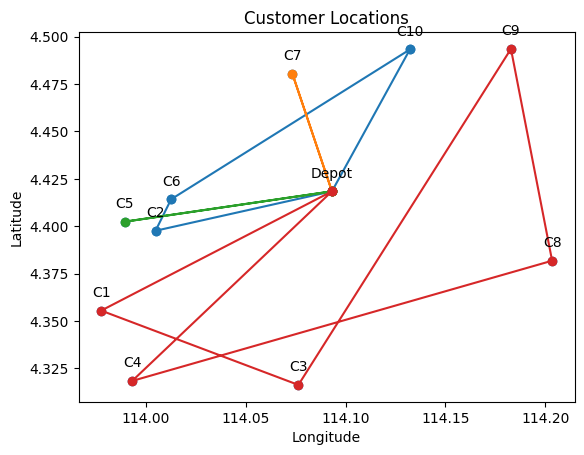

Iteration 1: Best Cost = 143.82577036779625
Iteration 2: Best Cost = 137.63043952615706
Iteration 3: Best Cost = 133.68513074585184
Iteration 4: Best Cost = 130.01933135855754
Iteration 5: Best Cost = 127.58735952414719
Iteration 6: Best Cost = 121.1750023531546
Iteration 7: Best Cost = 110.91151455292898
Iteration 8: Best Cost = 101.32538602038153
Iteration 9: Best Cost = 101.32538602038153
Iteration 10: Best Cost = 101.32538602038153
Iteration 11: Best Cost = 101.32538602038153
Iteration 12: Best Cost = 101.32538602038153
Iteration 13: Best Cost = 101.32538602038153
Iteration 14: Best Cost = 101.32538602038153
Iteration 15: Best Cost = 101.32538602038153
Iteration 16: Best Cost = 101.32538602038153
Iteration 17: Best Cost = 101.32538602038153
Iteration 18: Best Cost = 101.32538602038153
Iteration 19: Best Cost = 101.32538602038153
Iteration 20: Best Cost = 101.32538602038153
Iteration 21: Best Cost = 101.32538602038153
Iteration 22: Best Cost = 101.32538602038153
Iteration 23: Best C

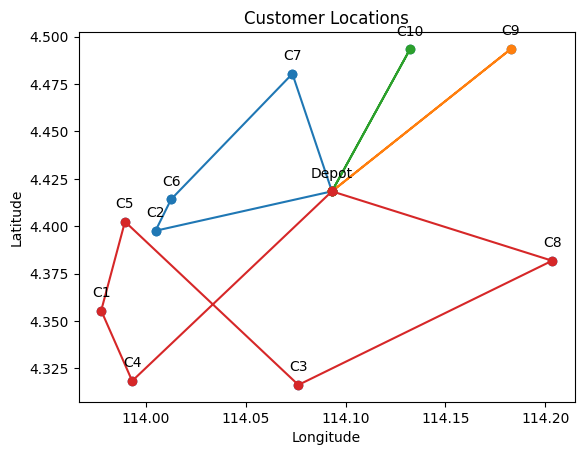

Total Distance = 147.2844 km
Total Cost = RM 176.74

Vehicle 1 (Type A):
Round Trip Distance:30.769 km, Cost: RM 36.92, Demand:14
Depot -> C10 (8.436 km) -> C4 (22.333 km)

Vehicle 2 (Type A):
Round Trip Distance:62.85 km, Cost: RM 75.42, Demand:22
Depot -> C3 (10.347 km) -> C6 (11.68 km) -> C8 (19.343 km) -> C5 (21.479 km)

Vehicle 3 (Type A):
Round Trip Distance:17.255 km, Cost: RM 20.71, Demand:11
Depot -> C7 (6.508 km) -> C2 (10.746 km)

Vehicle 4 (Type A):
Round Trip Distance:36.412 km, Cost: RM 43.69, Demand:10
Depot -> C9 (11.691 km) -> C1 (24.72 km)



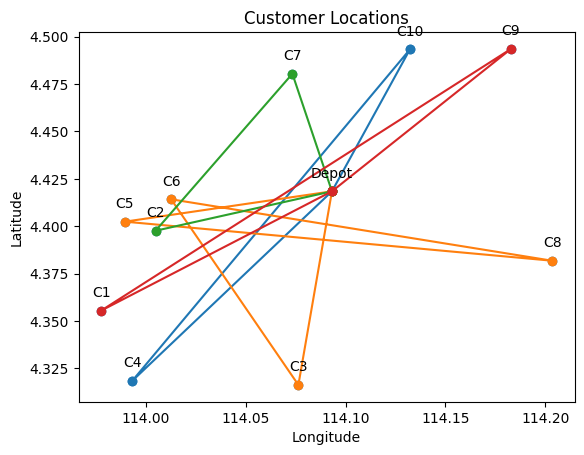

Iteration 1: Best Cost = 174.20128489454805
Iteration 2: Best Cost = 173.6639462995348
Iteration 3: Best Cost = 120.77817827325937
Iteration 4: Best Cost = 115.70834229057874
Iteration 5: Best Cost = 105.29269469704738
Iteration 6: Best Cost = 95.93791788307716
Iteration 7: Best Cost = 95.3941136164093
Iteration 8: Best Cost = 94.39619151435325
Iteration 9: Best Cost = 93.75817910829507
Iteration 10: Best Cost = 92.76935029202389
Iteration 11: Best Cost = 92.76935029202389
Iteration 12: Best Cost = 92.76935029202389
Iteration 13: Best Cost = 92.76935029202389
Iteration 14: Best Cost = 92.76935029202389
Iteration 15: Best Cost = 92.76935029202389
Iteration 16: Best Cost = 92.76935029202389
Iteration 17: Best Cost = 92.76935029202389
Iteration 18: Best Cost = 92.76935029202389
Iteration 19: Best Cost = 92.76935029202389
Iteration 20: Best Cost = 92.76935029202389
Iteration 21: Best Cost = 92.76935029202389
Iteration 22: Best Cost = 92.76935029202389
Iteration 23: Best Cost = 92.769350292

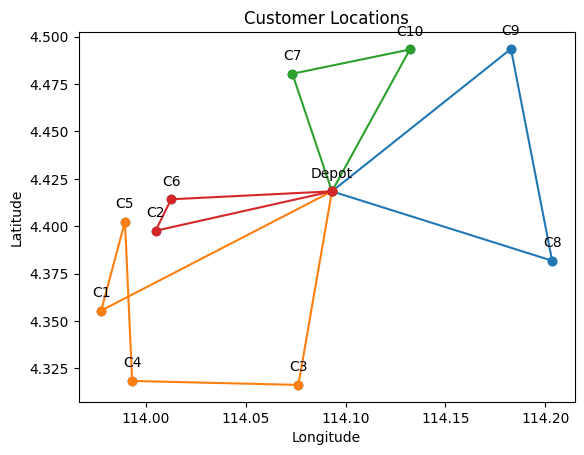

Total Distance = 132.9139 km
Total Cost = RM 174.23

Vehicle 1 (Type A):
Round Trip Distance:25.901 km, Cost: RM 31.08, Demand:9
Depot -> C8 (11.612 km) -> C3 (14.29 km)

Vehicle 2 (Type A):
Round Trip Distance:39.951 km, Cost: RM 47.94, Demand:11
Depot -> C4 (14.142 km) -> C9 (25.809 km)

Vehicle 3 (Type B):
Round Trip Distance:49.105 km, Cost: RM 73.66, Demand:29
Depot -> C2 (9.072 km) -> C1 (5.012 km) -> C10 (20.696 km) -> C6 (14.325 km)

Vehicle 4 (Type A):
Round Trip Distance:17.957 km, Cost: RM 21.55, Demand:8
Depot -> C7 (6.508 km) -> C5 (11.448 km)



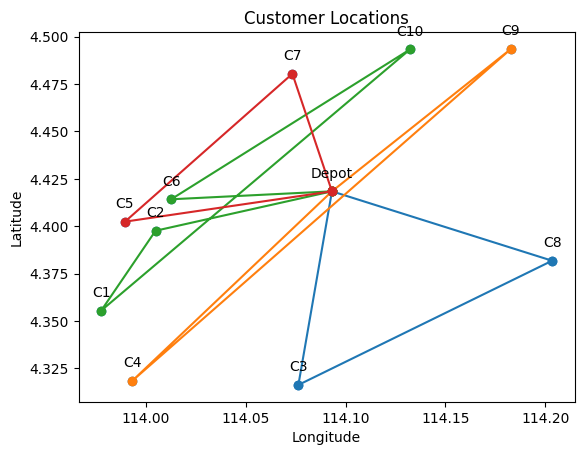

Iteration 1: Best Cost = 126.32873959591463
Iteration 2: Best Cost = 122.12027522165474
Iteration 3: Best Cost = 113.6108713680002
Iteration 4: Best Cost = 109.70435235697138
Iteration 5: Best Cost = 105.18547696863862
Iteration 6: Best Cost = 92.69724113146583
Iteration 7: Best Cost = 91.50869042201606
Iteration 8: Best Cost = 89.99117507166272
Iteration 9: Best Cost = 89.99117507166272
Iteration 10: Best Cost = 89.99117507166272
Iteration 11: Best Cost = 89.99117507166272
Iteration 12: Best Cost = 89.99117507166272
Iteration 13: Best Cost = 89.99117507166272
Iteration 14: Best Cost = 89.99117507166272
Iteration 15: Best Cost = 89.99117507166272
Iteration 16: Best Cost = 89.99117507166272
Iteration 17: Best Cost = 89.99117507166272
Iteration 18: Best Cost = 89.99117507166272
Iteration 19: Best Cost = 89.99117507166272
Iteration 20: Best Cost = 89.99117507166272
Iteration 21: Best Cost = 89.99117507166272
Iteration 22: Best Cost = 89.99117507166272
Iteration 23: Best Cost = 89.99117507

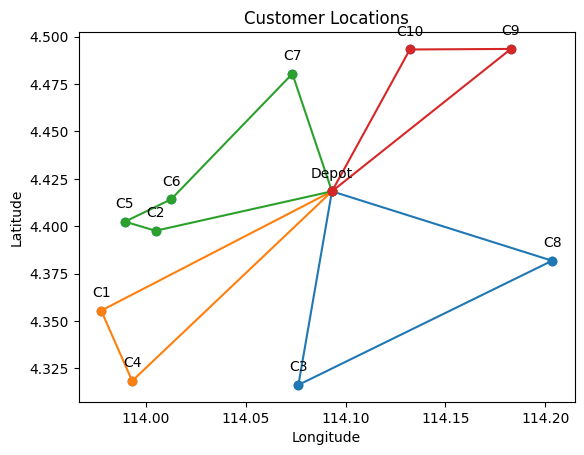

Total Distance = 86.6768 km
Total Cost = RM 104.01

Vehicle 1 (Type A):
Round Trip Distance:24.177 km, Cost: RM 29.01, Demand:16
Depot -> C3 (10.347 km) -> C5 (12.226 km) -> C2 (1.604 km)

Vehicle 2 (Type A):
Round Trip Distance:24.997 km, Cost: RM 30.0, Demand:19
Depot -> C4 (14.142 km) -> C1 (4.021 km) -> C6 (6.834 km)

Vehicle 3 (Type A):
Round Trip Distance:14.453 km, Cost: RM 17.34, Demand:11
Depot -> C10 (8.436 km) -> C7 (6.018 km)

Vehicle 4 (Type A):
Round Trip Distance:23.049 km, Cost: RM 27.66, Demand:11
Depot -> C9 (11.691 km) -> C8 (11.358 km)



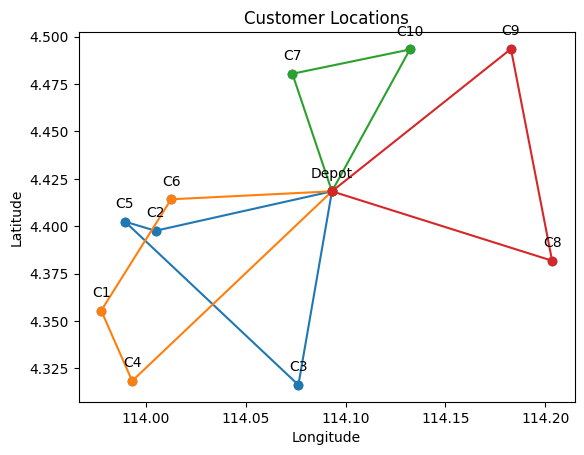

Iteration 1: Best Cost = 102.59330986755364
Iteration 2: Best Cost = 99.22816964917331
Iteration 3: Best Cost = 98.23024754711726
Iteration 4: Best Cost = 96.26756851499457
Iteration 5: Best Cost = 91.8763946228972
Iteration 6: Best Cost = 91.0881872202125
Iteration 7: Best Cost = 89.1856230745781
Iteration 8: Best Cost = 89.1856230745781
Iteration 9: Best Cost = 89.1856230745781
Iteration 10: Best Cost = 89.1856230745781
Iteration 11: Best Cost = 89.1856230745781
Iteration 12: Best Cost = 89.1856230745781
Iteration 13: Best Cost = 89.1856230745781
Iteration 14: Best Cost = 89.1856230745781
Iteration 15: Best Cost = 89.1856230745781
Iteration 16: Best Cost = 89.1856230745781
Iteration 17: Best Cost = 89.1856230745781
Iteration 18: Best Cost = 89.1856230745781
Iteration 19: Best Cost = 89.1856230745781
Iteration 20: Best Cost = 89.1856230745781
Iteration 21: Best Cost = 89.1856230745781
Iteration 22: Best Cost = 89.1856230745781
Iteration 23: Best Cost = 89.1856230745781
Iteration 24: B

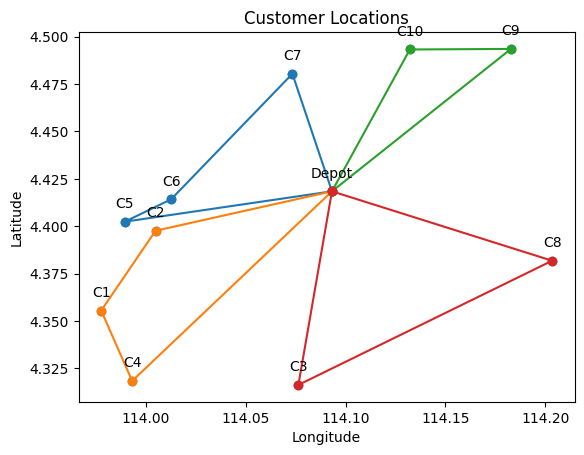

Total Distance = 134.366 km
Total Cost = RM 180.44

Vehicle 1 (Type B):
Round Trip Distance:64.005 km, Cost: RM 96.01, Demand:27
Depot -> C4 (14.142 km) -> C10 (22.333 km) -> C1 (20.696 km) -> C6 (6.834 km)

Vehicle 2 (Type A):
Round Trip Distance:10.483 km, Cost: RM 12.58, Demand:5
Depot -> C5 (10.483 km)

Vehicle 3 (Type A):
Round Trip Distance:17.527 km, Cost: RM 21.03, Demand:8
Depot -> C7 (6.508 km) -> C9 (11.018 km)

Vehicle 4 (Type A):
Round Trip Distance:42.351 km, Cost: RM 50.82, Demand:17
Depot -> C8 (11.612 km) -> C2 (19.913 km) -> C3 (10.827 km)



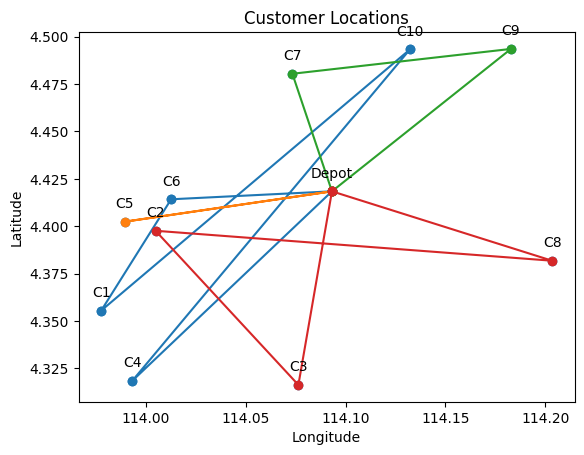

Iteration 1: Best Cost = 154.99088175990204
Iteration 2: Best Cost = 152.43195811488238
Iteration 3: Best Cost = 131.04030674097908
Iteration 4: Best Cost = 125.93740263785676
Iteration 5: Best Cost = 123.03264802485165
Iteration 6: Best Cost = 110.14024686065879
Iteration 7: Best Cost = 102.47503835716721
Iteration 8: Best Cost = 102.06678184840158
Iteration 9: Best Cost = 99.73539142556797
Iteration 10: Best Cost = 92.86763654278059
Iteration 11: Best Cost = 88.33362814693271
Iteration 12: Best Cost = 88.16891776794338
Iteration 13: Best Cost = 88.16891776794338
Iteration 14: Best Cost = 88.16891776794338
Iteration 15: Best Cost = 88.16891776794338
Iteration 16: Best Cost = 88.16891776794338
Iteration 17: Best Cost = 88.16891776794338
Iteration 18: Best Cost = 88.16891776794338
Iteration 19: Best Cost = 88.16891776794338
Iteration 20: Best Cost = 88.16891776794338
Iteration 21: Best Cost = 88.16891776794338
Iteration 22: Best Cost = 88.16891776794338
Iteration 23: Best Cost = 88.1689

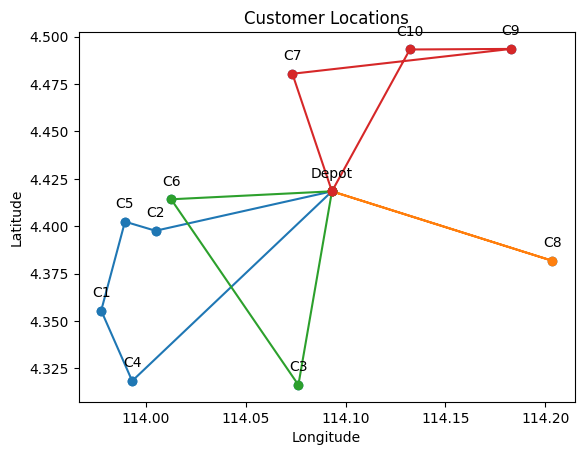

Total Distance = 119.2651 km
Total Cost = RM 156.82

Vehicle 1 (Type A):
Round Trip Distance:13.152 km, Cost: RM 15.78, Demand:5
Depot -> C1 (13.152 km)

Vehicle 2 (Type A):
Round Trip Distance:29.432 km, Cost: RM 35.32, Demand:16
Depot -> C7 (6.508 km) -> C10 (6.018 km) -> C5 (16.905 km)

Vehicle 3 (Type B):
Round Trip Distance:45.665 km, Cost: RM 68.5, Demand:28
Depot -> C4 (14.142 km) -> C6 (9.776 km) -> C2 (1.834 km) -> C8 (19.913 km)

Vehicle 4 (Type A):
Round Trip Distance:31.016 km, Cost: RM 37.22, Demand:8
Depot -> C3 (10.347 km) -> C9 (20.669 km)



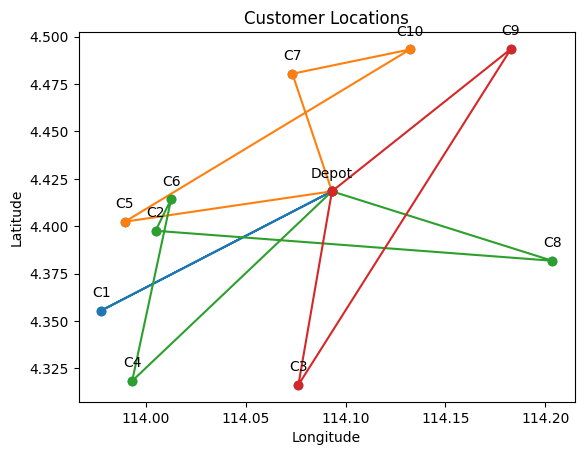

Iteration 1: Best Cost = 149.60859730494795
Iteration 2: Best Cost = 142.0531536171036
Iteration 3: Best Cost = 141.6357443127872
Iteration 4: Best Cost = 139.19474442623613
Iteration 5: Best Cost = 131.70207696288426
Iteration 6: Best Cost = 127.24536598339128
Iteration 7: Best Cost = 123.41650096250422
Iteration 8: Best Cost = 105.96814604301298
Iteration 9: Best Cost = 101.18042985974236
Iteration 10: Best Cost = 90.98380250332508
Iteration 11: Best Cost = 86.09060268534013
Iteration 12: Best Cost = 84.11423406598108
Iteration 13: Best Cost = 81.94756049190197
Iteration 14: Best Cost = 81.94756049190197
Iteration 15: Best Cost = 81.94756049190197
Iteration 16: Best Cost = 81.94756049190197
Iteration 17: Best Cost = 81.94756049190197
Iteration 18: Best Cost = 81.94756049190197
Iteration 19: Best Cost = 81.94756049190197
Iteration 20: Best Cost = 81.94756049190197
Iteration 21: Best Cost = 81.94756049190197
Iteration 22: Best Cost = 81.94756049190197
Iteration 23: Best Cost = 81.94756

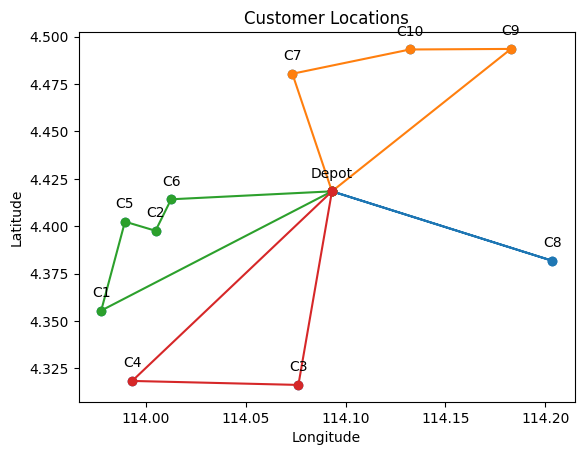

Total Distance = 140.415 km
Total Cost = RM 168.5

Vehicle 1 (Type A):
Round Trip Distance:35.182 km, Cost: RM 42.22, Demand:19
Depot -> C10 (8.436 km) -> C2 (15.92 km) -> C3 (10.827 km)

Vehicle 2 (Type A):
Round Trip Distance:58.82 km, Cost: RM 70.58, Demand:17
Depot -> C4 (14.142 km) -> C8 (21.955 km) -> C1 (22.723 km)

Vehicle 3 (Type A):
Round Trip Distance:31.843 km, Cost: RM 38.21, Demand:10
Depot -> C5 (10.483 km) -> C9 (21.36 km)

Vehicle 4 (Type A):
Round Trip Distance:6.508 km, Cost: RM 7.81, Demand:3
Depot -> C7 (6.508 km)

Vehicle 5 (Type A):
Round Trip Distance:8.061 km, Cost: RM 9.67, Demand:8
Depot -> C6 (8.061 km)



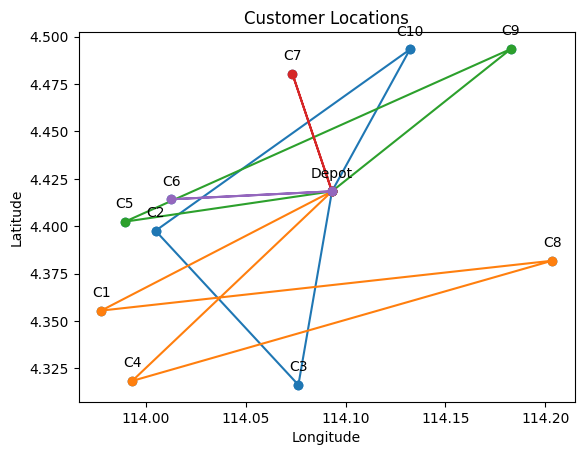

Iteration 1: Best Cost = 150.33476006545834
Iteration 2: Best Cost = 138.45023996649604
Iteration 3: Best Cost = 135.03498314236506
Iteration 4: Best Cost = 135.03498314236504
Iteration 5: Best Cost = 128.2680860011834
Iteration 6: Best Cost = 127.2866726802274
Iteration 7: Best Cost = 116.05612084287351
Iteration 8: Best Cost = 113.62414900846318
Iteration 9: Best Cost = 107.41559001674989
Iteration 10: Best Cost = 106.13323891095244
Iteration 11: Best Cost = 95.4387393852994
Iteration 12: Best Cost = 92.51065411703024
Iteration 13: Best Cost = 91.32210340758046
Iteration 14: Best Cost = 81.85981553243717
Iteration 15: Best Cost = 81.85981553243717
Iteration 16: Best Cost = 81.85981553243717
Iteration 17: Best Cost = 81.85981553243717
Iteration 18: Best Cost = 81.85981553243717
Iteration 19: Best Cost = 81.85981553243717
Iteration 20: Best Cost = 81.85981553243717
Iteration 21: Best Cost = 81.85981553243717
Iteration 22: Best Cost = 81.85981553243717
Iteration 23: Best Cost = 81.85981

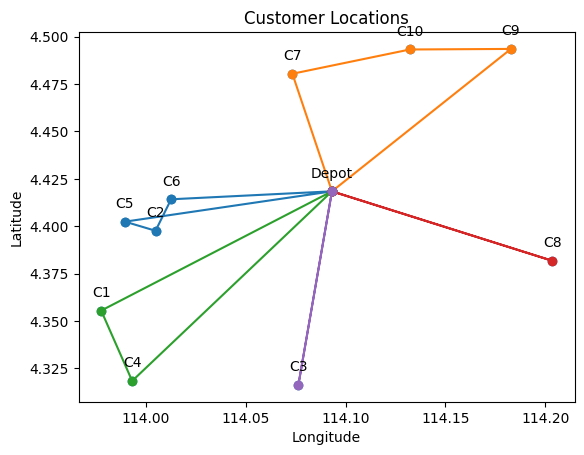

Total Distance = 123.7317 km
Total Cost = RM 148.48

Vehicle 1 (Type A):
Round Trip Distance:9.895 km, Cost: RM 11.87, Demand:16
Depot -> C6 (8.061 km) -> C2 (1.834 km)

Vehicle 2 (Type A):
Round Trip Distance:23.049 km, Cost: RM 27.66, Demand:11
Depot -> C9 (11.691 km) -> C8 (11.358 km)

Vehicle 3 (Type A):
Round Trip Distance:32.219 km, Cost: RM 38.66, Demand:9
Depot -> C4 (14.142 km) -> C7 (18.077 km)

Vehicle 4 (Type A):
Round Trip Distance:58.568 km, Cost: RM 70.28, Demand:21
Depot -> C3 (10.347 km) -> C1 (10.62 km) -> C10 (20.696 km) -> C5 (16.905 km)



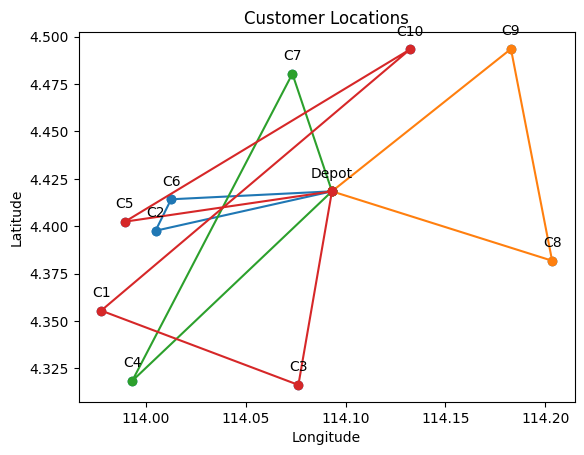

Iteration 1: Best Cost = 120.9487501476309
Iteration 2: Best Cost = 117.99271617654905
Iteration 3: Best Cost = 111.095005310505
Iteration 4: Best Cost = 103.00125278911756
Iteration 5: Best Cost = 102.42799523321722
Iteration 6: Best Cost = 98.897595715661
Iteration 7: Best Cost = 98.897595715661
Iteration 8: Best Cost = 98.897595715661
Iteration 9: Best Cost = 98.897595715661
Iteration 10: Best Cost = 98.897595715661
Iteration 11: Best Cost = 98.897595715661
Iteration 12: Best Cost = 98.897595715661
Iteration 13: Best Cost = 98.897595715661
Iteration 14: Best Cost = 98.897595715661
Iteration 15: Best Cost = 98.897595715661
Iteration 16: Best Cost = 98.897595715661
Iteration 17: Best Cost = 98.897595715661
Iteration 18: Best Cost = 98.897595715661
Iteration 19: Best Cost = 98.897595715661
Iteration 20: Best Cost = 98.897595715661
Iteration 21: Best Cost = 98.897595715661
Iteration 22: Best Cost = 98.897595715661
Iteration 23: Best Cost = 98.897595715661
Iteration 24: Best Cost = 98.89

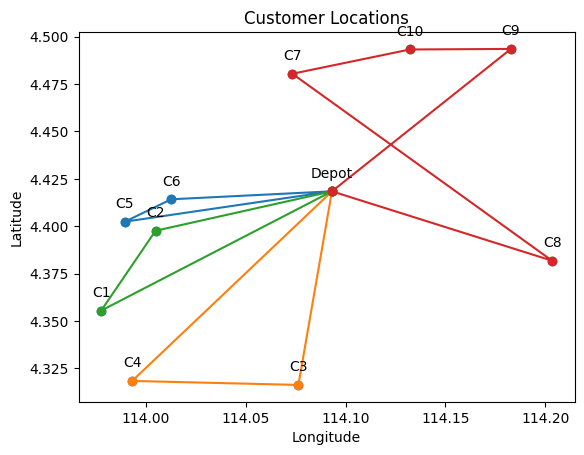

Total Distance = 126.4879 km
Total Cost = RM 151.79

Vehicle 1 (Type A):
Round Trip Distance:22.386 km, Cost: RM 26.86, Demand:16
Depot -> C6 (8.061 km) -> C10 (14.325 km)

Vehicle 2 (Type A):
Round Trip Distance:42.271 km, Cost: RM 50.73, Demand:17
Depot -> C8 (11.612 km) -> C2 (19.913 km) -> C7 (10.746 km)

Vehicle 3 (Type A):
Round Trip Distance:11.691 km, Cost: RM 14.03, Demand:5
Depot -> C9 (11.691 km)

Vehicle 4 (Type A):
Round Trip Distance:14.142 km, Cost: RM 16.97, Demand:6
Depot -> C4 (14.142 km)

Vehicle 5 (Type A):
Round Trip Distance:35.998 km, Cost: RM 43.2, Demand:13
Depot -> C1 (13.152 km) -> C3 (10.62 km) -> C5 (12.226 km)



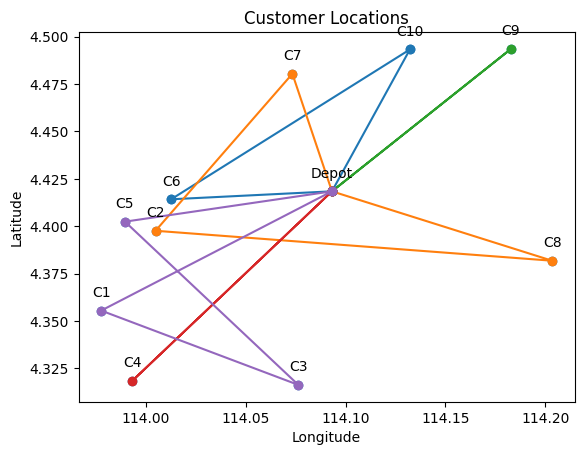

Iteration 1: Best Cost = 145.83838394608128
Iteration 2: Best Cost = 144.0114138251169
Iteration 3: Best Cost = 142.44569345717517
Iteration 4: Best Cost = 130.53633666611503
Iteration 5: Best Cost = 115.59525991995378
Iteration 6: Best Cost = 113.39055883936223
Iteration 7: Best Cost = 111.02430511546405
Iteration 8: Best Cost = 110.04289179450804
Iteration 9: Best Cost = 102.94265688932725
Iteration 10: Best Cost = 95.57438520100462
Iteration 11: Best Cost = 86.93047201309298
Iteration 12: Best Cost = 82.53929812099561
Iteration 13: Best Cost = 81.96604056509527
Iteration 14: Best Cost = 81.96604056509527
Iteration 15: Best Cost = 81.96604056509527
Iteration 16: Best Cost = 81.96604056509527
Iteration 17: Best Cost = 81.96604056509527
Iteration 18: Best Cost = 81.96604056509527
Iteration 19: Best Cost = 81.96604056509527
Iteration 20: Best Cost = 81.96604056509527
Iteration 21: Best Cost = 81.96604056509527
Iteration 22: Best Cost = 81.96604056509527
Iteration 23: Best Cost = 81.9660

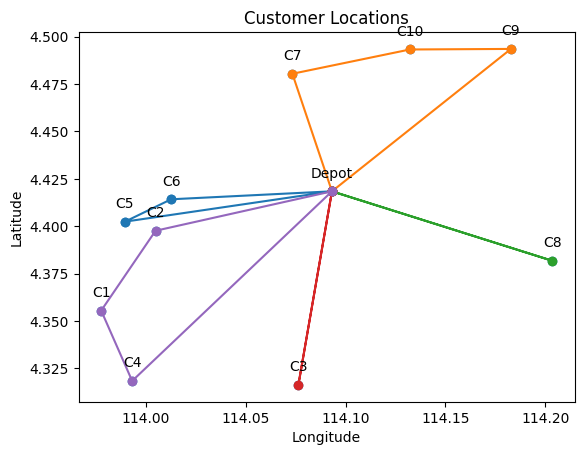

Total Distance = 144.091 km
Total Cost = RM 172.91

Vehicle 1 (Type A):
Round Trip Distance:50.127 km, Cost: RM 60.15, Demand:19
Depot -> C6 (8.061 km) -> C8 (19.343 km) -> C1 (22.723 km)

Vehicle 2 (Type A):
Round Trip Distance:17.957 km, Cost: RM 21.55, Demand:8
Depot -> C7 (6.508 km) -> C5 (11.448 km)

Vehicle 3 (Type A):
Round Trip Distance:39.951 km, Cost: RM 47.94, Demand:11
Depot -> C4 (14.142 km) -> C9 (25.809 km)

Vehicle 4 (Type A):
Round Trip Distance:9.072 km, Cost: RM 10.89, Demand:8
Depot -> C2 (9.072 km)

Vehicle 5 (Type A):
Round Trip Distance:26.985 km, Cost: RM 32.38, Demand:11
Depot -> C10 (8.436 km) -> C3 (18.549 km)



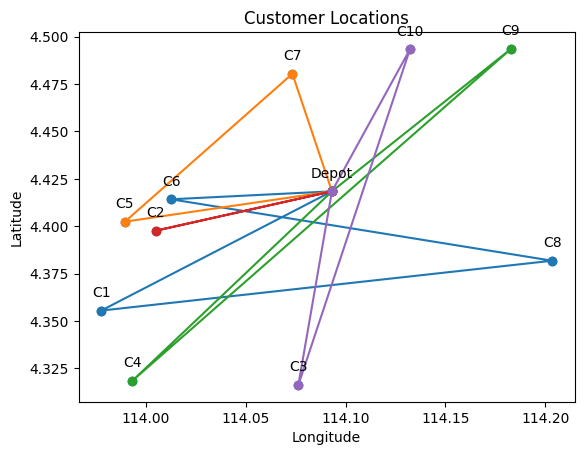

Iteration 1: Best Cost = 135.73917651200597
Iteration 2: Best Cost = 123.92540599777442
Iteration 3: Best Cost = 109.23002677995257
Iteration 4: Best Cost = 104.88126192218144
Iteration 5: Best Cost = 103.2479409439222
Iteration 6: Best Cost = 102.25911212765101
Iteration 7: Best Cost = 101.07056141820124
Iteration 8: Best Cost = 101.07056141820124
Iteration 9: Best Cost = 101.07056141820124
Iteration 10: Best Cost = 101.07056141820124
Iteration 11: Best Cost = 101.07056141820124
Iteration 12: Best Cost = 101.07056141820124
Iteration 13: Best Cost = 101.07056141820124
Iteration 14: Best Cost = 101.07056141820124
Iteration 15: Best Cost = 101.07056141820124
Iteration 16: Best Cost = 101.07056141820124
Iteration 17: Best Cost = 101.07056141820124
Iteration 18: Best Cost = 101.07056141820124
Iteration 19: Best Cost = 101.07056141820124
Iteration 20: Best Cost = 101.07056141820124
Iteration 21: Best Cost = 101.07056141820124
Iteration 22: Best Cost = 101.07056141820124
Iteration 23: Best C

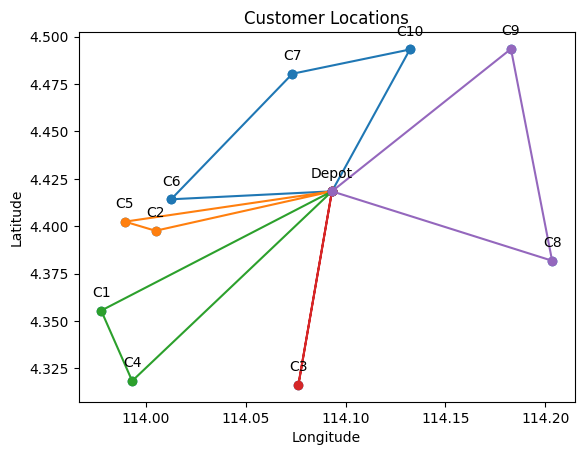

Total Distance = 118.2655 km
Total Cost = RM 141.92

Vehicle 1 (Type A):
Round Trip Distance:13.152 km, Cost: RM 15.78, Demand:5
Depot -> C1 (13.152 km)

Vehicle 2 (Type A):
Round Trip Distance:24.992 km, Cost: RM 29.99, Demand:16
Depot -> C2 (9.072 km) -> C10 (15.92 km)

Vehicle 3 (Type A):
Round Trip Distance:24.637 km, Cost: RM 29.56, Demand:9
Depot -> C3 (10.347 km) -> C8 (14.29 km)

Vehicle 4 (Type A):
Round Trip Distance:43.794 km, Cost: RM 52.55, Demand:22
Depot -> C4 (14.142 km) -> C7 (18.077 km) -> C6 (8.982 km) -> C5 (2.594 km)

Vehicle 5 (Type A):
Round Trip Distance:11.691 km, Cost: RM 14.03, Demand:5
Depot -> C9 (11.691 km)



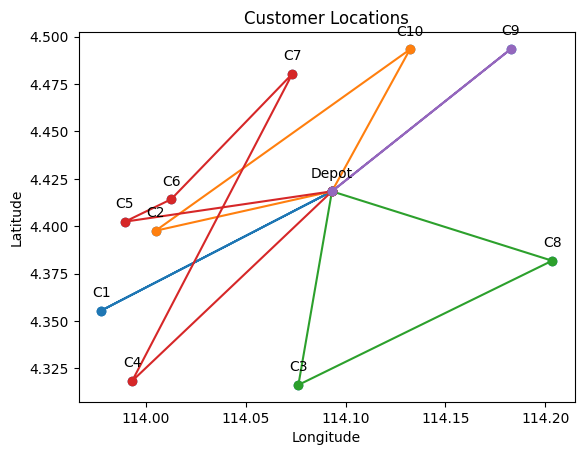

Iteration 1: Best Cost = 133.44860632523378
Iteration 2: Best Cost = 123.25197896881649
Iteration 3: Best Cost = 120.01313703337465
Iteration 4: Best Cost = 119.72928962987939
Iteration 5: Best Cost = 117.28543657125135
Iteration 6: Best Cost = 111.14379607892604
Iteration 7: Best Cost = 107.58711393970461
Iteration 8: Best Cost = 107.5871139397046
Iteration 9: Best Cost = 102.42485944199915
Iteration 10: Best Cost = 102.42485944199913
Iteration 11: Best Cost = 102.42485944199913
Iteration 12: Best Cost = 102.42485944199913
Iteration 13: Best Cost = 102.42485944199913
Iteration 14: Best Cost = 102.42485944199913
Iteration 15: Best Cost = 102.42485944199913
Iteration 16: Best Cost = 102.42485944199913
Iteration 17: Best Cost = 102.42485944199913
Iteration 18: Best Cost = 102.42485944199913
Iteration 19: Best Cost = 102.42485944199913
Iteration 20: Best Cost = 102.42485944199913
Iteration 21: Best Cost = 102.42485944199913
Iteration 22: Best Cost = 102.42485944199913
Iteration 23: Best C

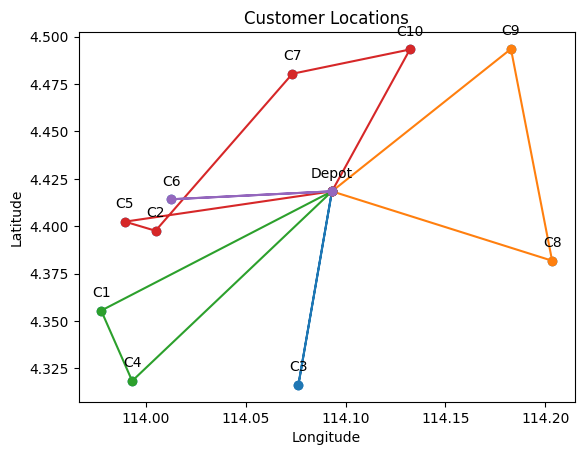

Total Distance = 115.0105 km
Total Cost = RM 138.01

Vehicle 1 (Type A):
Round Trip Distance:33.957 km, Cost: RM 40.75, Demand:16
Depot -> C3 (10.347 km) -> C10 (18.549 km) -> C9 (5.06 km)

Vehicle 2 (Type A):
Round Trip Distance:37.93 km, Cost: RM 45.52, Demand:16
Depot -> C8 (11.612 km) -> C5 (21.479 km) -> C1 (4.839 km)

Vehicle 3 (Type A):
Round Trip Distance:10.906 km, Cost: RM 13.09, Demand:16
Depot -> C2 (9.072 km) -> C6 (1.834 km)

Vehicle 4 (Type A):
Round Trip Distance:32.219 km, Cost: RM 38.66, Demand:9
Depot -> C4 (14.142 km) -> C7 (18.077 km)



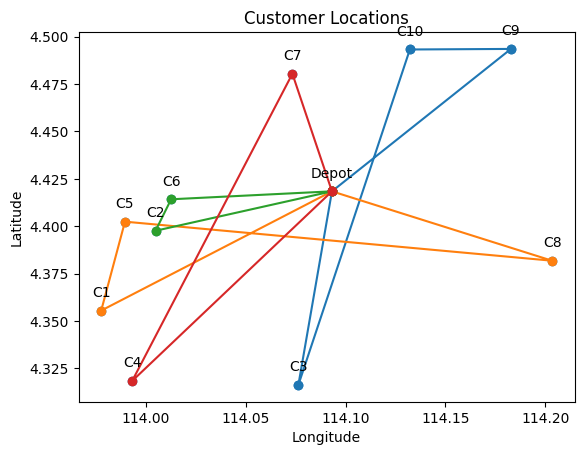

Iteration 1: Best Cost = 129.07742118241364
Iteration 2: Best Cost = 123.27775717060769
Iteration 3: Best Cost = 120.58028203732549
Iteration 4: Best Cost = 107.68788087313264
Iteration 5: Best Cost = 105.35388905654136
Iteration 6: Best Cost = 100.53833053049058
Iteration 7: Best Cost = 99.54040842843453
Iteration 8: Best Cost = 95.89960855388023
Iteration 9: Best Cost = 94.0277168989214
Iteration 10: Best Cost = 89.70784889307592
Iteration 11: Best Cost = 88.77174775986367
Iteration 12: Best Cost = 88.77174775986367
Iteration 13: Best Cost = 88.77174775986367
Iteration 14: Best Cost = 88.77174775986367
Iteration 15: Best Cost = 88.77174775986367
Iteration 16: Best Cost = 88.77174775986367
Iteration 17: Best Cost = 88.77174775986367
Iteration 18: Best Cost = 88.77174775986367
Iteration 19: Best Cost = 88.77174775986367
Iteration 20: Best Cost = 88.77174775986367
Iteration 21: Best Cost = 88.77174775986367
Iteration 22: Best Cost = 88.77174775986367
Iteration 23: Best Cost = 88.7717477

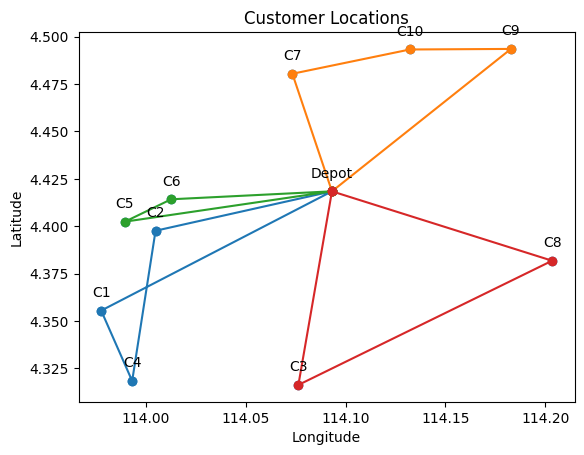

Total Distance = 106.9144 km
Total Cost = RM 128.3

Vehicle 1 (Type A):
Round Trip Distance:21.931 km, Cost: RM 26.32, Demand:8
Depot -> C5 (10.483 km) -> C7 (11.448 km)

Vehicle 2 (Type A):
Round Trip Distance:11.691 km, Cost: RM 14.03, Demand:5
Depot -> C9 (11.691 km)

Vehicle 3 (Type A):
Round Trip Distance:26.224 km, Cost: RM 31.47, Demand:25
Depot -> C6 (8.061 km) -> C2 (1.834 km) -> C4 (8.006 km) -> C3 (8.323 km)

Vehicle 4 (Type A):
Round Trip Distance:47.068 km, Cost: RM 56.48, Demand:19
Depot -> C1 (13.152 km) -> C10 (20.696 km) -> C8 (13.221 km)



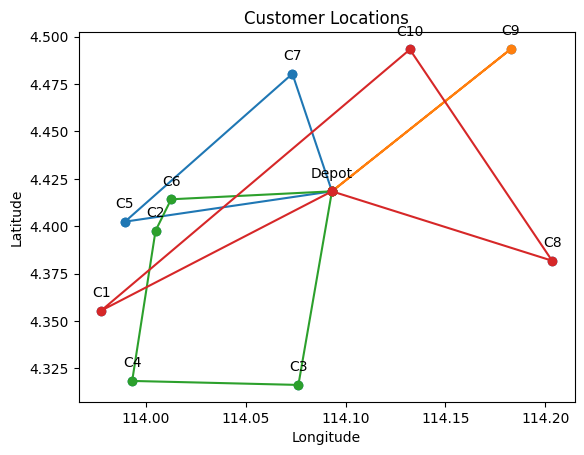

Iteration 1: Best Cost = 123.77034358222632
Iteration 2: Best Cost = 122.91626710497047
Iteration 3: Best Cost = 111.79808586769703
Iteration 4: Best Cost = 107.58342067221162
Iteration 5: Best Cost = 99.21314579373018
Iteration 6: Best Cost = 98.03173293452369
Iteration 7: Best Cost = 97.855719578474
Iteration 8: Best Cost = 97.75364646454761
Iteration 9: Best Cost = 96.06537256744593
Iteration 10: Best Cost = 93.54554380794242
Iteration 11: Best Cost = 92.74908052151015
Iteration 12: Best Cost = 86.52995076024693
Iteration 13: Best Cost = 86.20260472368169
Iteration 14: Best Cost = 86.20260472368169
Iteration 15: Best Cost = 86.20260472368169
Iteration 16: Best Cost = 86.20260472368169
Iteration 17: Best Cost = 86.20260472368169
Iteration 18: Best Cost = 86.20260472368169
Iteration 19: Best Cost = 86.20260472368169
Iteration 20: Best Cost = 86.20260472368169
Iteration 21: Best Cost = 86.20260472368169
Iteration 22: Best Cost = 86.20260472368169
Iteration 23: Best Cost = 86.2026047236

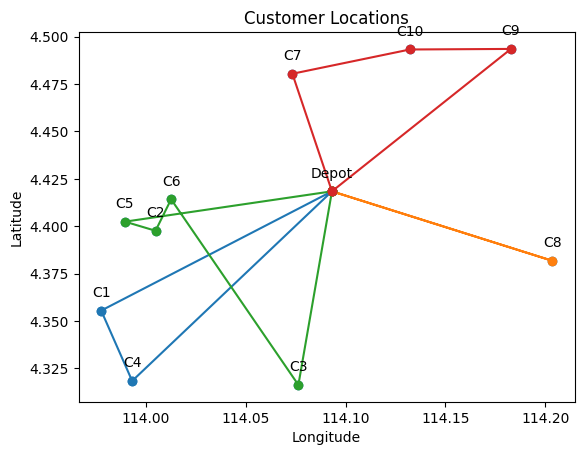

Total Distance = 115.5726 km
Total Cost = RM 138.69

Vehicle 1 (Type A):
Round Trip Distance:8.061 km, Cost: RM 9.67, Demand:8
Depot -> C6 (8.061 km)

Vehicle 2 (Type A):
Round Trip Distance:24.356 km, Cost: RM 29.23, Demand:16
Depot -> C10 (8.436 km) -> C2 (15.92 km)

Vehicle 3 (Type A):
Round Trip Distance:25.901 km, Cost: RM 31.08, Demand:9
Depot -> C8 (11.612 km) -> C3 (14.29 km)

Vehicle 4 (Type A):
Round Trip Distance:50.746 km, Cost: RM 60.9, Demand:21
Depot -> C9 (11.691 km) -> C4 (25.809 km) -> C5 (8.408 km) -> C1 (4.839 km)

Vehicle 5 (Type A):
Round Trip Distance:6.508 km, Cost: RM 7.81, Demand:3
Depot -> C7 (6.508 km)



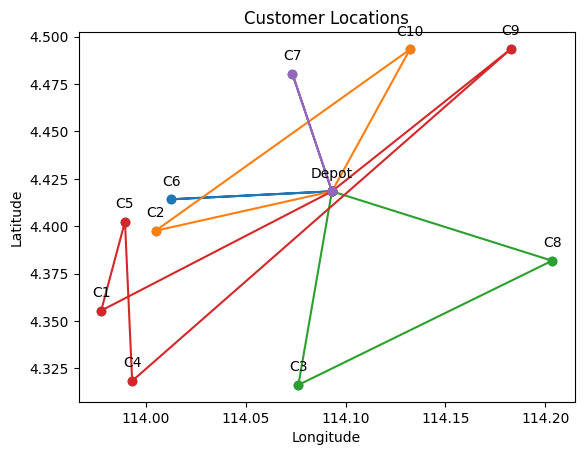

Iteration 1: Best Cost = 133.74772144650166
Iteration 2: Best Cost = 126.5873882894043
Iteration 3: Best Cost = 120.3002886444096
Iteration 4: Best Cost = 116.44114804180336
Iteration 5: Best Cost = 105.08435234511353
Iteration 6: Best Cost = 95.19625189728738
Iteration 7: Best Cost = 89.40291626706879
Iteration 8: Best Cost = 88.2043310009244
Iteration 9: Best Cost = 87.79349048660191
Iteration 10: Best Cost = 85.12931349271811
Iteration 11: Best Cost = 83.01127092978699
Iteration 12: Best Cost = 82.43801337388665
Iteration 13: Best Cost = 82.43801337388665
Iteration 14: Best Cost = 82.43801337388665
Iteration 15: Best Cost = 82.43801337388665
Iteration 16: Best Cost = 82.43801337388665
Iteration 17: Best Cost = 82.43801337388665
Iteration 18: Best Cost = 82.43801337388665
Iteration 19: Best Cost = 82.43801337388665
Iteration 20: Best Cost = 82.43801337388665
Iteration 21: Best Cost = 82.43801337388665
Iteration 22: Best Cost = 82.43801337388665
Iteration 23: Best Cost = 82.4380133738

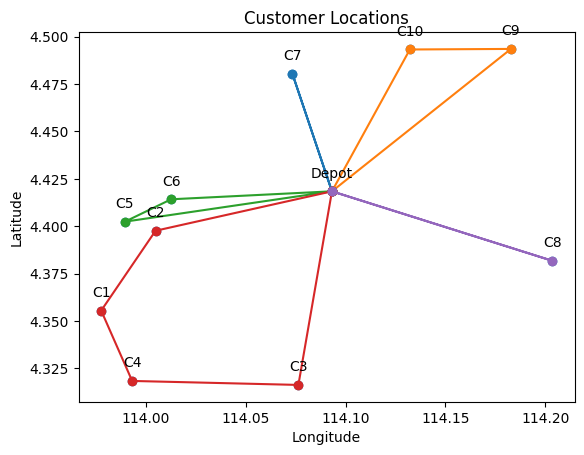

Total Distance = 109.1874 km
Total Cost = RM 131.02

Vehicle 1 (Type A):
Round Trip Distance:14.142 km, Cost: RM 16.97, Demand:6
Depot -> C4 (14.142 km)

Vehicle 2 (Type A):
Round Trip Distance:44.451 km, Cost: RM 53.34, Demand:17
Depot -> C8 (11.612 km) -> C3 (14.29 km) -> C10 (18.549 km)

Vehicle 3 (Type A):
Round Trip Distance:22.709 km, Cost: RM 27.25, Demand:8
Depot -> C9 (11.691 km) -> C7 (11.018 km)

Vehicle 4 (Type A):
Round Trip Distance:9.895 km, Cost: RM 11.87, Demand:16
Depot -> C6 (8.061 km) -> C2 (1.834 km)

Vehicle 5 (Type A):
Round Trip Distance:17.99 km, Cost: RM 21.59, Demand:10
Depot -> C1 (13.152 km) -> C5 (4.839 km)



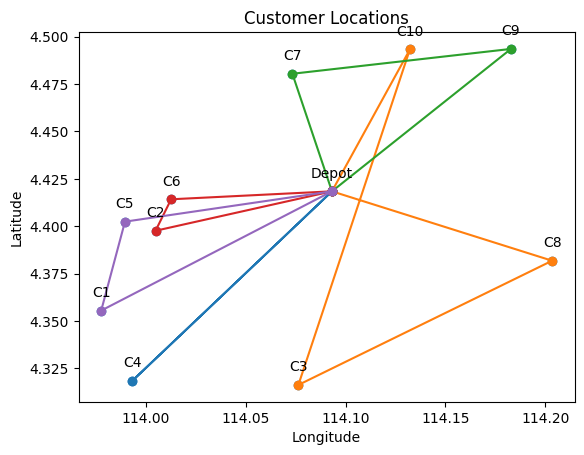

Iteration 1: Best Cost = 128.2469477407548
Iteration 2: Best Cost = 127.24902563869874
Iteration 3: Best Cost = 126.05926888661035
Iteration 4: Best Cost = 124.87077943953675
Iteration 5: Best Cost = 115.15736308769787
Iteration 6: Best Cost = 110.34574931774097
Iteration 7: Best Cost = 109.29240110687618
Iteration 8: Best Cost = 98.66712003971826
Iteration 9: Best Cost = 94.76060102868944
Iteration 10: Best Cost = 94.76060102868944
Iteration 11: Best Cost = 94.76060102868944
Iteration 12: Best Cost = 94.76060102868944
Iteration 13: Best Cost = 94.76060102868944
Iteration 14: Best Cost = 94.76060102868944
Iteration 15: Best Cost = 94.76060102868944
Iteration 16: Best Cost = 94.76060102868944
Iteration 17: Best Cost = 94.76060102868944
Iteration 18: Best Cost = 94.76060102868944
Iteration 19: Best Cost = 94.76060102868944
Iteration 20: Best Cost = 94.76060102868944
Iteration 21: Best Cost = 94.76060102868944
Iteration 22: Best Cost = 94.76060102868944
Iteration 23: Best Cost = 94.760601

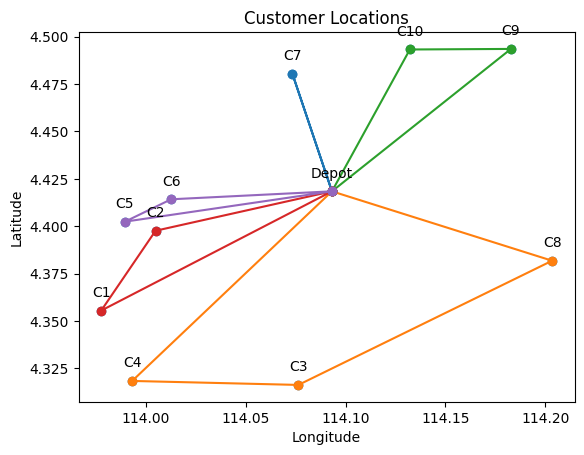

Total Distance = 121.4451 km
Total Cost = RM 145.73

Vehicle 1 (Type A):
Round Trip Distance:27.404 km, Cost: RM 32.89, Demand:14
Depot -> C6 (8.061 km) -> C8 (19.343 km)

Vehicle 2 (Type A):
Round Trip Distance:14.084 km, Cost: RM 16.9, Demand:13
Depot -> C2 (9.072 km) -> C1 (5.012 km)

Vehicle 3 (Type A):
Round Trip Distance:34.022 km, Cost: RM 40.83, Demand:11
Depot -> C3 (10.347 km) -> C5 (12.226 km) -> C7 (11.448 km)

Vehicle 4 (Type A):
Round Trip Distance:37.5 km, Cost: RM 45.0, Demand:11
Depot -> C9 (11.691 km) -> C4 (25.809 km)

Vehicle 5 (Type A):
Round Trip Distance:8.436 km, Cost: RM 10.12, Demand:8
Depot -> C10 (8.436 km)



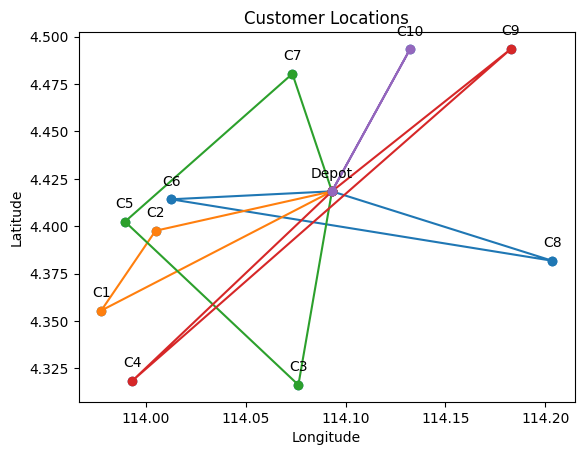

Iteration 1: Best Cost = 127.6836799797378
Iteration 2: Best Cost = 114.87455089966005
Iteration 3: Best Cost = 113.94138251569005
Iteration 4: Best Cost = 106.26288936361199
Iteration 5: Best Cost = 102.05190996284493
Iteration 6: Best Cost = 100.99856175198015
Iteration 7: Best Cost = 97.44357709712084
Iteration 8: Best Cost = 96.62590056022935
Iteration 9: Best Cost = 94.99257958197013
Iteration 10: Best Cost = 92.5606077475598
Iteration 11: Best Cost = 91.98735019165946
Iteration 12: Best Cost = 88.08083118063067
Iteration 13: Best Cost = 88.08083118063067
Iteration 14: Best Cost = 88.08083118063067
Iteration 15: Best Cost = 88.08083118063067
Iteration 16: Best Cost = 88.08083118063067
Iteration 17: Best Cost = 88.08083118063067
Iteration 18: Best Cost = 88.08083118063067
Iteration 19: Best Cost = 88.08083118063067
Iteration 20: Best Cost = 88.08083118063067
Iteration 21: Best Cost = 88.08083118063067
Iteration 22: Best Cost = 88.08083118063067
Iteration 23: Best Cost = 88.08083118

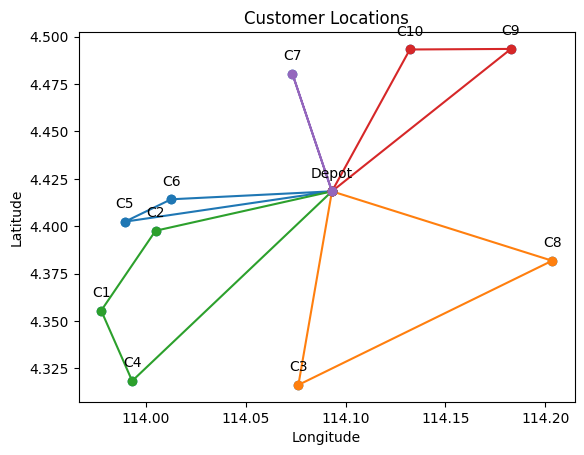

Total Distance = 131.676 km
Total Cost = RM 158.01

Vehicle 1 (Type A):
Round Trip Distance:60.544 km, Cost: RM 72.65, Demand:23
Depot -> C4 (14.142 km) -> C7 (18.077 km) -> C6 (8.982 km) -> C8 (19.343 km)

Vehicle 2 (Type A):
Round Trip Distance:46.701 km, Cost: RM 56.04, Demand:18
Depot -> C10 (8.436 km) -> C5 (16.905 km) -> C9 (21.36 km)

Vehicle 3 (Type A):
Round Trip Distance:10.347 km, Cost: RM 12.42, Demand:3
Depot -> C3 (10.347 km)

Vehicle 4 (Type A):
Round Trip Distance:14.084 km, Cost: RM 16.9, Demand:13
Depot -> C2 (9.072 km) -> C1 (5.012 km)



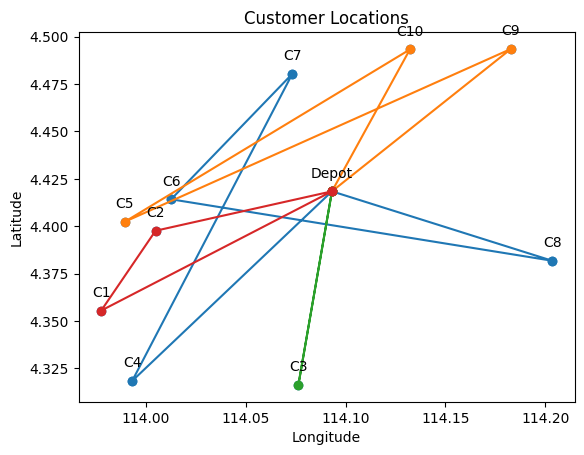

Iteration 1: Best Cost = 156.42291777983934
Iteration 2: Best Cost = 143.73867345500338
Iteration 3: Best Cost = 135.44211160946682
Iteration 4: Best Cost = 112.11860601780683
Iteration 5: Best Cost = 107.85220050823105
Iteration 6: Best Cost = 106.32480866521983
Iteration 7: Best Cost = 104.45291701026099
Iteration 8: Best Cost = 92.42716771929818
Iteration 9: Best Cost = 91.05859593854048
Iteration 10: Best Cost = 91.05859593854048
Iteration 11: Best Cost = 91.05859593854048
Iteration 12: Best Cost = 91.05859593854048
Iteration 13: Best Cost = 91.05859593854048
Iteration 14: Best Cost = 91.05859593854048
Iteration 15: Best Cost = 91.05859593854048
Iteration 16: Best Cost = 91.05859593854048
Iteration 17: Best Cost = 91.05859593854048
Iteration 18: Best Cost = 91.05859593854048
Iteration 19: Best Cost = 91.05859593854048
Iteration 20: Best Cost = 91.05859593854048
Iteration 21: Best Cost = 91.05859593854048
Iteration 22: Best Cost = 91.05859593854048
Iteration 23: Best Cost = 91.05859

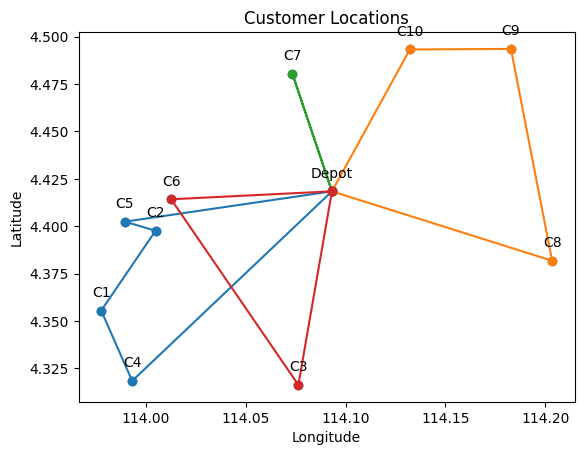

Total Distance = 140.2089 km
Total Cost = RM 168.25

Vehicle 1 (Type A):
Round Trip Distance:17.255 km, Cost: RM 20.71, Demand:11
Depot -> C7 (6.508 km) -> C2 (10.746 km)

Vehicle 2 (Type A):
Round Trip Distance:39.951 km, Cost: RM 47.94, Demand:11
Depot -> C4 (14.142 km) -> C9 (25.809 km)

Vehicle 3 (Type A):
Round Trip Distance:19.741 km, Cost: RM 23.69, Demand:11
Depot -> C6 (8.061 km) -> C3 (11.68 km)

Vehicle 4 (Type A):
Round Trip Distance:35.874 km, Cost: RM 43.05, Demand:11
Depot -> C1 (13.152 km) -> C8 (22.723 km)

Vehicle 5 (Type A):
Round Trip Distance:27.388 km, Cost: RM 32.87, Demand:13
Depot -> C5 (10.483 km) -> C10 (16.905 km)



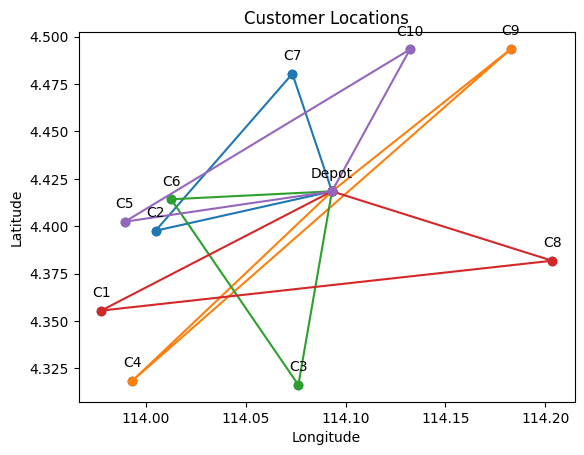

Iteration 1: Best Cost = 165.809720118178
Iteration 2: Best Cost = 162.39004324595348
Iteration 3: Best Cost = 157.62347679605605
Iteration 4: Best Cost = 157.60877271471048
Iteration 5: Best Cost = 133.5722779246221
Iteration 6: Best Cost = 131.7363965470581
Iteration 7: Best Cost = 127.35058130308376
Iteration 8: Best Cost = 99.90834113490398
Iteration 9: Best Cost = 99.33508357900364
Iteration 10: Best Cost = 99.24003824614853
Iteration 11: Best Cost = 94.68622869647525
Iteration 12: Best Cost = 94.68622869647525
Iteration 13: Best Cost = 94.68622869647525
Iteration 14: Best Cost = 94.68622869647525
Iteration 15: Best Cost = 94.68622869647525
Iteration 16: Best Cost = 94.68622869647525
Iteration 17: Best Cost = 94.68622869647525
Iteration 18: Best Cost = 94.68622869647525
Iteration 19: Best Cost = 94.68622869647525
Iteration 20: Best Cost = 94.68622869647525
Iteration 21: Best Cost = 94.68622869647525
Iteration 22: Best Cost = 94.68622869647525
Iteration 23: Best Cost = 94.686228696

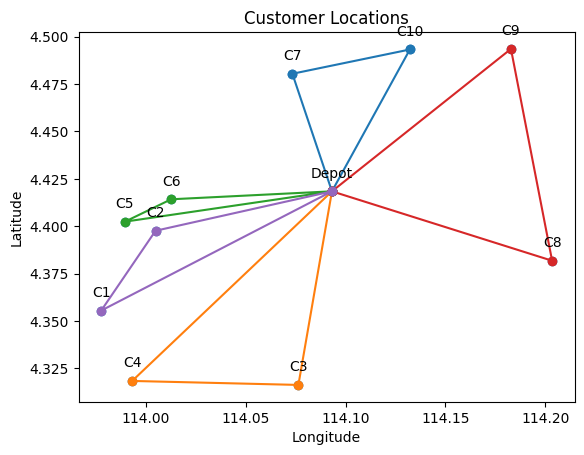

Total Distance = 114.25 km
Total Cost = RM 137.1

Vehicle 1 (Type A):
Round Trip Distance:13.496 km, Cost: RM 16.19, Demand:13
Depot -> C10 (8.436 km) -> C9 (5.06 km)

Vehicle 2 (Type A):
Round Trip Distance:79.501 km, Cost: RM 95.4, Demand:25
Depot -> C1 (13.152 km) -> C5 (4.839 km) -> C8 (21.479 km) -> C4 (21.955 km) -> C7 (18.077 km)

Vehicle 3 (Type A):
Round Trip Distance:10.906 km, Cost: RM 13.09, Demand:16
Depot -> C2 (9.072 km) -> C6 (1.834 km)

Vehicle 4 (Type A):
Round Trip Distance:10.347 km, Cost: RM 12.42, Demand:3
Depot -> C3 (10.347 km)



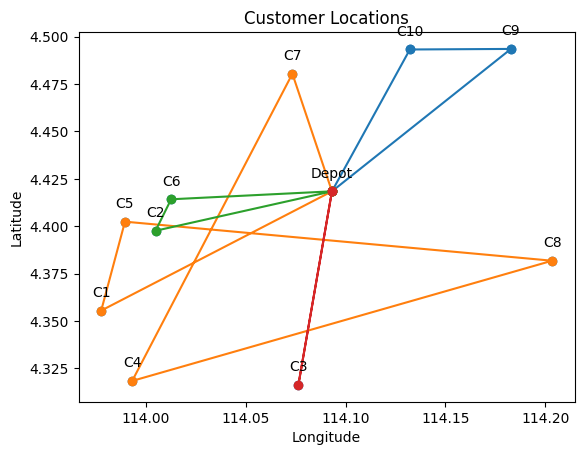

Iteration 1: Best Cost = 120.7887697577611
Iteration 2: Best Cost = 110.2214781855644
Iteration 3: Best Cost = 109.37944818482914
Iteration 4: Best Cost = 108.90032698198269
Iteration 5: Best Cost = 102.60092017132519
Iteration 6: Best Cost = 97.17902068979444
Iteration 7: Best Cost = 85.38275737062538
Iteration 8: Best Cost = 84.54072736989013
Iteration 9: Best Cost = 84.44744731141246
Iteration 10: Best Cost = 84.16988542178498
Iteration 11: Best Cost = 84.16988542178498
Iteration 12: Best Cost = 84.16988542178498
Iteration 13: Best Cost = 84.16988542178498
Iteration 14: Best Cost = 84.16988542178498
Iteration 15: Best Cost = 84.16988542178498
Iteration 16: Best Cost = 84.16988542178498
Iteration 17: Best Cost = 84.16988542178498
Iteration 18: Best Cost = 84.16988542178498
Iteration 19: Best Cost = 84.16988542178498
Iteration 20: Best Cost = 84.16988542178498
Iteration 21: Best Cost = 84.16988542178498
Iteration 22: Best Cost = 84.16988542178498
Iteration 23: Best Cost = 84.169885421

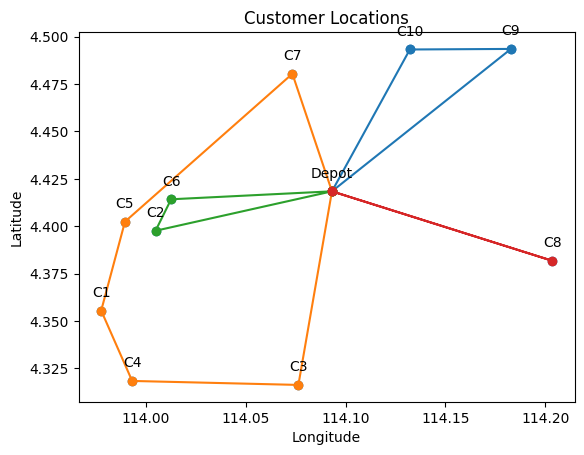

Total Distance = 123.8535 km
Total Cost = RM 148.62

Vehicle 1 (Type A):
Round Trip Distance:22.386 km, Cost: RM 26.86, Demand:16
Depot -> C6 (8.061 km) -> C10 (14.325 km)

Vehicle 2 (Type A):
Round Trip Distance:41.754 km, Cost: RM 50.1, Demand:20
Depot -> C7 (6.508 km) -> C3 (16.413 km) -> C2 (10.827 km) -> C4 (8.006 km)

Vehicle 3 (Type A):
Round Trip Distance:49.23 km, Cost: RM 59.08, Demand:16
Depot -> C1 (13.152 km) -> C9 (24.72 km) -> C8 (11.358 km)

Vehicle 4 (Type A):
Round Trip Distance:10.483 km, Cost: RM 12.58, Demand:5
Depot -> C5 (10.483 km)



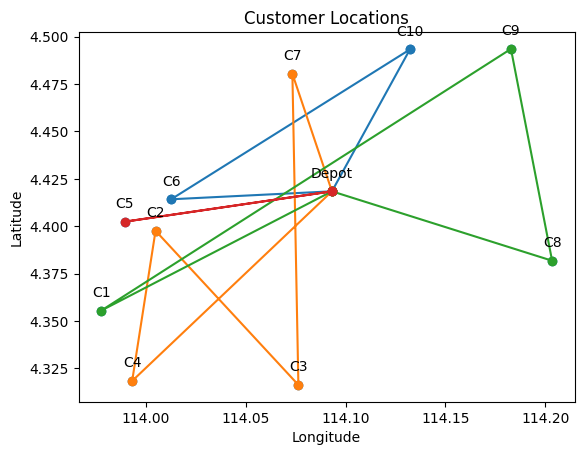

Iteration 1: Best Cost = 138.36067536550377
Iteration 2: Best Cost = 138.12295205748092
Iteration 3: Best Cost = 135.57517459516467
Iteration 4: Best Cost = 129.90017006472485
Iteration 5: Best Cost = 118.7819888274514
Iteration 6: Best Cost = 106.29375299027862
Iteration 7: Best Cost = 105.86408401535279
Iteration 8: Best Cost = 104.22488489166838
Iteration 9: Best Cost = 103.28878375845613
Iteration 10: Best Cost = 103.06745821466266
Iteration 11: Best Cost = 90.51005821804483
Iteration 12: Best Cost = 87.60380825242902
Iteration 13: Best Cost = 83.69728924140023
Iteration 14: Best Cost = 83.69728924140023
Iteration 15: Best Cost = 83.69728924140023
Iteration 16: Best Cost = 83.69728924140023
Iteration 17: Best Cost = 83.69728924140023
Iteration 18: Best Cost = 83.69728924140023
Iteration 19: Best Cost = 83.69728924140023
Iteration 20: Best Cost = 83.69728924140023
Iteration 21: Best Cost = 83.69728924140023
Iteration 22: Best Cost = 83.69728924140023
Iteration 23: Best Cost = 83.697

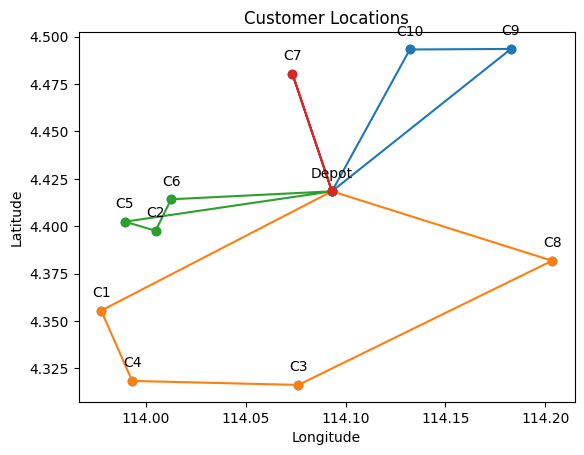

Total Distance = 124.5356 km
Total Cost = RM 149.44

Vehicle 1 (Type A):
Round Trip Distance:22.55 km, Cost: RM 27.06, Demand:11
Depot -> C4 (14.142 km) -> C5 (8.408 km)

Vehicle 2 (Type A):
Round Trip Distance:45.547 km, Cost: RM 54.66, Demand:14
Depot -> C7 (6.508 km) -> C8 (16.316 km) -> C1 (22.723 km)

Vehicle 3 (Type A):
Round Trip Distance:8.436 km, Cost: RM 10.12, Demand:8
Depot -> C10 (8.436 km)

Vehicle 4 (Type A):
Round Trip Distance:21.174 km, Cost: RM 25.41, Demand:11
Depot -> C3 (10.347 km) -> C2 (10.827 km)

Vehicle 5 (Type A):
Round Trip Distance:26.829 km, Cost: RM 32.19, Demand:13
Depot -> C6 (8.061 km) -> C9 (18.768 km)



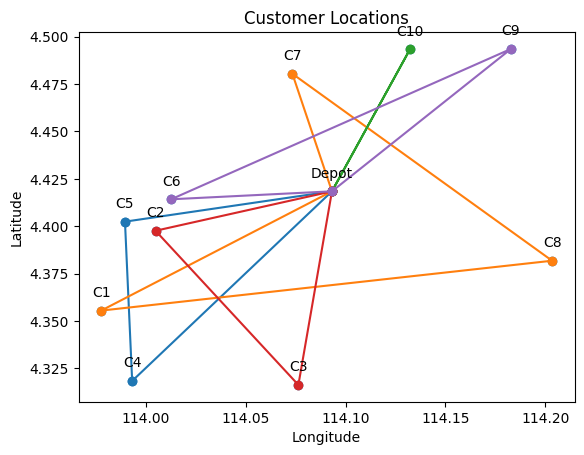

Iteration 1: Best Cost = 140.93318810268937
Iteration 2: Best Cost = 134.00756286757513
Iteration 3: Best Cost = 125.6615165004599
Iteration 4: Best Cost = 117.8999116319228
Iteration 5: Best Cost = 110.34197799824827
Iteration 6: Best Cost = 105.25625098418942
Iteration 7: Best Cost = 101.91915725194823
Iteration 8: Best Cost = 100.98720118427804
Iteration 9: Best Cost = 99.03439757084863
Iteration 10: Best Cost = 99.03232284943519
Iteration 11: Best Cost = 98.37974285074645
Iteration 12: Best Cost = 96.26170028781533
Iteration 13: Best Cost = 95.68844273191499
Iteration 14: Best Cost = 91.13463318224171
Iteration 15: Best Cost = 91.13463318224171
Iteration 16: Best Cost = 91.13463318224171
Iteration 17: Best Cost = 91.13463318224171
Iteration 18: Best Cost = 91.13463318224171
Iteration 19: Best Cost = 91.13463318224171
Iteration 20: Best Cost = 91.13463318224171
Iteration 21: Best Cost = 91.13463318224171
Iteration 22: Best Cost = 91.13463318224171
Iteration 23: Best Cost = 91.134633

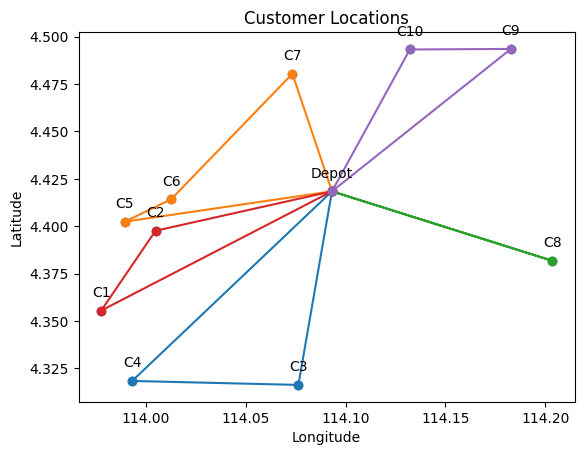

Total Distance = 113.4406 km
Total Cost = RM 136.13

Vehicle 1 (Type A):
Round Trip Distance:8.061 km, Cost: RM 9.67, Demand:8
Depot -> C6 (8.061 km)

Vehicle 2 (Type A):
Round Trip Distance:54.435 km, Cost: RM 65.32, Demand:17
Depot -> C3 (10.347 km) -> C7 (16.413 km) -> C8 (16.316 km) -> C9 (11.358 km)

Vehicle 3 (Type A):
Round Trip Distance:38.859 km, Cost: RM 46.63, Demand:19
Depot -> C4 (14.142 km) -> C1 (4.021 km) -> C10 (20.696 km)

Vehicle 4 (Type A):
Round Trip Distance:12.086 km, Cost: RM 14.5, Demand:13
Depot -> C5 (10.483 km) -> C2 (1.604 km)



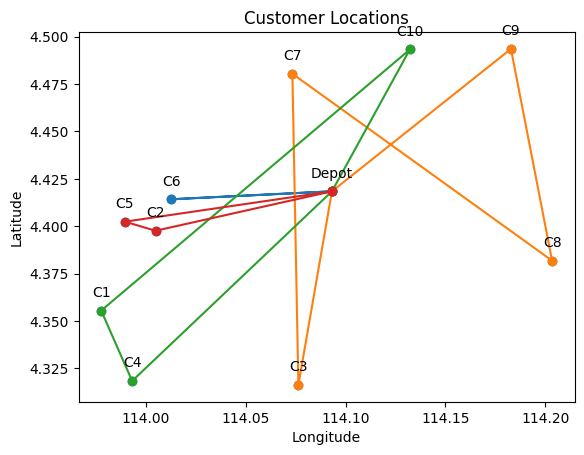

Iteration 1: Best Cost = 135.67079803512527
Iteration 2: Best Cost = 121.24291239598554
Iteration 3: Best Cost = 118.64490618648102
Iteration 4: Best Cost = 116.35558406557492
Iteration 5: Best Cost = 115.30223585471013
Iteration 6: Best Cost = 112.55795583555475
Iteration 7: Best Cost = 110.44044184313599
Iteration 8: Best Cost = 98.78762959104645
Iteration 9: Best Cost = 94.39645569894907
Iteration 10: Best Cost = 93.82319814304873
Iteration 11: Best Cost = 93.82319814304873
Iteration 12: Best Cost = 93.82319814304873
Iteration 13: Best Cost = 93.82319814304873
Iteration 14: Best Cost = 93.82319814304873
Iteration 15: Best Cost = 93.82319814304873
Iteration 16: Best Cost = 93.82319814304873
Iteration 17: Best Cost = 93.82319814304873
Iteration 18: Best Cost = 93.82319814304873
Iteration 19: Best Cost = 93.82319814304873
Iteration 20: Best Cost = 93.82319814304873
Iteration 21: Best Cost = 93.82319814304873
Iteration 22: Best Cost = 93.82319814304873
Iteration 23: Best Cost = 93.82319

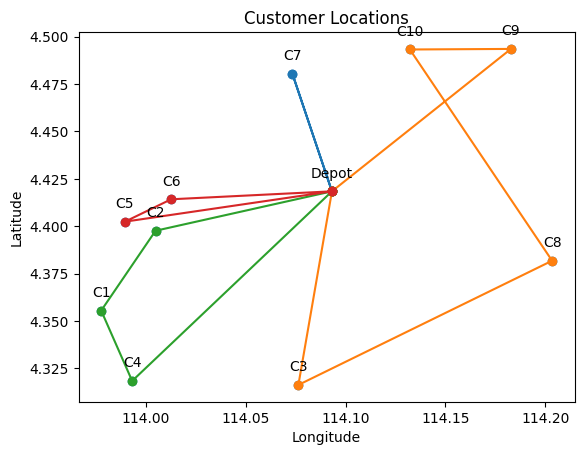

Total Distance = 119.6368 km
Total Cost = RM 158.81

Vehicle 1 (Type A):
Round Trip Distance:45.518 km, Cost: RM 54.62, Demand:20
Depot -> C3 (10.347 km) -> C7 (16.413 km) -> C6 (8.982 km) -> C4 (9.776 km)

Vehicle 2 (Type B):
Round Trip Distance:50.816 km, Cost: RM 76.22, Demand:26
Depot -> C1 (13.152 km) -> C5 (4.839 km) -> C10 (16.905 km) -> C2 (15.92 km)

Vehicle 3 (Type A):
Round Trip Distance:11.612 km, Cost: RM 13.93, Demand:6
Depot -> C8 (11.612 km)

Vehicle 4 (Type A):
Round Trip Distance:11.691 km, Cost: RM 14.03, Demand:5
Depot -> C9 (11.691 km)



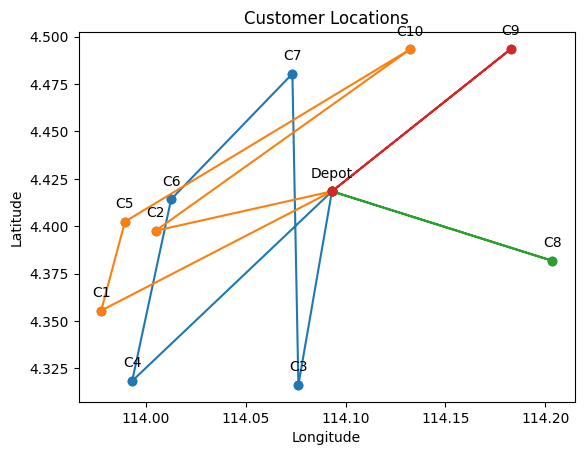

Iteration 1: Best Cost = 127.38897805068929
Iteration 2: Best Cost = 126.44359717900969
Iteration 3: Best Cost = 113.96955542298439
Iteration 4: Best Cost = 104.32202464629707
Iteration 5: Best Cost = 103.22121313409546
Iteration 6: Best Cost = 102.90595292447328
Iteration 7: Best Cost = 102.84413195562949
Iteration 8: Best Cost = 97.22403887217116
Iteration 9: Best Cost = 97.22403887217116
Iteration 10: Best Cost = 97.22403887217116
Iteration 11: Best Cost = 97.22403887217116
Iteration 12: Best Cost = 97.22403887217116
Iteration 13: Best Cost = 97.22403887217116
Iteration 14: Best Cost = 97.22403887217116
Iteration 15: Best Cost = 97.22403887217116
Iteration 16: Best Cost = 97.22403887217116
Iteration 17: Best Cost = 97.22403887217116
Iteration 18: Best Cost = 97.22403887217116
Iteration 19: Best Cost = 97.22403887217116
Iteration 20: Best Cost = 97.22403887217116
Iteration 21: Best Cost = 97.22403887217116
Iteration 22: Best Cost = 97.22403887217116
Iteration 23: Best Cost = 97.22403

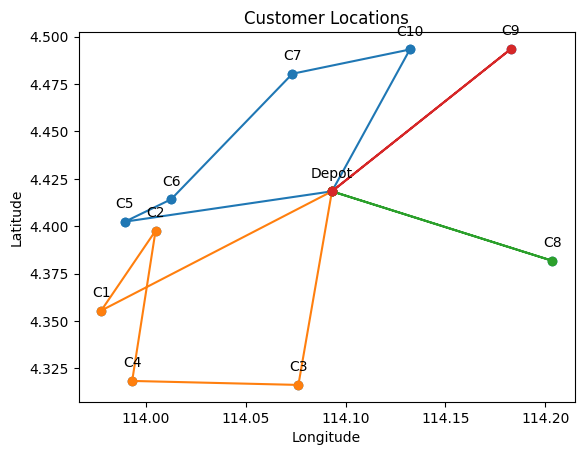

Total Distance = 120.196 km
Total Cost = RM 144.24

Vehicle 1 (Type A):
Round Trip Distance:36.746 km, Cost: RM 44.1, Demand:12
Depot -> C3 (10.347 km) -> C4 (8.323 km) -> C7 (18.077 km)

Vehicle 2 (Type A):
Round Trip Distance:10.483 km, Cost: RM 12.58, Demand:5
Depot -> C5 (10.483 km)

Vehicle 3 (Type A):
Round Trip Distance:38.187 km, Cost: RM 45.82, Demand:19
Depot -> C6 (8.061 km) -> C9 (18.768 km) -> C8 (11.358 km)

Vehicle 4 (Type A):
Round Trip Distance:34.78 km, Cost: RM 41.74, Demand:21
Depot -> C2 (9.072 km) -> C1 (5.012 km) -> C10 (20.696 km)



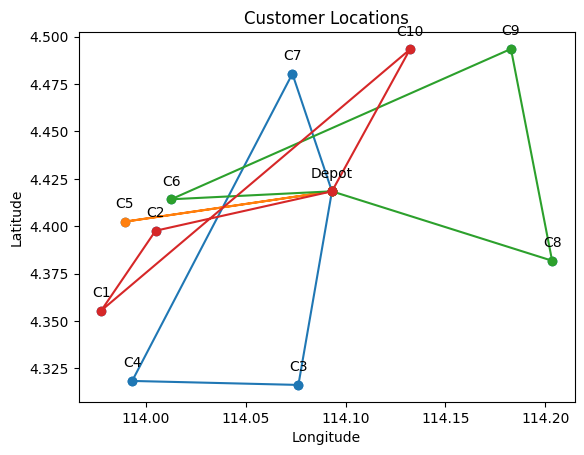

Iteration 1: Best Cost = 139.10952713354868
Iteration 2: Best Cost = 135.37863302078122
Iteration 3: Best Cost = 132.43551715825535
Iteration 4: Best Cost = 122.84387964032882
Iteration 5: Best Cost = 102.90033930217616
Iteration 6: Best Cost = 100.54435847489286
Iteration 7: Best Cost = 100.26764605756196
Iteration 8: Best Cost = 87.71019176189405
Iteration 9: Best Cost = 85.19036300239054
Iteration 10: Best Cost = 78.97123324112732
Iteration 11: Best Cost = 76.06498327551151
Iteration 12: Best Cost = 76.06498327551151
Iteration 13: Best Cost = 76.06498327551151
Iteration 14: Best Cost = 76.06498327551151
Iteration 15: Best Cost = 76.06498327551151
Iteration 16: Best Cost = 76.06498327551151
Iteration 17: Best Cost = 76.06498327551151
Iteration 18: Best Cost = 76.06498327551151
Iteration 19: Best Cost = 76.06498327551151
Iteration 20: Best Cost = 76.06498327551151
Iteration 21: Best Cost = 76.06498327551151
Iteration 22: Best Cost = 76.06498327551151
Iteration 23: Best Cost = 76.06498

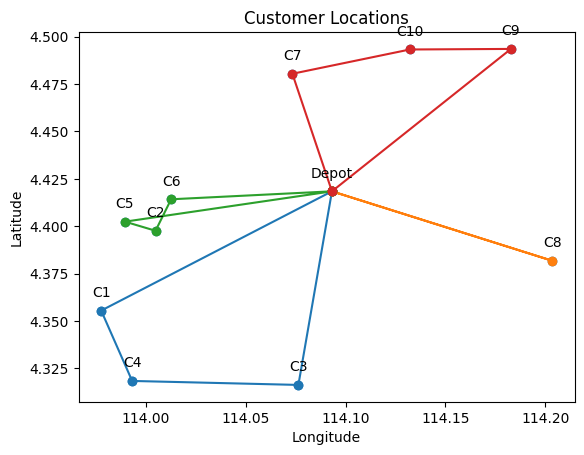

Total Distance = 125.9862 km
Total Cost = RM 168.38

Vehicle 1 (Type A):
Round Trip Distance:11.612 km, Cost: RM 13.93, Demand:6
Depot -> C8 (11.612 km)

Vehicle 2 (Type A):
Round Trip Distance:9.072 km, Cost: RM 10.89, Demand:8
Depot -> C2 (9.072 km)

Vehicle 3 (Type A):
Round Trip Distance:10.483 km, Cost: RM 12.58, Demand:5
Depot -> C5 (10.483 km)

Vehicle 4 (Type A):
Round Trip Distance:37.5 km, Cost: RM 45.0, Demand:11
Depot -> C9 (11.691 km) -> C4 (25.809 km)

Vehicle 5 (Type B):
Round Trip Distance:57.32 km, Cost: RM 85.98, Demand:27
Depot -> C1 (13.152 km) -> C3 (10.62 km) -> C10 (18.549 km) -> C7 (6.018 km) -> C6 (8.982 km)



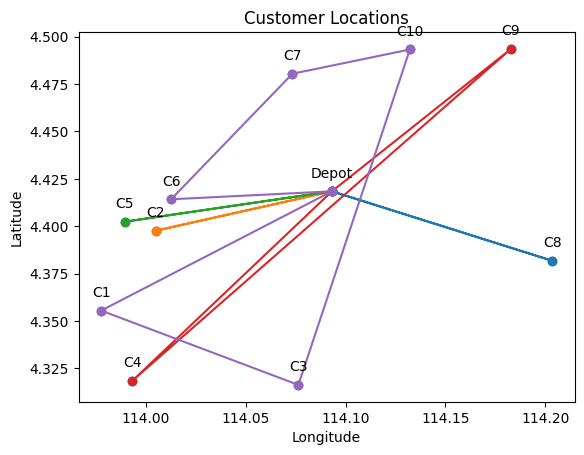

Iteration 1: Best Cost = 157.9888572257266
Iteration 2: Best Cost = 148.2731816496849
Iteration 3: Best Cost = 120.3129827767271
Iteration 4: Best Cost = 115.38509255805887
Iteration 5: Best Cost = 100.98216129450644
Iteration 6: Best Cost = 96.71309026434272
Iteration 7: Best Cost = 95.21829929210853
Iteration 8: Best Cost = 91.31178028107972
Iteration 9: Best Cost = 91.31178028107972
Iteration 10: Best Cost = 91.31178028107972
Iteration 11: Best Cost = 91.31178028107972
Iteration 12: Best Cost = 91.31178028107972
Iteration 13: Best Cost = 91.31178028107972
Iteration 14: Best Cost = 91.31178028107972
Iteration 15: Best Cost = 91.31178028107972
Iteration 16: Best Cost = 91.31178028107972
Iteration 17: Best Cost = 91.31178028107972
Iteration 18: Best Cost = 91.31178028107972
Iteration 19: Best Cost = 91.31178028107972
Iteration 20: Best Cost = 91.31178028107972
Iteration 21: Best Cost = 91.31178028107972
Iteration 22: Best Cost = 91.31178028107972
Iteration 23: Best Cost = 91.3117802810

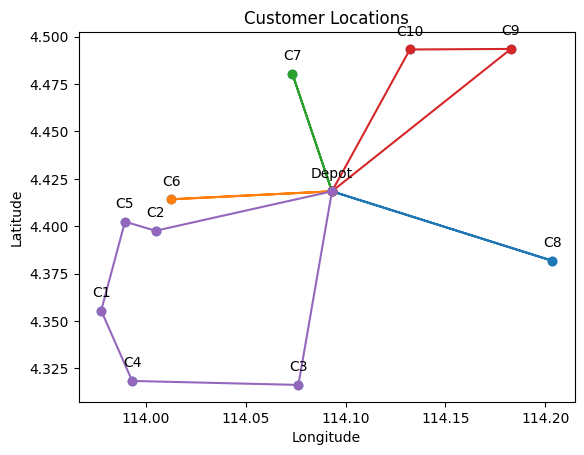

Total Distance = 147.1449 km
Total Cost = RM 176.57

Vehicle 1 (Type A):
Round Trip Distance:22.027 km, Cost: RM 26.43, Demand:11
Depot -> C3 (10.347 km) -> C6 (11.68 km)

Vehicle 2 (Type A):
Round Trip Distance:29.131 km, Cost: RM 34.96, Demand:13
Depot -> C10 (8.436 km) -> C1 (20.696 km)

Vehicle 3 (Type A):
Round Trip Distance:6.508 km, Cost: RM 7.81, Demand:3
Depot -> C7 (6.508 km)

Vehicle 4 (Type A):
Round Trip Distance:31.901 km, Cost: RM 38.28, Demand:13
Depot -> C9 (11.691 km) -> C2 (20.21 km)

Vehicle 5 (Type A):
Round Trip Distance:57.576 km, Cost: RM 69.09, Demand:17
Depot -> C4 (14.142 km) -> C8 (21.955 km) -> C5 (21.479 km)



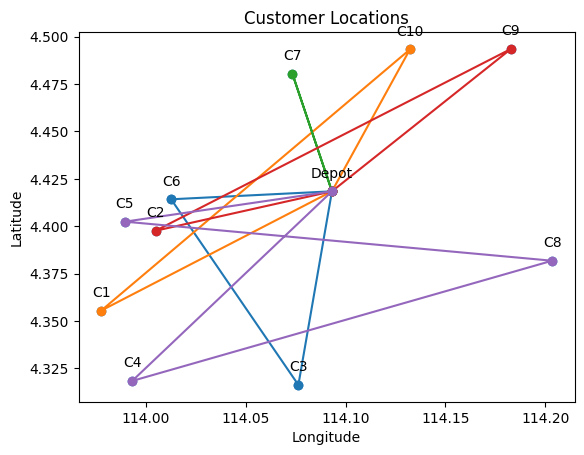

Iteration 1: Best Cost = 125.36189354527495
Iteration 2: Best Cost = 118.73084491372703
Iteration 3: Best Cost = 110.78084105732509
Iteration 4: Best Cost = 106.62952179792093
Iteration 5: Best Cost = 103.2566063145614
Iteration 6: Best Cost = 103.01502107592633
Iteration 7: Best Cost = 98.69515307008085
Iteration 8: Best Cost = 96.1396262098544
Iteration 9: Best Cost = 92.9370030272068
Iteration 10: Best Cost = 91.6732939853572
Iteration 11: Best Cost = 91.6732939853572
Iteration 12: Best Cost = 91.6732939853572
Iteration 13: Best Cost = 91.6732939853572
Iteration 14: Best Cost = 91.6732939853572
Iteration 15: Best Cost = 91.6732939853572
Iteration 16: Best Cost = 91.6732939853572
Iteration 17: Best Cost = 91.6732939853572
Iteration 18: Best Cost = 91.6732939853572
Iteration 19: Best Cost = 91.6732939853572
Iteration 20: Best Cost = 91.6732939853572
Iteration 21: Best Cost = 91.6732939853572
Iteration 22: Best Cost = 91.6732939853572
Iteration 23: Best Cost = 91.6732939853572
Iteratio

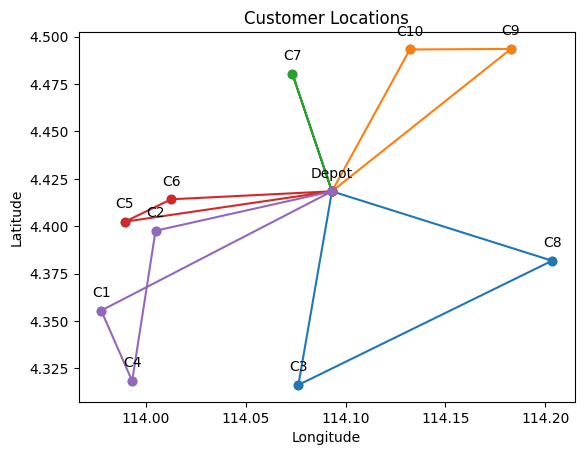

Total Distance = 99.1429 km
Total Cost = RM 118.97

Vehicle 1 (Type A):
Round Trip Distance:28.861 km, Cost: RM 34.63, Demand:16
Depot -> C3 (10.347 km) -> C6 (11.68 km) -> C1 (6.834 km)

Vehicle 2 (Type A):
Round Trip Distance:36.934 km, Cost: RM 44.32, Demand:22
Depot -> C2 (9.072 km) -> C4 (8.006 km) -> C5 (8.408 km) -> C7 (11.448 km)

Vehicle 3 (Type A):
Round Trip Distance:11.691 km, Cost: RM 14.03, Demand:5
Depot -> C9 (11.691 km)

Vehicle 4 (Type A):
Round Trip Distance:21.657 km, Cost: RM 25.99, Demand:14
Depot -> C10 (8.436 km) -> C8 (13.221 km)



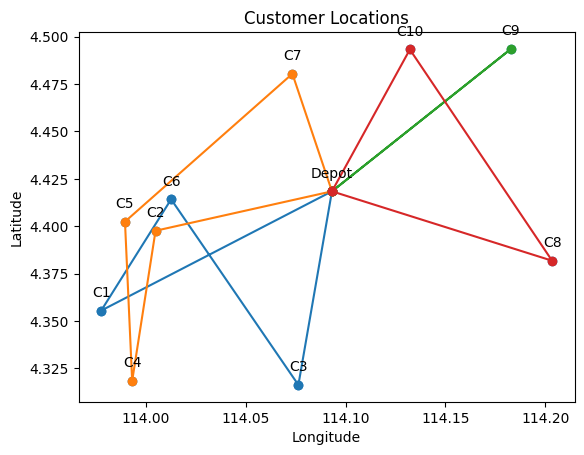

Iteration 1: Best Cost = 116.73633589674445
Iteration 2: Best Cost = 112.98987594124361
Iteration 3: Best Cost = 107.78097443842054
Iteration 4: Best Cost = 106.69872546480599
Iteration 5: Best Cost = 91.20222913557652
Iteration 6: Best Cost = 87.29571012454772
Iteration 7: Best Cost = 80.98309842469521
Iteration 8: Best Cost = 80.98309842469521
Iteration 9: Best Cost = 80.98309842469521
Iteration 10: Best Cost = 80.98309842469521
Iteration 11: Best Cost = 80.98309842469521
Iteration 12: Best Cost = 80.98309842469521
Iteration 13: Best Cost = 80.98309842469521
Iteration 14: Best Cost = 80.98309842469521
Iteration 15: Best Cost = 80.98309842469521
Iteration 16: Best Cost = 80.98309842469521
Iteration 17: Best Cost = 80.98309842469521
Iteration 18: Best Cost = 80.98309842469521
Iteration 19: Best Cost = 80.98309842469521
Iteration 20: Best Cost = 80.98309842469521
Iteration 21: Best Cost = 80.98309842469521
Iteration 22: Best Cost = 80.98309842469521
Iteration 23: Best Cost = 80.98309842

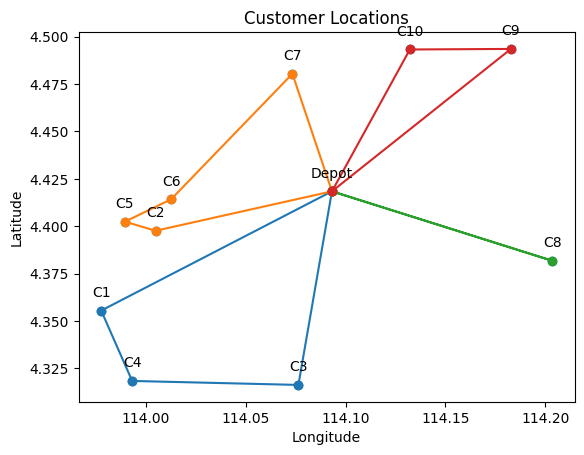

Total Distance = 134.7869 km
Total Cost = RM 184.69

Vehicle 1 (Type A):
Round Trip Distance:22.243 km, Cost: RM 26.69, Demand:8
Depot -> C7 (6.508 km) -> C1 (15.735 km)

Vehicle 2 (Type A):
Round Trip Distance:9.072 km, Cost: RM 10.89, Demand:8
Depot -> C2 (9.072 km)

Vehicle 3 (Type A):
Round Trip Distance:26.985 km, Cost: RM 32.38, Demand:11
Depot -> C10 (8.436 km) -> C3 (18.549 km)

Vehicle 4 (Type B):
Round Trip Distance:76.487 km, Cost: RM 114.73, Demand:30
Depot -> C9 (11.691 km) -> C6 (18.768 km) -> C5 (2.594 km) -> C8 (21.479 km) -> C4 (21.955 km)



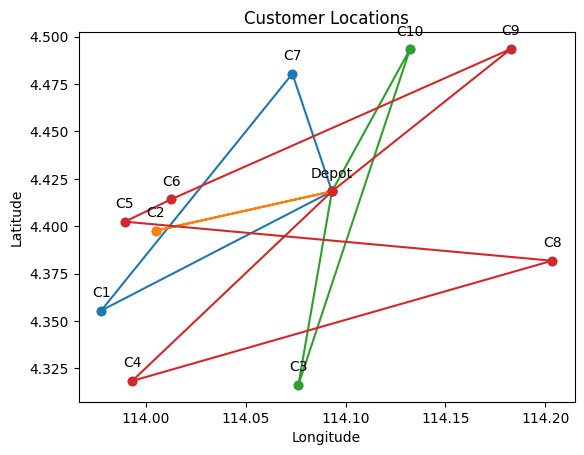

Iteration 1: Best Cost = 170.51557443673642
Iteration 2: Best Cost = 166.87469260529318
Iteration 3: Best Cost = 149.3385977159904
Iteration 4: Best Cost = 146.90880126678843
Iteration 5: Best Cost = 129.6618965652057
Iteration 6: Best Cost = 108.09915823623324
Iteration 7: Best Cost = 104.57400614102829
Iteration 8: Best Cost = 102.94068516276906
Iteration 9: Best Cost = 101.95185634649788
Iteration 10: Best Cost = 96.1568625799535
Iteration 11: Best Cost = 96.1568625799535
Iteration 12: Best Cost = 96.1568625799535
Iteration 13: Best Cost = 96.1568625799535
Iteration 14: Best Cost = 96.1568625799535
Iteration 15: Best Cost = 96.1568625799535
Iteration 16: Best Cost = 96.1568625799535
Iteration 17: Best Cost = 96.1568625799535
Iteration 18: Best Cost = 96.1568625799535
Iteration 19: Best Cost = 96.1568625799535
Iteration 20: Best Cost = 96.1568625799535
Iteration 21: Best Cost = 96.1568625799535
Iteration 22: Best Cost = 96.1568625799535
Iteration 23: Best Cost = 96.1568625799535
Iter

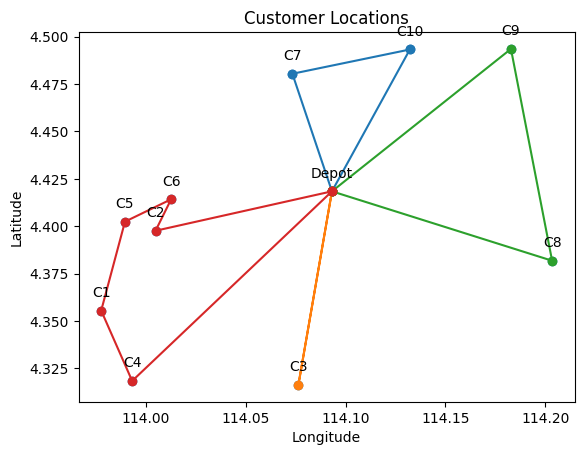

Total Distance = 100.3351 km
Total Cost = RM 126.33

Vehicle 1 (Type A):
Round Trip Distance:23.049 km, Cost: RM 27.66, Demand:11
Depot -> C9 (11.691 km) -> C8 (11.358 km)

Vehicle 2 (Type B):
Round Trip Distance:19.746 km, Cost: RM 29.62, Demand:26
Depot -> C6 (8.061 km) -> C2 (1.834 km) -> C1 (5.012 km) -> C5 (4.839 km)

Vehicle 3 (Type A):
Round Trip Distance:14.142 km, Cost: RM 16.97, Demand:6
Depot -> C4 (14.142 km)

Vehicle 4 (Type A):
Round Trip Distance:43.398 km, Cost: RM 52.08, Demand:14
Depot -> C10 (8.436 km) -> C3 (18.549 km) -> C7 (16.413 km)



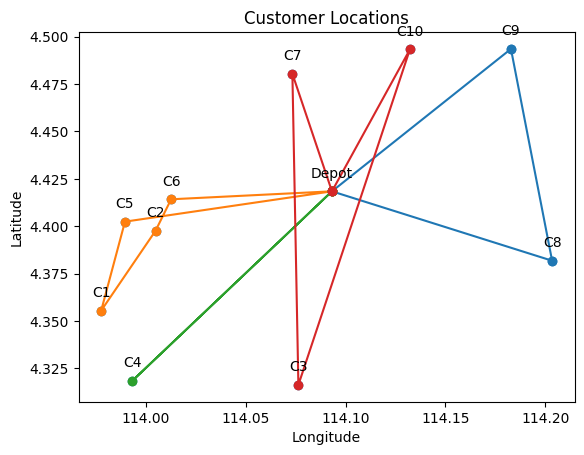

Iteration 1: Best Cost = 119.40995072622863
Iteration 2: Best Cost = 118.08829802984044
Iteration 3: Best Cost = 108.59143910220817
Iteration 4: Best Cost = 106.16168091960503
Iteration 5: Best Cost = 99.92711377418719
Iteration 6: Best Cost = 96.18065381868637
Iteration 7: Best Cost = 91.62684426901308
Iteration 8: Best Cost = 89.6946710405031
Iteration 9: Best Cost = 85.7881520294743
Iteration 10: Best Cost = 85.7881520294743
Iteration 11: Best Cost = 85.7881520294743
Iteration 12: Best Cost = 85.7881520294743
Iteration 13: Best Cost = 85.7881520294743
Iteration 14: Best Cost = 85.7881520294743
Iteration 15: Best Cost = 85.7881520294743
Iteration 16: Best Cost = 85.7881520294743
Iteration 17: Best Cost = 85.7881520294743
Iteration 18: Best Cost = 85.7881520294743
Iteration 19: Best Cost = 85.7881520294743
Iteration 20: Best Cost = 85.7881520294743
Iteration 21: Best Cost = 85.7881520294743
Iteration 22: Best Cost = 85.7881520294743
Iteration 23: Best Cost = 85.7881520294743
Iteration

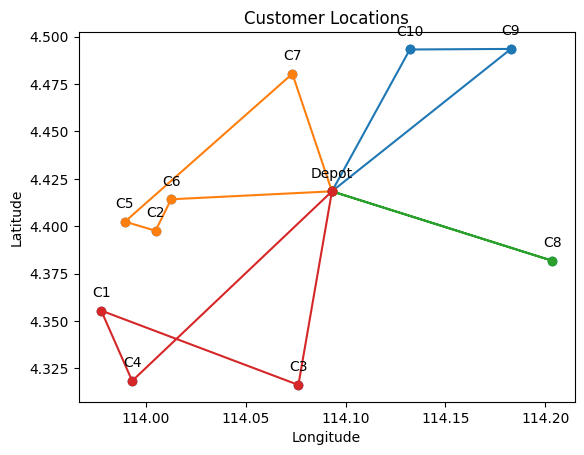

Total Distance = 120.7644 km
Total Cost = RM 144.92

Vehicle 1 (Type A):
Round Trip Distance:11.612 km, Cost: RM 13.93, Demand:6
Depot -> C8 (11.612 km)

Vehicle 2 (Type A):
Round Trip Distance:14.084 km, Cost: RM 16.9, Demand:13
Depot -> C2 (9.072 km) -> C1 (5.012 km)

Vehicle 3 (Type A):
Round Trip Distance:39.492 km, Cost: RM 47.39, Demand:24
Depot -> C3 (10.347 km) -> C5 (12.226 km) -> C6 (2.594 km) -> C10 (14.325 km)

Vehicle 4 (Type A):
Round Trip Distance:55.576 km, Cost: RM 66.69, Demand:14
Depot -> C9 (11.691 km) -> C4 (25.809 km) -> C7 (18.077 km)



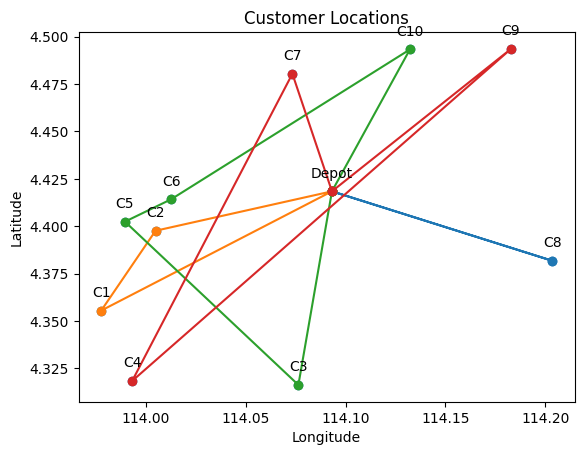

Iteration 1: Best Cost = 143.6126568241196
Iteration 2: Best Cost = 142.1619861875078
Iteration 3: Best Cost = 126.99566598962531
Iteration 4: Best Cost = 107.06654391985136
Iteration 5: Best Cost = 95.7845332264905
Iteration 6: Best Cost = 94.41876311835242
Iteration 7: Best Cost = 88.1996333570892
Iteration 8: Best Cost = 81.32259665313384
Iteration 9: Best Cost = 80.53438925044915
Iteration 10: Best Cost = 79.53646714839311
Iteration 11: Best Cost = 79.53646714839311
Iteration 12: Best Cost = 79.53646714839311
Iteration 13: Best Cost = 79.53646714839311
Iteration 14: Best Cost = 79.53646714839311
Iteration 15: Best Cost = 79.53646714839311
Iteration 16: Best Cost = 79.53646714839311
Iteration 17: Best Cost = 79.53646714839311
Iteration 18: Best Cost = 79.53646714839311
Iteration 19: Best Cost = 79.53646714839311
Iteration 20: Best Cost = 79.53646714839311
Iteration 21: Best Cost = 79.53646714839311
Iteration 22: Best Cost = 79.53646714839311
Iteration 23: Best Cost = 79.536467148393

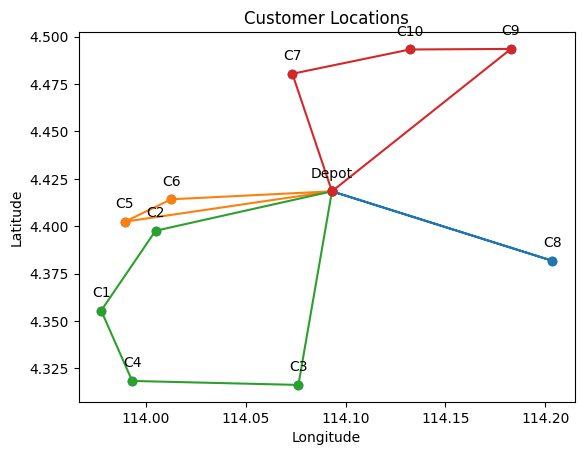

Total Distance = 104.9375 km
Total Cost = RM 125.93

Vehicle 1 (Type A):
Round Trip Distance:8.061 km, Cost: RM 9.67, Demand:8
Depot -> C6 (8.061 km)

Vehicle 2 (Type A):
Round Trip Distance:6.508 km, Cost: RM 7.81, Demand:3
Depot -> C7 (6.508 km)

Vehicle 3 (Type A):
Round Trip Distance:14.084 km, Cost: RM 16.9, Demand:13
Depot -> C2 (9.072 km) -> C1 (5.012 km)

Vehicle 4 (Type A):
Round Trip Distance:53.314 km, Cost: RM 63.98, Demand:22
Depot -> C3 (10.347 km) -> C5 (12.226 km) -> C4 (8.408 km) -> C10 (22.333 km)

Vehicle 5 (Type A):
Round Trip Distance:22.97 km, Cost: RM 27.56, Demand:11
Depot -> C8 (11.612 km) -> C9 (11.358 km)



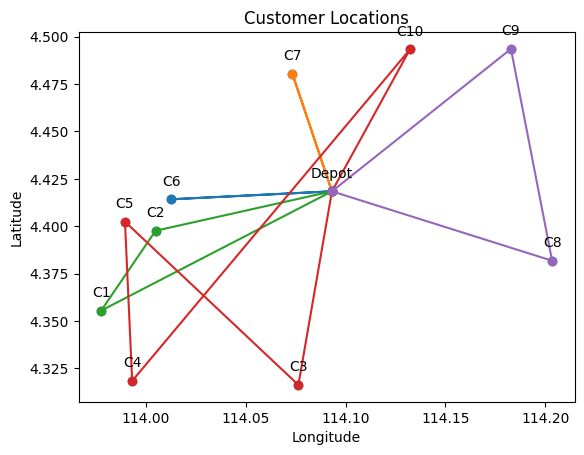

Iteration 1: Best Cost = 114.10247721898239
Iteration 2: Best Cost = 102.82046652562153
Iteration 3: Best Cost = 98.27762225827865
Iteration 4: Best Cost = 97.27970015622262
Iteration 5: Best Cost = 82.43801337388666
Iteration 6: Best Cost = 82.43801337388666
Iteration 7: Best Cost = 82.43801337388666
Iteration 8: Best Cost = 82.43801337388666
Iteration 9: Best Cost = 82.43801337388666
Iteration 10: Best Cost = 82.43801337388666
Iteration 11: Best Cost = 82.43801337388666
Iteration 12: Best Cost = 82.43801337388666
Iteration 13: Best Cost = 82.43801337388666
Iteration 14: Best Cost = 82.43801337388666
Iteration 15: Best Cost = 82.43801337388666
Iteration 16: Best Cost = 82.43801337388666
Iteration 17: Best Cost = 82.43801337388666
Iteration 18: Best Cost = 82.43801337388666
Iteration 19: Best Cost = 82.43801337388666
Iteration 20: Best Cost = 82.43801337388666
Iteration 21: Best Cost = 82.43801337388666
Iteration 22: Best Cost = 82.43801337388666
Iteration 23: Best Cost = 82.4380133738

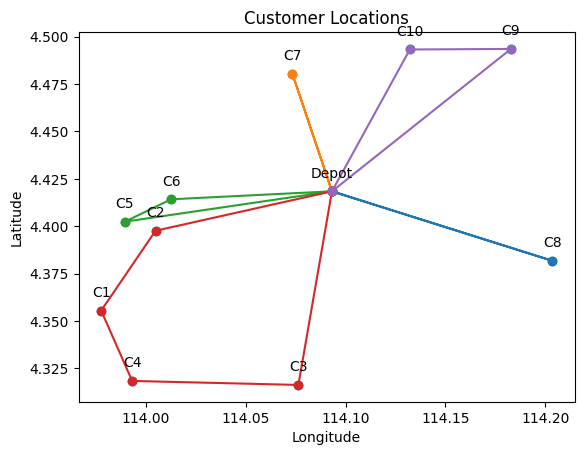

Total Distance = 123.5668 km
Total Cost = RM 148.28

Vehicle 1 (Type A):
Round Trip Distance:8.061 km, Cost: RM 9.67, Demand:8
Depot -> C6 (8.061 km)

Vehicle 2 (Type A):
Round Trip Distance:11.612 km, Cost: RM 13.93, Demand:6
Depot -> C8 (11.612 km)

Vehicle 3 (Type A):
Round Trip Distance:14.084 km, Cost: RM 16.9, Demand:13
Depot -> C2 (9.072 km) -> C1 (5.012 km)

Vehicle 4 (Type A):
Round Trip Distance:37.5 km, Cost: RM 45.0, Demand:11
Depot -> C9 (11.691 km) -> C4 (25.809 km)

Vehicle 5 (Type A):
Round Trip Distance:6.508 km, Cost: RM 7.81, Demand:3
Depot -> C7 (6.508 km)

Vehicle 6 (Type A):
Round Trip Distance:45.802 km, Cost: RM 54.96, Demand:16
Depot -> C3 (10.347 km) -> C10 (18.549 km) -> C5 (16.905 km)



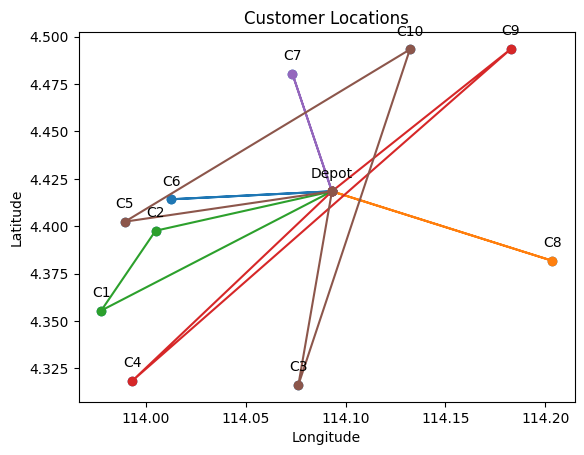

Iteration 1: Best Cost = 100.91289091413131
Iteration 2: Best Cost = 91.55811410016108
Iteration 3: Best Cost = 87.65159508913229
Iteration 4: Best Cost = 87.65159508913229
Iteration 5: Best Cost = 87.65159508913229
Iteration 6: Best Cost = 87.65159508913229
Iteration 7: Best Cost = 87.65159508913229
Iteration 8: Best Cost = 87.65159508913229
Iteration 9: Best Cost = 87.65159508913229
Iteration 10: Best Cost = 87.65159508913229
Iteration 11: Best Cost = 87.65159508913229
Iteration 12: Best Cost = 87.65159508913229
Iteration 13: Best Cost = 87.65159508913229
Iteration 14: Best Cost = 87.65159508913229
Iteration 15: Best Cost = 87.65159508913229
Iteration 16: Best Cost = 87.65159508913229
Iteration 17: Best Cost = 87.65159508913229
Iteration 18: Best Cost = 87.65159508913229
Iteration 19: Best Cost = 87.65159508913229
Iteration 20: Best Cost = 87.65159508913229
Iteration 21: Best Cost = 87.65159508913229
Iteration 22: Best Cost = 87.65159508913229
Iteration 23: Best Cost = 87.65159508913

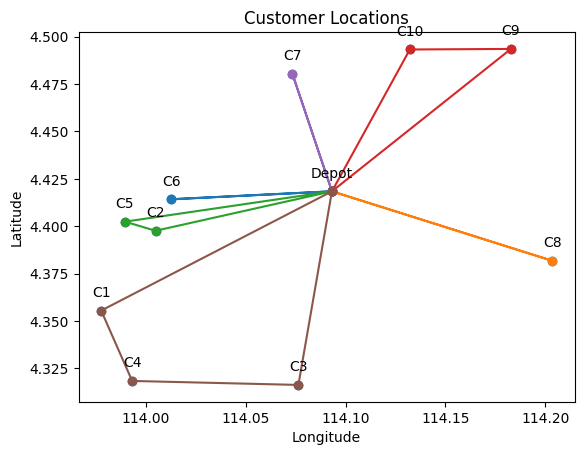

Total Distance = 136.971 km
Total Cost = RM 187.38

Vehicle 1 (Type A):
Round Trip Distance:14.142 km, Cost: RM 16.97, Demand:6
Depot -> C4 (14.142 km)

Vehicle 2 (Type A):
Round Trip Distance:46.124 km, Cost: RM 55.35, Demand:25
Depot -> C6 (8.061 km) -> C2 (1.834 km) -> C8 (19.913 km) -> C7 (16.316 km)

Vehicle 3 (Type B):
Round Trip Distance:76.705 km, Cost: RM 115.06, Demand:26
Depot -> C9 (11.691 km) -> C1 (24.72 km) -> C5 (4.839 km) -> C10 (16.905 km) -> C3 (18.549 km)



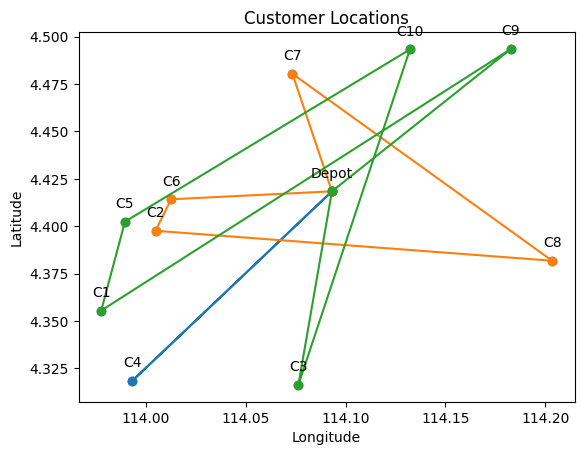

Iteration 1: Best Cost = 164.4472666400435
Iteration 2: Best Cost = 157.24265733961653
Iteration 3: Best Cost = 117.03049884309394
Iteration 4: Best Cost = 111.41255829980155
Iteration 5: Best Cost = 105.4574230166906
Iteration 6: Best Cost = 100.88882836240029
Iteration 7: Best Cost = 98.98710691449251
Iteration 8: Best Cost = 98.98710691449251
Iteration 9: Best Cost = 98.98710691449251
Iteration 10: Best Cost = 98.98710691449251
Iteration 11: Best Cost = 98.98710691449251
Iteration 12: Best Cost = 98.98710691449251
Iteration 13: Best Cost = 98.98710691449251
Iteration 14: Best Cost = 98.98710691449251
Iteration 15: Best Cost = 98.98710691449251
Iteration 16: Best Cost = 98.98710691449251
Iteration 17: Best Cost = 98.98710691449251
Iteration 18: Best Cost = 98.98710691449251
Iteration 19: Best Cost = 98.98710691449251
Iteration 20: Best Cost = 98.98710691449251
Iteration 21: Best Cost = 98.98710691449251
Iteration 22: Best Cost = 98.98710691449251
Iteration 23: Best Cost = 98.98710691

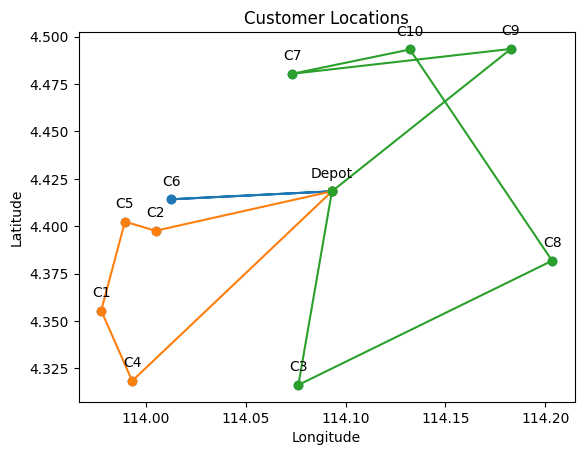

Total Distance = 119.3261 km
Total Cost = RM 143.19

Vehicle 1 (Type A):
Round Trip Distance:8.436 km, Cost: RM 10.12, Demand:8
Depot -> C10 (8.436 km)

Vehicle 2 (Type A):
Round Trip Distance:49.34 km, Cost: RM 59.21, Demand:17
Depot -> C7 (6.508 km) -> C8 (16.316 km) -> C3 (14.29 km) -> C5 (12.226 km)

Vehicle 3 (Type A):
Round Trip Distance:36.412 km, Cost: RM 43.69, Demand:10
Depot -> C9 (11.691 km) -> C1 (24.72 km)

Vehicle 4 (Type A):
Round Trip Distance:17.078 km, Cost: RM 20.49, Demand:14
Depot -> C2 (9.072 km) -> C4 (8.006 km)

Vehicle 5 (Type A):
Round Trip Distance:8.061 km, Cost: RM 9.67, Demand:8
Depot -> C6 (8.061 km)



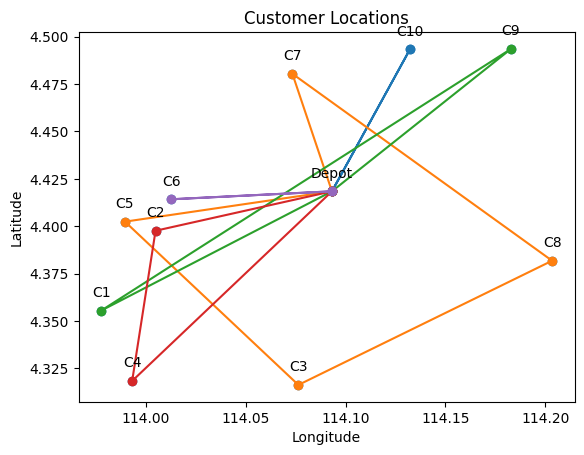

Iteration 1: Best Cost = 143.0825078528092
Iteration 2: Best Cost = 118.24290644285153
Iteration 3: Best Cost = 112.29346202134724
Iteration 4: Best Cost = 111.36150595367705
Iteration 5: Best Cost = 110.31334438382599
Iteration 6: Best Cost = 102.41357999521907
Iteration 7: Best Cost = 102.41357999521907
Iteration 8: Best Cost = 102.41357999521907
Iteration 9: Best Cost = 102.41357999521907
Iteration 10: Best Cost = 102.41357999521907
Iteration 11: Best Cost = 102.41357999521907
Iteration 12: Best Cost = 102.41357999521907
Iteration 13: Best Cost = 102.41357999521907
Iteration 14: Best Cost = 102.41357999521907
Iteration 15: Best Cost = 102.41357999521907
Iteration 16: Best Cost = 102.41357999521907
Iteration 17: Best Cost = 102.41357999521907
Iteration 18: Best Cost = 102.41357999521907
Iteration 19: Best Cost = 102.41357999521907
Iteration 20: Best Cost = 102.41357999521907
Iteration 21: Best Cost = 102.41357999521907
Iteration 22: Best Cost = 102.41357999521907
Iteration 23: Best C

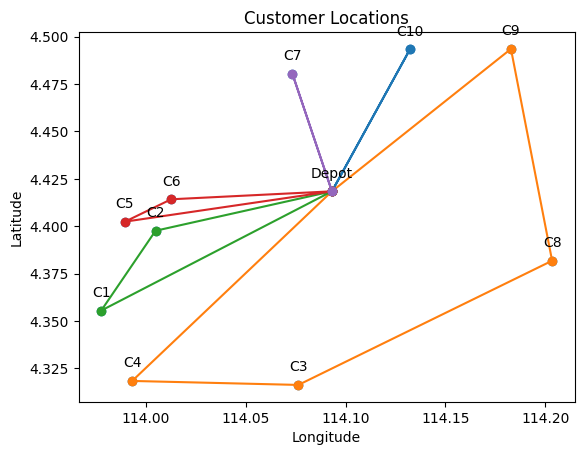

Total Distance = 98.2621 km
Total Cost = RM 117.91

Vehicle 1 (Type A):
Round Trip Distance:13.152 km, Cost: RM 15.78, Demand:5
Depot -> C1 (13.152 km)

Vehicle 2 (Type A):
Round Trip Distance:11.691 km, Cost: RM 14.03, Demand:5
Depot -> C9 (11.691 km)

Vehicle 3 (Type A):
Round Trip Distance:14.911 km, Cost: RM 17.89, Demand:21
Depot -> C5 (10.483 km) -> C6 (2.594 km) -> C2 (1.834 km)

Vehicle 4 (Type A):
Round Trip Distance:14.142 km, Cost: RM 16.97, Demand:6
Depot -> C4 (14.142 km)

Vehicle 5 (Type A):
Round Trip Distance:6.508 km, Cost: RM 7.81, Demand:3
Depot -> C7 (6.508 km)

Vehicle 6 (Type A):
Round Trip Distance:37.858 km, Cost: RM 45.43, Demand:17
Depot -> C3 (10.347 km) -> C8 (14.29 km) -> C10 (13.221 km)



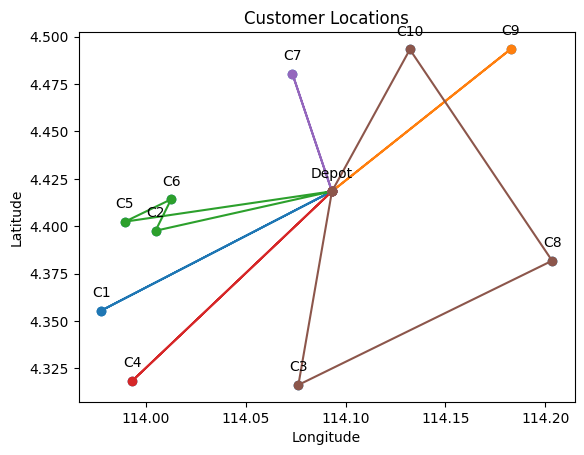

Iteration 1: Best Cost = 114.39708456364875
Iteration 2: Best Cost = 111.4689992953796
Iteration 3: Best Cost = 111.46899929537958
Iteration 4: Best Cost = 107.56248028435078
Iteration 5: Best Cost = 98.1001924092075
Iteration 6: Best Cost = 96.40681439243208
Iteration 7: Best Cost = 94.00545299651807
Iteration 8: Best Cost = 94.00545299651807
Iteration 9: Best Cost = 94.00545299651807
Iteration 10: Best Cost = 94.00545299651807
Iteration 11: Best Cost = 94.00545299651807
Iteration 12: Best Cost = 94.00545299651807
Iteration 13: Best Cost = 94.00545299651807
Iteration 14: Best Cost = 94.00545299651807
Iteration 15: Best Cost = 94.00545299651807
Iteration 16: Best Cost = 94.00545299651807
Iteration 17: Best Cost = 94.00545299651807
Iteration 18: Best Cost = 94.00545299651807
Iteration 19: Best Cost = 94.00545299651807
Iteration 20: Best Cost = 94.00545299651807
Iteration 21: Best Cost = 94.00545299651807
Iteration 22: Best Cost = 94.00545299651807
Iteration 23: Best Cost = 94.0054529965

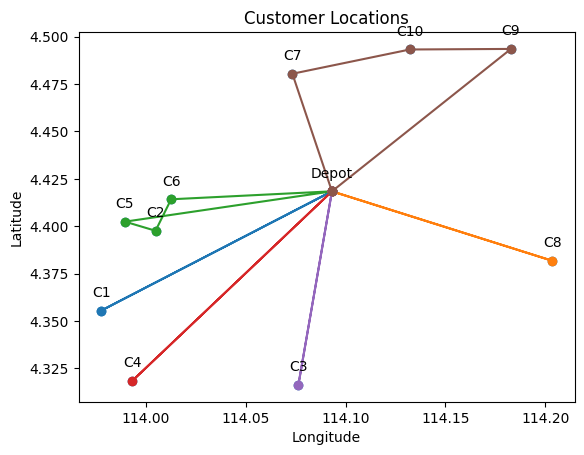

Total Distance = 116.257 km
Total Cost = RM 139.51

Vehicle 1 (Type A):
Round Trip Distance:31.901 km, Cost: RM 38.28, Demand:13
Depot -> C9 (11.691 km) -> C2 (20.21 km)

Vehicle 2 (Type A):
Round Trip Distance:10.347 km, Cost: RM 12.42, Demand:3
Depot -> C3 (10.347 km)

Vehicle 3 (Type A):
Round Trip Distance:17.99 km, Cost: RM 21.59, Demand:10
Depot -> C1 (13.152 km) -> C5 (4.839 km)

Vehicle 4 (Type A):
Round Trip Distance:34.361 km, Cost: RM 41.23, Demand:17
Depot -> C7 (6.508 km) -> C4 (18.077 km) -> C6 (9.776 km)

Vehicle 5 (Type A):
Round Trip Distance:21.657 km, Cost: RM 25.99, Demand:14
Depot -> C10 (8.436 km) -> C8 (13.221 km)



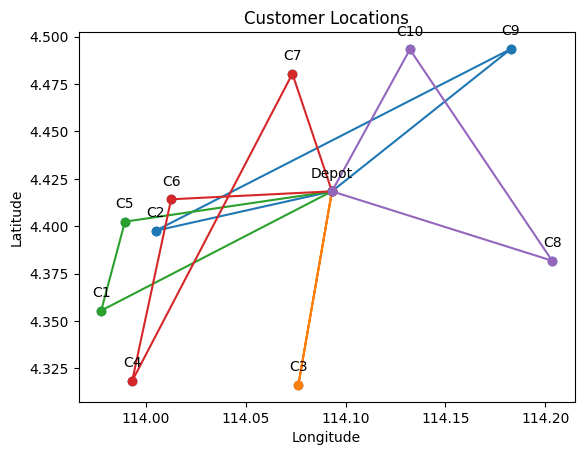

Iteration 1: Best Cost = 132.12499444042652
Iteration 2: Best Cost = 128.08668804700125
Iteration 3: Best Cost = 119.37584623547954
Iteration 4: Best Cost = 111.88143127685598
Iteration 5: Best Cost = 111.61068058284775
Iteration 6: Best Cost = 110.62598931505345
Iteration 7: Best Cost = 109.08796510625537
Iteration 8: Best Cost = 105.7150091520341
Iteration 9: Best Cost = 99.82254915584707
Iteration 10: Best Cost = 92.14405600376901
Iteration 11: Best Cost = 88.12621716485677
Iteration 12: Best Cost = 87.12829506280073
Iteration 13: Best Cost = 87.12829506280073
Iteration 14: Best Cost = 87.12829506280073
Iteration 15: Best Cost = 87.12829506280073
Iteration 16: Best Cost = 87.12829506280073
Iteration 17: Best Cost = 87.12829506280073
Iteration 18: Best Cost = 87.12829506280073
Iteration 19: Best Cost = 87.12829506280073
Iteration 20: Best Cost = 87.12829506280073
Iteration 21: Best Cost = 87.12829506280073
Iteration 22: Best Cost = 87.12829506280073
Iteration 23: Best Cost = 87.12829

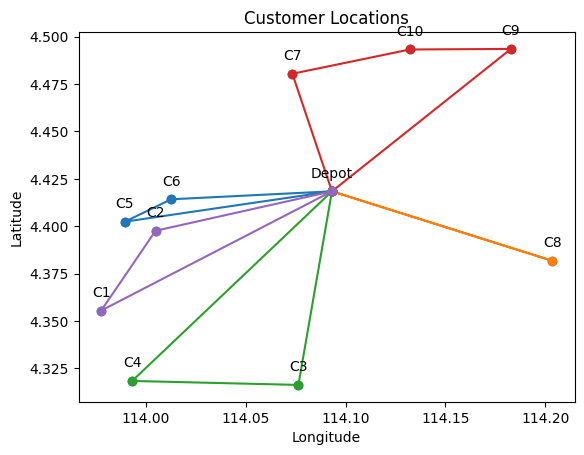

Total Distance = 132.4404 km
Total Cost = RM 158.93

Vehicle 1 (Type A):
Round Trip Distance:13.152 km, Cost: RM 15.78, Demand:5
Depot -> C1 (13.152 km)

Vehicle 2 (Type A):
Round Trip Distance:44.719 km, Cost: RM 53.66, Demand:22
Depot -> C6 (8.061 km) -> C10 (14.325 km) -> C4 (22.333 km)

Vehicle 3 (Type A):
Round Trip Distance:31.962 km, Cost: RM 38.35, Demand:11
Depot -> C5 (10.483 km) -> C8 (21.479 km)

Vehicle 4 (Type A):
Round Trip Distance:19.898 km, Cost: RM 23.88, Demand:11
Depot -> C2 (9.072 km) -> C3 (10.827 km)

Vehicle 5 (Type A):
Round Trip Distance:22.709 km, Cost: RM 27.25, Demand:8
Depot -> C9 (11.691 km) -> C7 (11.018 km)



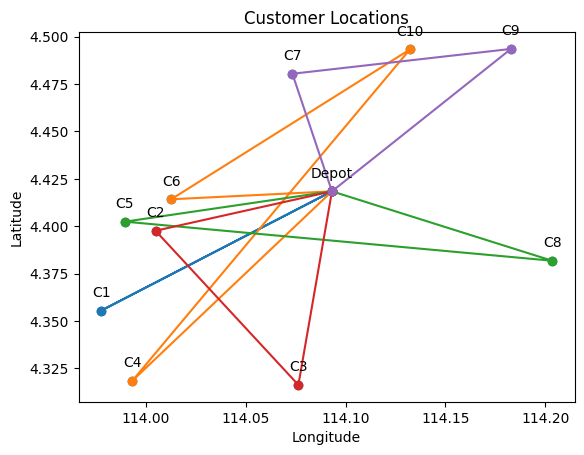

Iteration 1: Best Cost = 147.29987830815634
Iteration 2: Best Cost = 145.31044208774674
Iteration 3: Best Cost = 132.72656893944173
Iteration 4: Best Cost = 132.36611842301102
Iteration 5: Best Cost = 116.93206087080549
Iteration 6: Best Cost = 105.9126286150974
Iteration 7: Best Cost = 104.27342949141297
Iteration 8: Best Cost = 102.9076593832749
Iteration 9: Best Cost = 101.64395034142531
Iteration 10: Best Cost = 96.86173078461037
Iteration 11: Best Cost = 95.67324133753677
Iteration 12: Best Cost = 92.30798249731326
Iteration 13: Best Cost = 92.30798249731326
Iteration 14: Best Cost = 92.30798249731326
Iteration 15: Best Cost = 92.30798249731326
Iteration 16: Best Cost = 92.30798249731326
Iteration 17: Best Cost = 92.30798249731326
Iteration 18: Best Cost = 92.30798249731326
Iteration 19: Best Cost = 92.30798249731326
Iteration 20: Best Cost = 92.30798249731326
Iteration 21: Best Cost = 92.30798249731326
Iteration 22: Best Cost = 92.30798249731326
Iteration 23: Best Cost = 92.30798

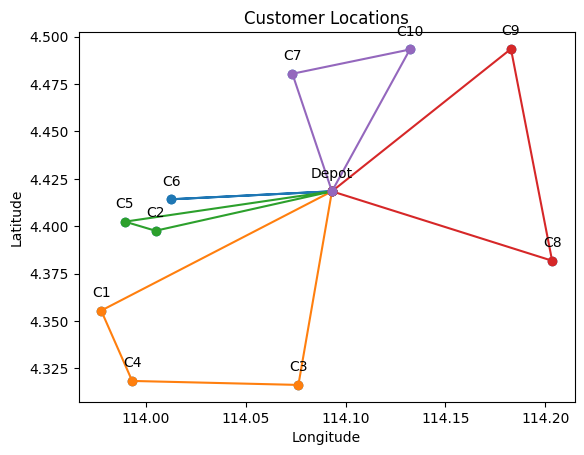

Total Distance = 124.0232 km
Total Cost = RM 148.83

Vehicle 1 (Type A):
Round Trip Distance:17.255 km, Cost: RM 20.71, Demand:11
Depot -> C7 (6.508 km) -> C2 (10.746 km)

Vehicle 2 (Type A):
Round Trip Distance:30.769 km, Cost: RM 36.92, Demand:14
Depot -> C10 (8.436 km) -> C4 (22.333 km)

Vehicle 3 (Type A):
Round Trip Distance:10.483 km, Cost: RM 12.58, Demand:5
Depot -> C5 (10.483 km)

Vehicle 4 (Type A):
Round Trip Distance:39.616 km, Cost: RM 47.54, Demand:18
Depot -> C6 (8.061 km) -> C1 (6.834 km) -> C9 (24.72 km)

Vehicle 5 (Type A):
Round Trip Distance:25.901 km, Cost: RM 31.08, Demand:9
Depot -> C8 (11.612 km) -> C3 (14.29 km)



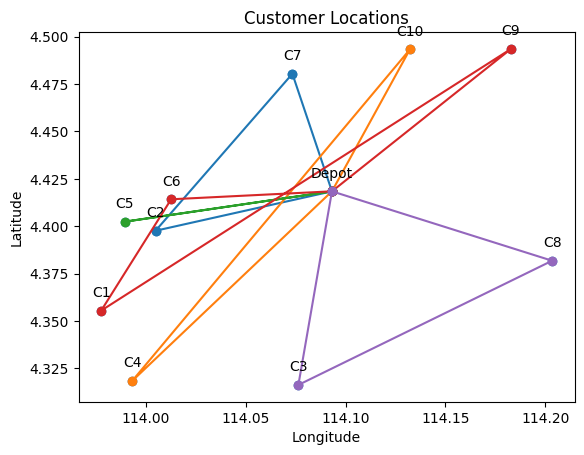

Iteration 1: Best Cost = 128.38982498609775
Iteration 2: Best Cost = 120.37874013695227
Iteration 3: Best Cost = 103.2608585927994
Iteration 4: Best Cost = 100.78451738594813
Iteration 5: Best Cost = 94.83742411213169
Iteration 6: Best Cost = 92.71938154920055
Iteration 7: Best Cost = 92.14612399330021
Iteration 8: Best Cost = 90.51280301504097
Iteration 9: Best Cost = 88.08083118063065
Iteration 10: Best Cost = 88.08083118063065
Iteration 11: Best Cost = 88.08083118063065
Iteration 12: Best Cost = 88.08083118063065
Iteration 13: Best Cost = 88.08083118063065
Iteration 14: Best Cost = 88.08083118063065
Iteration 15: Best Cost = 88.08083118063065
Iteration 16: Best Cost = 88.08083118063065
Iteration 17: Best Cost = 88.08083118063065
Iteration 18: Best Cost = 88.08083118063065
Iteration 19: Best Cost = 88.08083118063065
Iteration 20: Best Cost = 88.08083118063065
Iteration 21: Best Cost = 88.08083118063065
Iteration 22: Best Cost = 88.08083118063065
Iteration 23: Best Cost = 88.080831180

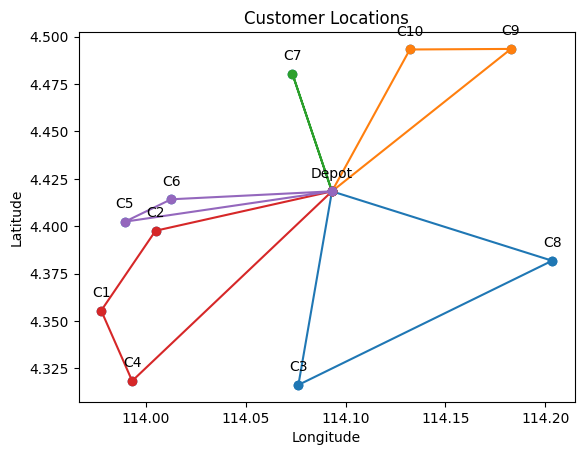

Total Distance = 125.8791 km
Total Cost = RM 151.05

Vehicle 1 (Type A):
Round Trip Distance:9.072 km, Cost: RM 10.89, Demand:8
Depot -> C2 (9.072 km)

Vehicle 2 (Type A):
Round Trip Distance:40.625 km, Cost: RM 48.75, Demand:15
Depot -> C3 (10.347 km) -> C4 (8.323 km) -> C8 (21.955 km)

Vehicle 3 (Type A):
Round Trip Distance:48.173 km, Cost: RM 57.81, Demand:21
Depot -> C1 (13.152 km) -> C10 (20.696 km) -> C6 (14.325 km)

Vehicle 4 (Type A):
Round Trip Distance:17.527 km, Cost: RM 21.03, Demand:8
Depot -> C7 (6.508 km) -> C9 (11.018 km)

Vehicle 5 (Type A):
Round Trip Distance:10.483 km, Cost: RM 12.58, Demand:5
Depot -> C5 (10.483 km)



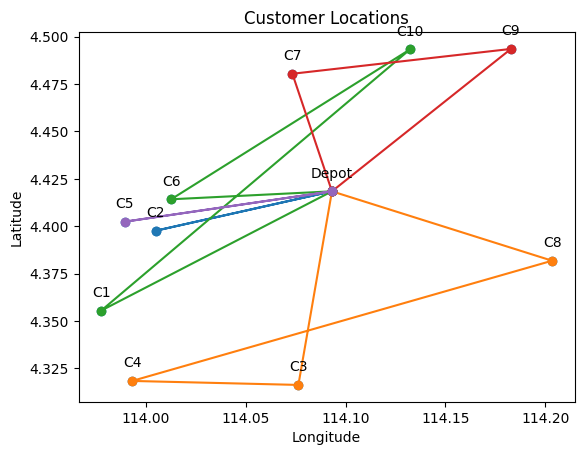

Iteration 1: Best Cost = 115.492161495968
Iteration 2: Best Cost = 113.39814530914735
Iteration 3: Best Cost = 112.24900338208795
Iteration 4: Best Cost = 112.24900338208793
Iteration 5: Best Cost = 109.84764198617393
Iteration 6: Best Cost = 107.15402566204149
Iteration 7: Best Cost = 106.14013023382454
Iteration 8: Best Cost = 104.95164078675091
Iteration 9: Best Cost = 94.59812395185018
Iteration 10: Best Cost = 84.99769749061696
Iteration 11: Best Cost = 81.09117847958815
Iteration 12: Best Cost = 79.87830653074776
Iteration 13: Best Cost = 79.87830653074776
Iteration 14: Best Cost = 79.87830653074776
Iteration 15: Best Cost = 79.87830653074776
Iteration 16: Best Cost = 79.87830653074776
Iteration 17: Best Cost = 79.87830653074776
Iteration 18: Best Cost = 79.87830653074776
Iteration 19: Best Cost = 79.87830653074776
Iteration 20: Best Cost = 79.87830653074776
Iteration 21: Best Cost = 79.87830653074776
Iteration 22: Best Cost = 79.87830653074776
Iteration 23: Best Cost = 79.878306

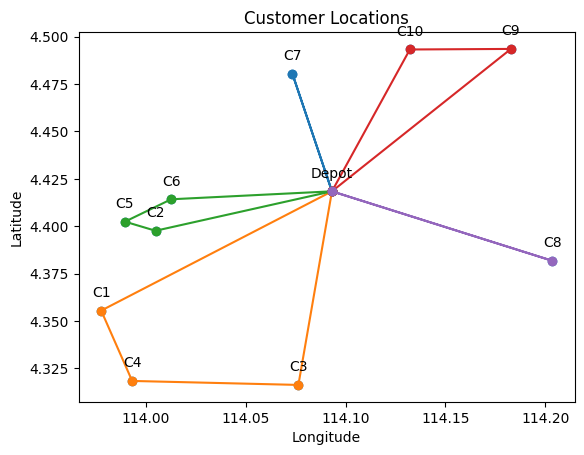

Total Distance = 128.6992 km
Total Cost = RM 154.44

Vehicle 1 (Type A):
Round Trip Distance:6.508 km, Cost: RM 7.81, Demand:3
Depot -> C7 (6.508 km)

Vehicle 2 (Type A):
Round Trip Distance:32.36 km, Cost: RM 38.83, Demand:8
Depot -> C9 (11.691 km) -> C3 (20.669 km)

Vehicle 3 (Type A):
Round Trip Distance:47.317 km, Cost: RM 56.78, Demand:22
Depot -> C6 (8.061 km) -> C8 (19.343 km) -> C2 (19.913 km)

Vehicle 4 (Type A):
Round Trip Distance:25.341 km, Cost: RM 30.41, Demand:13
Depot -> C10 (8.436 km) -> C5 (16.905 km)

Vehicle 5 (Type A):
Round Trip Distance:17.172 km, Cost: RM 20.61, Demand:11
Depot -> C1 (13.152 km) -> C4 (4.021 km)



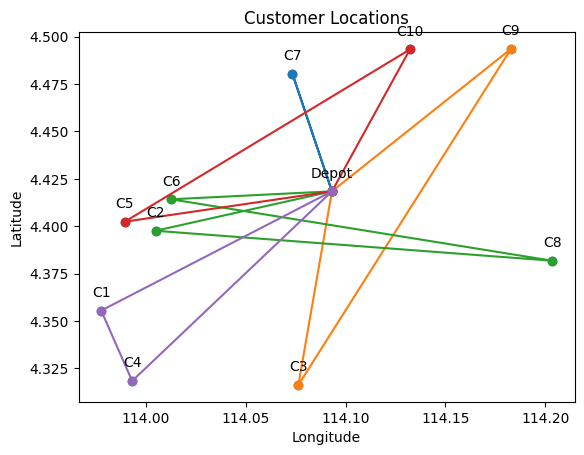

Iteration 1: Best Cost = 151.1129269106361
Iteration 2: Best Cost = 125.23063724871314
Iteration 3: Best Cost = 107.94729878041497
Iteration 4: Best Cost = 103.16839418384447
Iteration 5: Best Cost = 94.3104175390974
Iteration 6: Best Cost = 92.79290218874407
Iteration 7: Best Cost = 88.88638317771526
Iteration 8: Best Cost = 88.88638317771526
Iteration 9: Best Cost = 88.88638317771526
Iteration 10: Best Cost = 88.88638317771526
Iteration 11: Best Cost = 88.88638317771526
Iteration 12: Best Cost = 88.88638317771526
Iteration 13: Best Cost = 88.88638317771526
Iteration 14: Best Cost = 88.88638317771526
Iteration 15: Best Cost = 88.88638317771526
Iteration 16: Best Cost = 88.88638317771526
Iteration 17: Best Cost = 88.88638317771526
Iteration 18: Best Cost = 88.88638317771526
Iteration 19: Best Cost = 88.88638317771526
Iteration 20: Best Cost = 88.88638317771526
Iteration 21: Best Cost = 88.88638317771526
Iteration 22: Best Cost = 88.88638317771526
Iteration 23: Best Cost = 88.8863831777

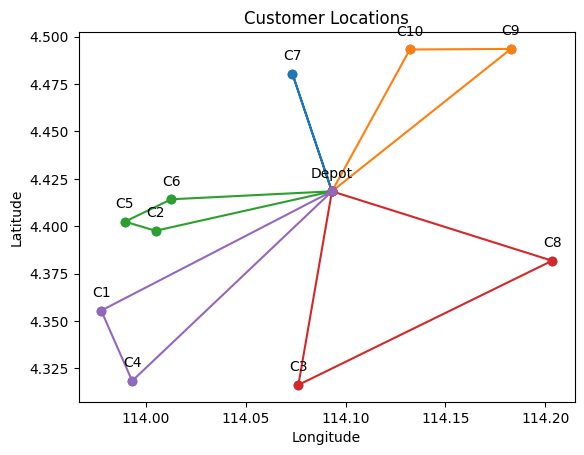

Total Distance = 132.6439 km
Total Cost = RM 159.17

Vehicle 1 (Type A):
Round Trip Distance:9.072 km, Cost: RM 10.89, Demand:8
Depot -> C2 (9.072 km)

Vehicle 2 (Type A):
Round Trip Distance:51.229 km, Cost: RM 61.48, Demand:17
Depot -> C3 (10.347 km) -> C10 (18.549 km) -> C4 (22.333 km)

Vehicle 3 (Type A):
Round Trip Distance:11.612 km, Cost: RM 13.93, Demand:6
Depot -> C8 (11.612 km)

Vehicle 4 (Type A):
Round Trip Distance:31.844 km, Cost: RM 38.21, Demand:18
Depot -> C5 (10.483 km) -> C6 (2.594 km) -> C9 (18.768 km)

Vehicle 5 (Type A):
Round Trip Distance:28.887 km, Cost: RM 34.66, Demand:8
Depot -> C1 (13.152 km) -> C7 (15.735 km)



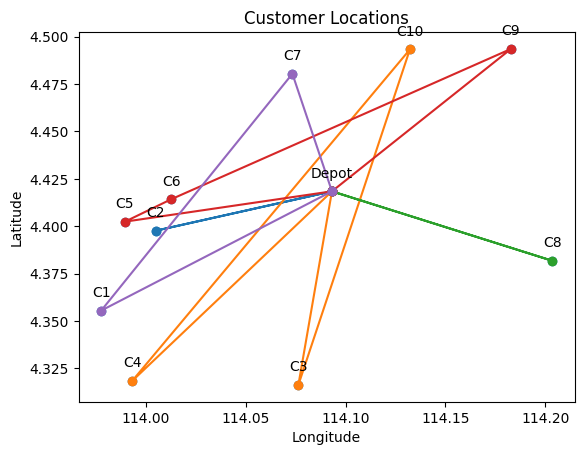

Iteration 1: Best Cost = 158.21217600196047
Iteration 2: Best Cost = 112.64514818017142
Iteration 3: Best Cost = 111.73337115042871
Iteration 4: Best Cost = 110.36831441668332
Iteration 5: Best Cost = 109.08596331088587
Iteration 6: Best Cost = 107.71739153012817
Iteration 7: Best Cost = 103.69955269121596
Iteration 8: Best Cost = 100.77146742294678
Iteration 9: Best Cost = 98.88571930119991
Iteration 10: Best Cost = 93.72346480349447
Iteration 11: Best Cost = 91.32210340758046
Iteration 12: Best Cost = 81.85981553243717
Iteration 13: Best Cost = 81.85981553243717
Iteration 14: Best Cost = 81.85981553243717
Iteration 15: Best Cost = 81.85981553243717
Iteration 16: Best Cost = 81.85981553243717
Iteration 17: Best Cost = 81.85981553243717
Iteration 18: Best Cost = 81.85981553243717
Iteration 19: Best Cost = 81.85981553243717
Iteration 20: Best Cost = 81.85981553243717
Iteration 21: Best Cost = 81.85981553243717
Iteration 22: Best Cost = 81.85981553243717
Iteration 23: Best Cost = 81.8598

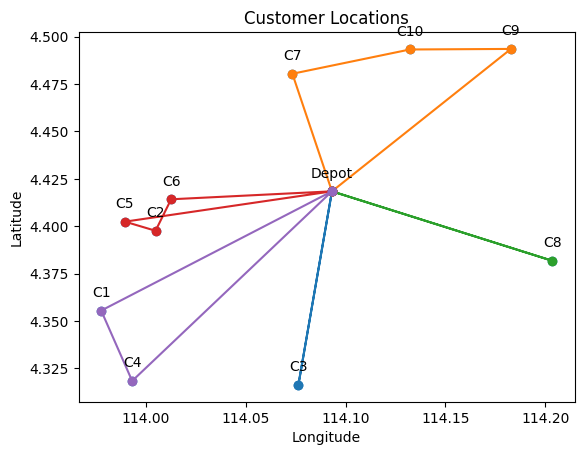

Total Distance = 129.7226 km
Total Cost = RM 182.01

Vehicle 1 (Type B):
Round Trip Distance:87.819 km, Cost: RM 131.73, Demand:29
Depot -> C8 (11.612 km) -> C10 (13.221 km) -> C5 (16.905 km) -> C9 (21.36 km) -> C1 (24.72 km)

Vehicle 2 (Type A):
Round Trip Distance:10.906 km, Cost: RM 13.09, Demand:16
Depot -> C2 (9.072 km) -> C6 (1.834 km)

Vehicle 3 (Type A):
Round Trip Distance:10.347 km, Cost: RM 12.42, Demand:3
Depot -> C3 (10.347 km)

Vehicle 4 (Type A):
Round Trip Distance:14.142 km, Cost: RM 16.97, Demand:6
Depot -> C4 (14.142 km)

Vehicle 5 (Type A):
Round Trip Distance:6.508 km, Cost: RM 7.81, Demand:3
Depot -> C7 (6.508 km)



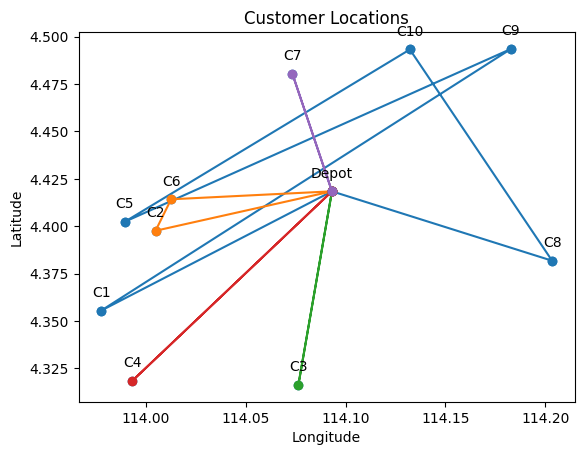

Iteration 1: Best Cost = 169.43113827560168
Iteration 2: Best Cost = 167.1360019123458
Iteration 3: Best Cost = 140.28809138173284
Iteration 4: Best Cost = 140.26967820344143
Iteration 5: Best Cost = 135.8731906298801
Iteration 6: Best Cost = 134.9853646101893
Iteration 7: Best Cost = 123.79249019303961
Iteration 8: Best Cost = 121.75114844998053
Iteration 9: Best Cost = 121.75114844998052
Iteration 10: Best Cost = 115.49525602606596
Iteration 11: Best Cost = 115.49525602606595
Iteration 12: Best Cost = 114.13019929232057
Iteration 13: Best Cost = 114.13019929232055
Iteration 14: Best Cost = 110.18489051201533
Iteration 15: Best Cost = 110.18489051201533
Iteration 16: Best Cost = 110.18489051201533
Iteration 17: Best Cost = 110.18489051201533
Iteration 18: Best Cost = 110.18489051201533
Iteration 19: Best Cost = 110.18489051201533
Iteration 20: Best Cost = 110.18489051201533
Iteration 21: Best Cost = 110.18489051201533
Iteration 22: Best Cost = 110.18489051201533
Iteration 23: Best Cos

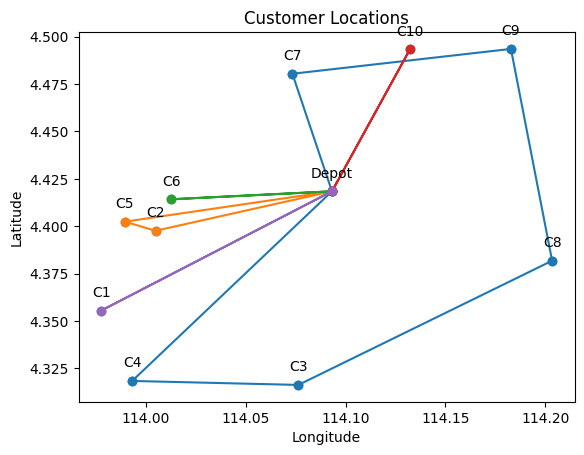

Total Distance = 138.5887 km
Total Cost = RM 188.96

Vehicle 1 (Type A):
Round Trip Distance:10.347 km, Cost: RM 12.42, Demand:3
Depot -> C3 (10.347 km)

Vehicle 2 (Type B):
Round Trip Distance:75.517 km, Cost: RM 113.28, Demand:30
Depot -> C4 (14.142 km) -> C10 (22.333 km) -> C6 (14.325 km) -> C7 (8.982 km) -> C1 (15.735 km)

Vehicle 3 (Type A):
Round Trip Distance:9.072 km, Cost: RM 10.89, Demand:8
Depot -> C2 (9.072 km)

Vehicle 4 (Type A):
Round Trip Distance:31.962 km, Cost: RM 38.35, Demand:11
Depot -> C5 (10.483 km) -> C8 (21.479 km)

Vehicle 5 (Type A):
Round Trip Distance:11.691 km, Cost: RM 14.03, Demand:5
Depot -> C9 (11.691 km)



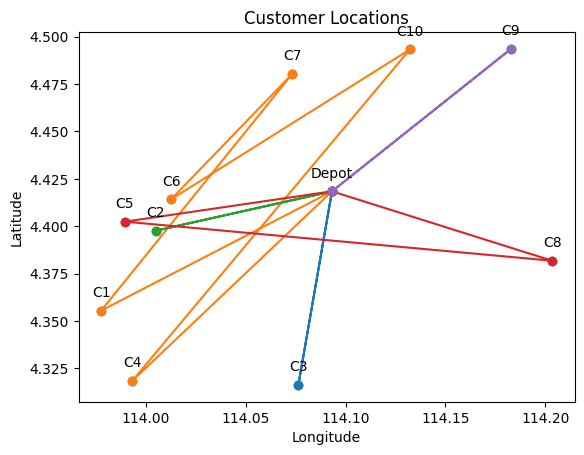

Iteration 1: Best Cost = 188.72370330994036
Iteration 2: Best Cost = 176.72160602196462
Iteration 3: Best Cost = 173.49448243810826
Iteration 4: Best Cost = 173.49448243810824
Iteration 5: Best Cost = 144.93021065992068
Iteration 6: Best Cost = 144.52195415115503
Iteration 7: Best Cost = 130.0949164802496
Iteration 8: Best Cost = 129.525483036734
Iteration 9: Best Cost = 127.43146684991335
Iteration 10: Best Cost = 126.28232492285395
Iteration 11: Best Cost = 126.28232492285393
Iteration 12: Best Cost = 116.30711008447392
Iteration 13: Best Cost = 96.97351955325816
Iteration 14: Best Cost = 95.47872858102396
Iteration 15: Best Cost = 91.57220956999517
Iteration 16: Best Cost = 91.57220956999515
Iteration 17: Best Cost = 91.57220956999515
Iteration 18: Best Cost = 91.57220956999515
Iteration 19: Best Cost = 91.57220956999515
Iteration 20: Best Cost = 91.57220956999515
Iteration 21: Best Cost = 91.57220956999515
Iteration 22: Best Cost = 91.57220956999515
Iteration 23: Best Cost = 91.572

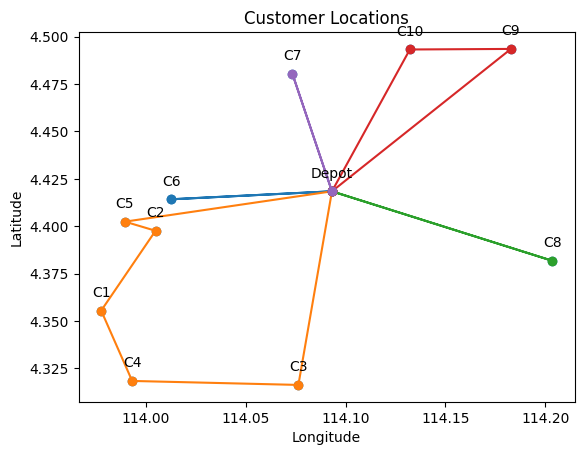

Total Distance = 132.8849 km
Total Cost = RM 159.46

Vehicle 1 (Type A):
Round Trip Distance:23.772 km, Cost: RM 28.53, Demand:8
Depot -> C1 (13.152 km) -> C3 (10.62 km)

Vehicle 2 (Type A):
Round Trip Distance:24.356 km, Cost: RM 29.23, Demand:16
Depot -> C10 (8.436 km) -> C2 (15.92 km)

Vehicle 3 (Type A):
Round Trip Distance:15.49 km, Cost: RM 18.59, Demand:11
Depot -> C7 (6.508 km) -> C6 (8.982 km)

Vehicle 4 (Type A):
Round Trip Distance:11.691 km, Cost: RM 14.03, Demand:5
Depot -> C9 (11.691 km)

Vehicle 5 (Type A):
Round Trip Distance:57.576 km, Cost: RM 69.09, Demand:17
Depot -> C4 (14.142 km) -> C8 (21.955 km) -> C5 (21.479 km)



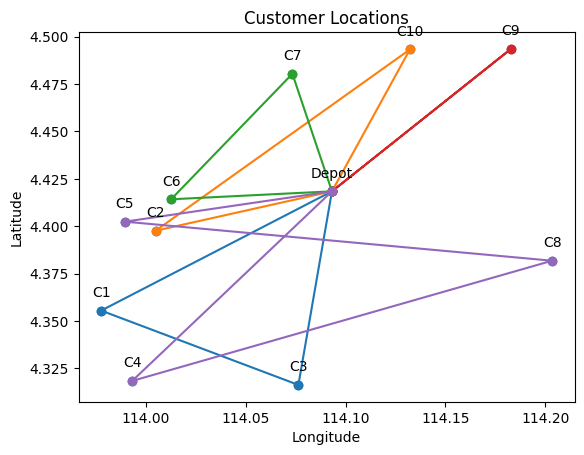

Iteration 1: Best Cost = 130.98675175937186
Iteration 2: Best Cost = 125.75995591887293
Iteration 3: Best Cost = 120.66557764598365
Iteration 4: Best Cost = 114.2128313828586
Iteration 5: Best Cost = 106.31475428531817
Iteration 6: Best Cost = 93.84193216708398
Iteration 7: Best Cost = 90.40657798238288
Iteration 8: Best Cost = 87.97460614797255
Iteration 9: Best Cost = 87.97460614797255
Iteration 10: Best Cost = 87.97460614797255
Iteration 11: Best Cost = 87.97460614797255
Iteration 12: Best Cost = 87.97460614797255
Iteration 13: Best Cost = 87.97460614797255
Iteration 14: Best Cost = 87.97460614797255
Iteration 15: Best Cost = 87.97460614797255
Iteration 16: Best Cost = 87.97460614797255
Iteration 17: Best Cost = 87.97460614797255
Iteration 18: Best Cost = 87.97460614797255
Iteration 19: Best Cost = 87.97460614797255
Iteration 20: Best Cost = 87.97460614797255
Iteration 21: Best Cost = 87.97460614797255
Iteration 22: Best Cost = 87.97460614797255
Iteration 23: Best Cost = 87.97460614

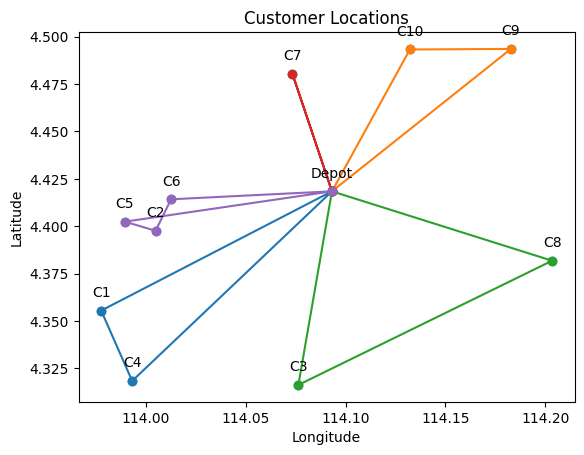

Total Distance = 129.2202 km
Total Cost = RM 155.06

Vehicle 1 (Type A):
Round Trip Distance:10.347 km, Cost: RM 12.42, Demand:3
Depot -> C3 (10.347 km)

Vehicle 2 (Type A):
Round Trip Distance:35.966 km, Cost: RM 43.16, Demand:21
Depot -> C10 (8.436 km) -> C1 (20.696 km) -> C6 (6.834 km)

Vehicle 3 (Type A):
Round Trip Distance:45.907 km, Cost: RM 55.09, Demand:16
Depot -> C9 (11.691 km) -> C4 (25.809 km) -> C5 (8.408 km)

Vehicle 4 (Type A):
Round Trip Distance:9.072 km, Cost: RM 10.89, Demand:8
Depot -> C2 (9.072 km)

Vehicle 5 (Type A):
Round Trip Distance:27.928 km, Cost: RM 33.51, Demand:9
Depot -> C8 (11.612 km) -> C7 (16.316 km)



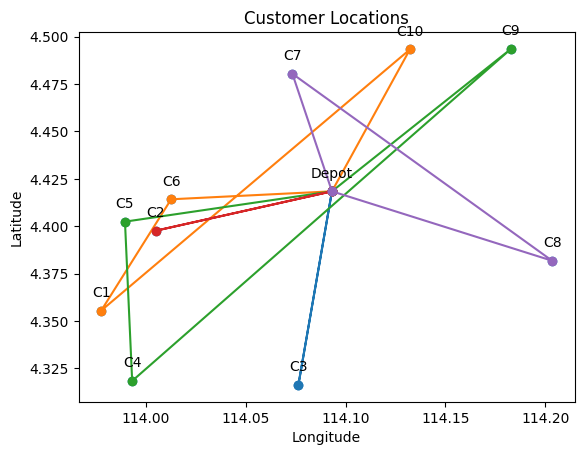

Iteration 1: Best Cost = 147.73134264746182
Iteration 2: Best Cost = 141.22072901589263
Iteration 3: Best Cost = 140.82353548303496
Iteration 4: Best Cost = 139.37334993464557
Iteration 5: Best Cost = 132.68930993816636
Iteration 6: Best Cost = 132.62009147967126
Iteration 7: Best Cost = 126.27235888043803
Iteration 8: Best Cost = 125.81440096058834
Iteration 9: Best Cost = 105.08390960999235
Iteration 10: Best Cost = 85.97237868453627
Iteration 11: Best Cost = 85.97237868453627
Iteration 12: Best Cost = 85.97237868453627
Iteration 13: Best Cost = 85.97237868453627
Iteration 14: Best Cost = 85.97237868453627
Iteration 15: Best Cost = 85.97237868453627
Iteration 16: Best Cost = 85.97237868453627
Iteration 17: Best Cost = 85.97237868453627
Iteration 18: Best Cost = 85.97237868453627
Iteration 19: Best Cost = 85.97237868453627
Iteration 20: Best Cost = 85.97237868453627
Iteration 21: Best Cost = 85.97237868453627
Iteration 22: Best Cost = 85.97237868453627
Iteration 23: Best Cost = 85.972

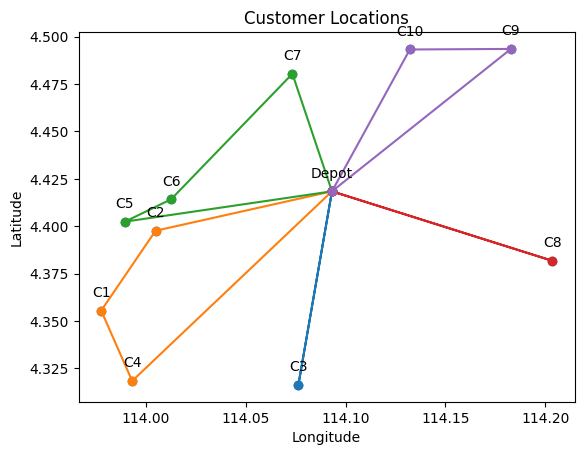

Total Distance = 115.1991 km
Total Cost = RM 152.46

Vehicle 1 (Type A):
Round Trip Distance:13.152 km, Cost: RM 15.78, Demand:5
Depot -> C1 (13.152 km)

Vehicle 2 (Type A):
Round Trip Distance:21.931 km, Cost: RM 26.32, Demand:8
Depot -> C5 (10.483 km) -> C7 (11.448 km)

Vehicle 3 (Type B):
Round Trip Distance:47.418 km, Cost: RM 71.13, Demand:27
Depot -> C4 (14.142 km) -> C2 (8.006 km) -> C9 (20.21 km) -> C10 (5.06 km)

Vehicle 4 (Type A):
Round Trip Distance:8.061 km, Cost: RM 9.67, Demand:8
Depot -> C6 (8.061 km)

Vehicle 5 (Type A):
Round Trip Distance:24.637 km, Cost: RM 29.56, Demand:9
Depot -> C3 (10.347 km) -> C8 (14.29 km)



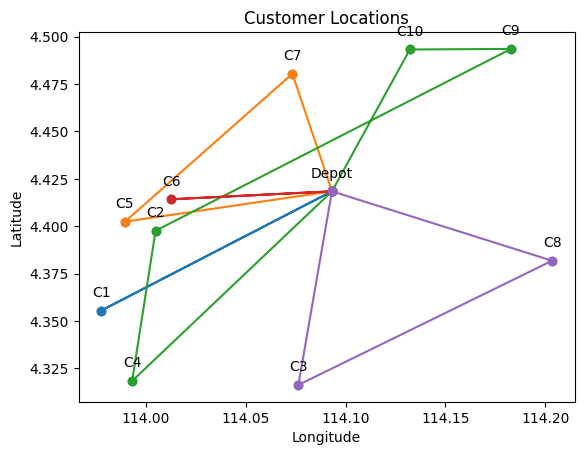

Iteration 1: Best Cost = 150.90831437740692
Iteration 2: Best Cost = 140.65368829654724
Iteration 3: Best Cost = 135.54305916990674
Iteration 4: Best Cost = 132.58702519882488
Iteration 5: Best Cost = 130.92906844233553
Iteration 6: Best Cost = 122.69341176318954
Iteration 7: Best Cost = 122.38619191543043
Iteration 8: Best Cost = 121.39736309915924
Iteration 9: Best Cost = 120.96115788758087
Iteration 10: Best Cost = 112.7255012084349
Iteration 11: Best Cost = 111.71160578021794
Iteration 12: Best Cost = 111.71160578021794
Iteration 13: Best Cost = 111.71160578021794
Iteration 14: Best Cost = 111.71160578021794
Iteration 15: Best Cost = 111.71160578021794
Iteration 16: Best Cost = 111.71160578021794
Iteration 17: Best Cost = 111.71160578021794
Iteration 18: Best Cost = 111.71160578021794
Iteration 19: Best Cost = 111.71160578021794
Iteration 20: Best Cost = 111.71160578021794
Iteration 21: Best Cost = 111.71160578021794
Iteration 22: Best Cost = 111.71160578021794
Iteration 23: Best C

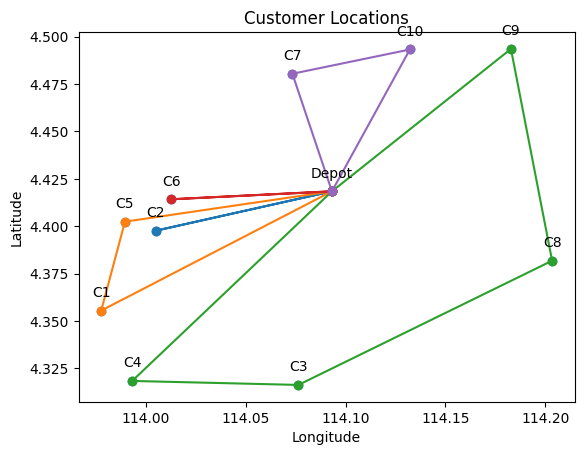

In [327]:
summary = []

for i in range(2,7):
    for j in range(20):
        solution = gen_route(i,L,C,D)
        Dist, g_dist, g_cost, g_demand, g_vehicle = calc_dist(solution,vehicles,dist_matrix,D,C)
        report(solution,g_dist,g_cost,g_vehicle,g_demand,Dist)
        plot(solution,x,y,data,f"{i}_{j+1}_i")

        ts_sol = tabu(solution,20,100,vehicles,dist_matrix,D,L,C)
        tsDist, ts_dist, ts_cost, ts_demand, ts_vehicle = calc_dist(ts_sol,vehicles,dist_matrix,D,C)

        report(ts_sol,ts_dist,ts_cost,ts_vehicle,ts_demand,tsDist)
        plot(ts_sol,x,y,data,f"{i}_{j+1}_f")
        summary.append([i,j,sum(g_dist),sum(g_cost),sum(ts_dist),sum(ts_cost),g_vehicle.count("Type A"),g_vehicle.count("Type B")])


### Analysis of Results

In [328]:
df = pd.DataFrame(summary,columns=["Max Vehicles","Iterration","Total Distance (before)","Total Cost (before)","Total Distance (after)","Total Cost (after)","Type A Count","Type B Count"])
df2 = df[["Max Vehicles","Total Distance (before)","Total Cost (before)","Total Distance (after)","Total Cost (after)"]].groupby("Max Vehicles")
df2.mean()

,Total Distance (before),Total Cost (before),Total Distance (after),Total Cost (after)
Max Vehicles,,,,
2,131.247810,196.871716,79.410510,104.926028
3,130.343892,163.500522,76.203356,94.026466
4,123.085846,151.486536,75.025339,90.580835
5,124.102476,150.545009,74.690698,90.065830
6,122.182548,152.374434,74.854034,90.675882


In [329]:
df2.min()

,Total Distance (before),Total Cost (before),Total Distance (after),Total Cost (after)
Max Vehicles,,,,
2,103.260118,154.890178,69.529286,91.539849
3,108.467042,142.644717,65.431261,78.517513
4,86.676781,104.012137,64.205330,80.795743
5,106.914356,128.297227,63.387486,76.064983
6,98.262131,117.914557,66.280389,79.536467


In [330]:
# Number of solutions that incorporate Type B Vehicles
type_b = df[df["Type B Count"] != 0]
type_b[["Total Cost (after)","Total Distance (after)"]].mean()

Total Cost (after)        99.473046
Total Distance (after)    77.492643
dtype: float64

In [331]:
type_b_no_2 = type_b[df["Max Vehicles"] != 2]
len(type_b_no_2)

C:\Users\Tyler\AppData\Local\Temp\ipykernel_18060\2768189259.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  type_b_no_2 = type_b[df["Max Vehicles"] != 2]


21